In [ ]:
!pip install astroscrappy
# and after resturt runtime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 2.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 47.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.3/18.3 MB 89.1 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.2
    Uninstalling numpy-2.0.2:
      Successfully uninstalled numpy-2.0.2
  Attempting uninstall: scipy
    Found existing installation: scipy 1.15.3
    Uninstalling scipy-1.15.3:
      Successfully uninstalled scipy-1.15.3
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.
tsfresh 0.21.0 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.11.4 which is incompatible.


# SDSS

## download one example in .fits format from SDSS

Firstly, download .csv file with appropriate SQL query from: https://skyserver.sdss.org/dr17/SearchTools/sql. It will include all required info about catalog objects, however in general we just need some cutout frames from it. Thus, we will only use the info about objects, like: run, rerun, cumcol, field. Ra, dec coordinates will further be derived from random cutout images based on this obtained information.

In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv('/content/Skyserver_CrossID5_24_2025 7_15_40 PM.csv', skiprows=[0])
df.head()

,objid,ra,dec,r,run,rerun,camcol,field,specobjid,class
0,1237645879562862699,15.896126,1.264845,19.04397,94,301,6,274,445958098402699264,STAR
1,1237645941291614227,49.627485,-1.041769,15.58940,109,301,1,100,1705795582662043648,STAR
2,1237645941824356481,40.272105,-0.642510,16.87430,109,301,2,37,1204744279872792576,STAR
3,1237645942898229350,40.582032,0.134770,15.52452,109,301,4,39,8253120482569902080,STAR
4,1237645942898229471,40.586648,0.087817,17.84707,109,301,4,39,8253121032325715968,STAR


In [ ]:
data_ex = df.iloc[7].to_dict()
data_ex

{'objid': 1237645942904455343,
 'ra': 54.7769799291301,
 'dec': 0.223335922826847,
 'r': 17.65989,
 'run': 109,
 'rerun': 301,
 'camcol': 4,
 'field': 134,
 'specobjid': 8254163643790546944,
 'class': 'STAR'}

In [ ]:
def download_sdss_fits(data_ex, out_dir='sdss_orig', url_type=1, get_only_fname=False):
    run = int(data_ex['run'])
    rerun = int(data_ex['rerun'])
    camcol = int(data_ex['camcol'])
    field = str(int(data_ex['field'])).zfill(4)
    band = 'r'
    run6 = str(run).zfill(6)

    path_sdss = f"frame-{band}-{run6}-{camcol}-{field}.fits.bz2"

    if get_only_fname:
        return path_sdss

    if url_type == 1:
        cmd = f'wget https://data.sdss.org/sas/dr17/eboss/photoObj/frames/{rerun}/{run}/{camcol}/{path_sdss}'
    else:
        cmd = f"wget https://dr18.sdss.org/sas/dr18/prior-surveys/sdss4-dr17-eboss/photo0bj/frames/{rerun}/{run}/{camcol}/{path_sdss}"
    cmd += f" -nc -P {out_dir}"
    print(cmd)
    !{cmd}

In [ ]:
from astropy.io import fits
import bz2

def bz2fits(path):
    decompressed_file = bz2.BZ2File(path_sdss)
    hdulist = fits.open(decompressed_file)

    hdu = fits.PrimaryHDU(data=hdulist[0].data, header=hdulist[0].header)

    save_path = f"fits_{path.split('.')[0]}.fits"
    hdu.writeto(save_path, overwrite=True)


In [ ]:
bz2fits(path_sdss)

## vis tools

In [ ]:
# @title old vis
# import numpy as np
# import matplotlib.pyplot as plt

# from astropy.io import fits
# from astropy.visualization import ZScaleInterval

# def vis_data(data, show_scale='norm'):
#     if isinstance(data, str):
#         hdulist = fits.open(data)
#         im = hdulist[0].data
#         hdulist.close()
#     elif isinstance(data, np.ndarray):
#         im = data
#     elif isinstance(data, list):
#         axs, fig = plt.subplots(1, len(data))

#     else:
#         raise Exception(f'provided data should has either str or np.ndarray format, got: {type(data)}')

#     plt.figure(figsize=(10,4))
#     if show_scale == 'log':
#         plt.imshow(np.log10(im), origin='lower')
#     elif show_scale == 'norm':
#         plt.imshow(im, vmin=np.percentile(im,5), vmax=np.percentile(im,95), cmap='gray')
#     else:
#         z1, z2 = ZScaleInterval().get_limits(im)
#         plt.imshow(im, cmap='Greys', origin='lower', vmin=z1, vmax=z2)

#     plt.colorbar()

#     # plt.close()


In [4]:
import matplotlib.pyplot as plt
plt.rc('image', origin='lower', cmap='Blues_r')

import numpy as np
import matplotlib.pyplot as plt

from astropy.io import fits
from astropy.visualization import ZScaleInterval

from __future__ import absolute_import, division, print_function, unicode_literals

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle

from astropy.stats import mad_std
from astropy.visualization import simple_norm, ImageNormalize
from astropy.visualization.stretch import HistEqStretch
from astropy.convolution import Gaussian2DKernel, convolve, convolve_fft

from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.stats import binned_statistic_2d

import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

def colorbar(obj=None, ax=None, size="5%", pad=0.1, side='right'):
    """
    Add a colorbar to `ax` (or to obj.axes if you pass in a mappable `obj`),
    with the bar on `side` and its tick‐labels printed on the *inside* edge.
    """
    # figure out which Axes to attach to
    if obj is not None:
        ax = obj.axes
    elif ax is None:
        ax = plt.gca()

    # make room for the colorbar
    divider = make_axes_locatable(ax)
    cax = divider.append_axes(side, size=size, pad=pad)

    # draw the colorbar
    cb = ax.figure.colorbar(obj, cax=cax)

    # now move the ticks & label to the inside edge
    # for vertical bar: ticks go left if the bar is on the right, or right if on the left
    if side in ('right', 'left'):
        # move ticks
        cb.ax.yaxis.set_ticks_position(side)
        # move label
        cb.ax.yaxis.set_label_position(side)
        # optional: hide the opposite spine to clean up
        cb.ax.spines['right'].set_visible(False)
    else:
        # for horizontal bar: analogous commands
        cb.ax.xaxis.set_ticks_position('bottom')
        cb.ax.xaxis.set_label_position('bottom')
        cb.ax.spines['top'].set_visible(False)

    # restore focus to original axes
    ax.figure.sca(ax)

    # return cb


def own_imshow(
    image,
    qq=None,
    mask=None,
    show_colorbar=True,
    show_axis=True,
    stretch='linear',
    r0=None,
    ax=None,
    get_params_only=False,
    **kwargs,
):
    """Simple wrapper around pyplot.imshow with percentile-based intensity scaling, optional colorbar, etc.

    :param image: Numpy 2d array to display
    :param qq: two-element tuple (or list) with quantiles that define lower and upper limits for image intensity normalization. Default is `[0.5, 99.5]`. Will be superseded by manually provided `vmin` and `vmax` arguments.
    :param mask: Mask to exclude image regions from intensity normalization, optional
    :param show_colorbar: Whether to show a colorbar alongside the image
    :param show_axis: Whether to show the axes around the image
    :param stretch: Image intensity stretching mode - e.g. `linear`, `log`, `asinh`, or anything else supported by Astropy visualization layer
    :param r0: Smoothing kernel size (sigma) to be applied, optional
    :param ax: Matplotlib Axes object to be used for plotting, optional
    :param \**kwargs: The rest of parameters will be directly passed to :func:`matplotlib.pyplot.imshow`

    """
    image = image.astype(np.double)
    good_idx = np.isfinite(image)

    if mask is not None:
        good_idx &= ~mask

    if np.sum(good_idx):
        if r0 is not None and r0 > 0:
            # First smooth the image
            kernel = Gaussian2DKernel(r0)
            image = convolve(image, kernel, mask=mask, boundary='extend')

        if qq is None and 'vmin' not in kwargs and 'vmax' not in kwargs:
            # Sane defaults for quantiles if no manual limits provided
            qq = [0.5, 99.5]

        if qq is not None:
            # Presente of qq quantiles overwrites vmin/vmax even if they are present
            kwargs['vmin'], kwargs['vmax'] = np.percentile(image[good_idx], qq)

        if not 'interpolation' in kwargs:
            # Rough heuristic to choose interpolation method based on image dimensions
            if image.shape[0] < 300 and image.shape[1] < 300:
                kwargs['interpolation'] = 'nearest'
            else:
                kwargs['interpolation'] = 'bicubic'

        if stretch and stretch != 'linear':
            if stretch == 'histeq':
                data = image
                if 'vmin' in kwargs:
                    data = data[data >= kwargs['vmin']]
                if 'vmax' in kwargs:
                    data = data[data <= kwargs['vmax']]

                kwargs['norm'] = ImageNormalize(
                    stretch=HistEqStretch(data),
                    vmin=kwargs.pop('vmin', None),
                    vmax=kwargs.pop('vmax', None),
                )
            else:
                kwargs['norm'] = simple_norm(
                    image,
                    stretch,
                    min_cut=kwargs.pop('vmin', None),
                    max_cut=kwargs.pop('vmax', None),
                    power=2,
                )

    if get_params_only:
        return kwargs

    if ax is None:
        ax = plt.gca()

    img = ax.imshow(image, **kwargs)
    if not show_axis:
        ax.set_axis_off()
    else:
        ax.set_axis_on()
    if show_colorbar:
        colorbar(img, ax=ax)
    else:
        # Mimic the extension of scaling limits if they are equal
        clim = img.get_clim()

        if clim[0] == clim[1]:
            img.set_clim(clim[0] - 0.1, clim[1] + 0.1)

    return img


In [ ]:
def load_image(entry):
    if isinstance(entry, np.ndarray):
        return entry
    elif isinstance(entry, str) and entry.endswith('.npy'):
        return np.load(entry)
    elif isinstance(entry, str) and entry.endswith('.fits') or entry.endswith('.bz2'):
        with fits.open(entry) as hdulist:
            return hdulist[0].data
    else:
        raise Exception(f'Each item in data list must be str or np.ndarray, got {type(entry)}')


def process_image(im, show_scale):
    if show_scale == 'log':
        im_proc = np.log10(np.clip(im, 1e-3, None))  # avoid log(0)
        return im_proc, {}
    elif show_scale == 'norm':
        vmin, vmax = np.percentile(im, 5), np.percentile(im, 95)
        return im, {'vmin': vmin, 'vmax': vmax, 'cmap': 'gray'}
    elif show_scale == 'stdpipe':
        return im, own_imshow(im, get_params_only=True)
    else:
        z1, z2 = ZScaleInterval().get_limits(im)
        return im, {'vmin': z1, 'vmax': z2, 'cmap': 'gray'}


def vis_data(data, show_scale='norm', c=True, save=False, save_name='img.png', titles=None, plot_shape=None):
    # Single image
    if isinstance(data, (str, np.ndarray)):
        im = load_image(data)
        im_proc, im_kwargs = process_image(im, show_scale)

        # plt.figure(figsize=(12, 6))
        img = plt.imshow(im_proc, origin='lower', **im_kwargs)
        if c: colorbar(img)
        # plt.axis('off')
        plt.tight_layout()
        if save:
            plt.savefig(save_name)
        else:
            plt.show()


    # Multiple images (triples or quadruples)
    elif isinstance(data, list) and 2 <= len(data):
        images = [load_image(d) for d in data]
        proc_images = [process_image(im, show_scale) for im in images]

        if plot_shape is None:
            fig, axs = plt.subplots(1, len(images), figsize=(5 * len(images), 5))
        else:
            assert len(plot_shape) == 2 and plot_shape[0] * plot_shape[1] == len(images), 'wrong plot shape'
            fig, axs = plt.subplots(*plot_shape, figsize=(3 * plot_shape[0], 3 * plot_shape[1]))
            axs = axs.flatten()

        if len(images) == 1:
            axs = [axs]  # make iterable if only one
            titles = ['data'] if titles is None else titles
        else:
            titles = ['PS1 (aligned)', 'SDSS DR17', 'PS1'] if titles is None else titles
            if len(images) == 4 and titles is None:
                titles.append('diff: SDSS - PS1 (aligned)')

        for i, (ax, (im_proc, im_kwargs)) in enumerate(zip(axs, proc_images)):
            img = ax.imshow(im_proc, origin='lower', **im_kwargs)
            ax.set_title(titles[i])
            if show_scale not in ['stdpipe', 'astro']:
                ax.set_xlabel(f'scale: {show_scale}')
            if c: colorbar(img, ax=ax)
            # ax.axis('off')

        plt.tight_layout()
        if save:
            plt.savefig(save_name)
        else:
            plt.show()

    else:
        raise Exception(f'Unsupported data type or number of images: {type(data)} with len={len(data) if isinstance(data, list) else "N/A"}')


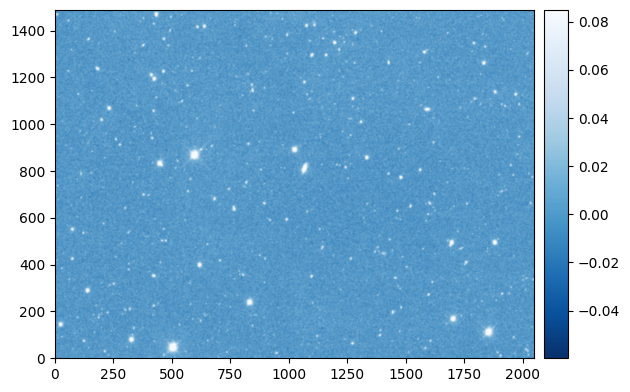

In [ ]:
vis_data(path_sdss, show_scale='stdpipe')

### vis imgaes

In [ ]:
import torch.nn as nn
import torch
import numpy as np


class Base2FourierFeatures(nn.Module):
    """
    Computes base-2 Fourier features for each channel of an input tensor.
    Code based on article: https://arxiv.org/abs/2107.00630

    Given input x of shape (B, C, H, W), and a range of exponents [start, stop)
    with step size `step`, this module produces:

        sin(2^n * 2π * x)
        cos(2^n * 2π * x)

    for each n in that range, yielding an output of shape
    (B, C * n_freqs * 2, H, W).
    """
    def __init__(self, start: int = 0, stop: int = 8, step: int = 1):
        super().__init__()
        self.start = start
        self.stop = stop
        self.step = step

        freqs = torch.arange(start, stop, step, dtype=torch.float32)
        self.register_buffer(
            'w',
            (2.0 ** freqs) * (2.0 * np.pi)
        )  # shape: (n_freqs,)
        self.n_freqs = self.w.shape[0]

    def forward(self, x: torch.Tensor) -> torch.Tensor:
        """
        x: Tensor of shape (B, C, H, W)
        returns: Tensor of shape (B, C * n_freqs * 2, H, W)
        """
        # x: (B, C, H, W)
        B, C, H, W = x.shape
        # reshape and broadcast w to (1, C, n_freqs, 1, 1)
        # so we can multiply against x.unsqueeze(2): (B, C, 1, H, W)
        w = self.w.view(1, 1, self.n_freqs, 1, 1)
        x_expanded = x.view(B, C, 1, H, W)

        # angular argument: (B, C, n_freqs, H, W)
        arg = w * x_expanded

        # now flatten the (C, n_freqs) dims into a single channel dim,
        # after computing sin and cos:
        sin_feat = torch.sin(arg)    # (B, C, n_freqs, H, W)
        cos_feat = torch.cos(arg)    # (B, C, n_freqs, H, W)

        # concatenate along the freq dimension, then merge with channels:
        # first: (B, C * n_freqs, H, W)
        sin_flat = sin_feat.view(B, C * self.n_freqs, H, W)
        cos_flat = cos_feat.view(B, C * self.n_freqs, H, W)

        out = torch.cat([sin_flat, cos_flat], dim=1)  # (B, 2*C*n_freqs, H, W)
        return out


In [ ]:
ns = list(range(1, 10))
fourier_transform = Base2FourierFeatures(start=ns[0], stop=ns[-1], step=1)

In [ ]:
im = load_image('/content/frame-r-000211-5-0357__128_cutout_001.npy')
im = lash_to_m1_1(im, s=s, Q=Q, scale_min=scale_min, scale_max=scale_max)

im = im.astype(np.float32)
imt = torch.from_numpy(im)
imt_full = imt.unsqueeze(0).unsqueeze(0)
# imt_full.shape
fur_feat = fourier_transform(imt_full).numpy()
fur_feat.shape

(1, 16, 128, 128)

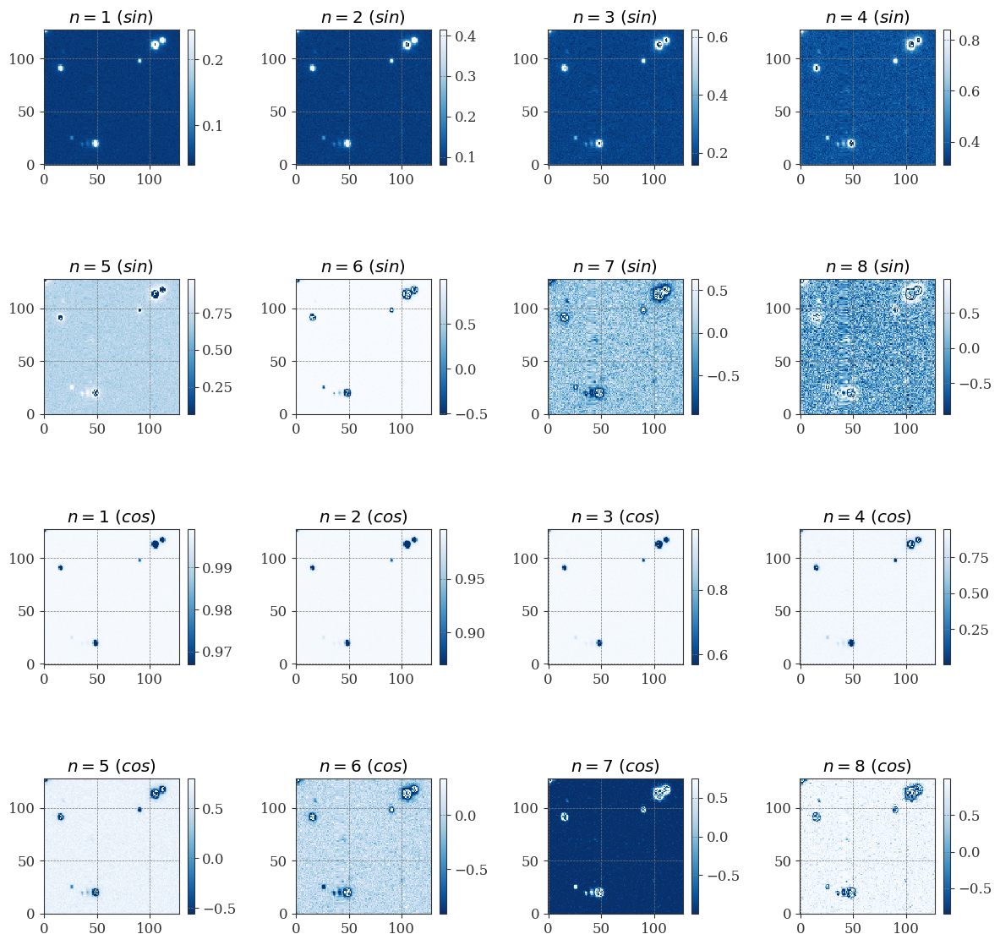

In [ ]:
titles = [f'$n = {n} \ ({t})$' for n, t in zip(ns[:-1], ['sin'] * len(ns))] + [f'$n = {n} \ ({t})$' for n, t in zip(ns[:-1], ['cos'] * len(ns))]
vis_data([*fur_feat[0]],
         titles=titles,
         show_scale='stdpipe',
         plot_shape=(4, 4), save=True, save_name='fur_feats_01.png')

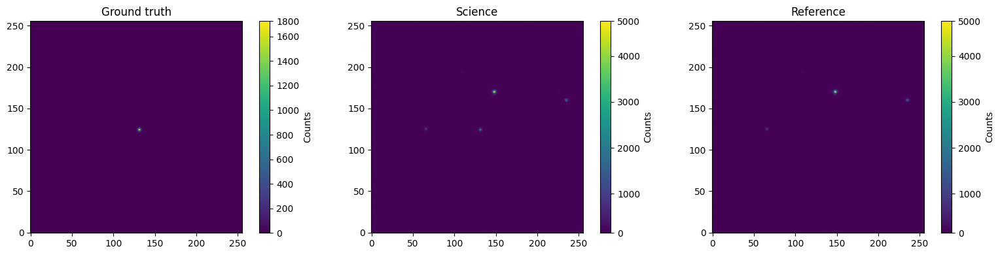

In [ ]:
def vis_triplet(science, reference, ground_truth, save_fig=False, info={}):
    fig, axs = plt.subplots(1, 3, figsize=(16, 4), sharex=False, sharey=False, gridspec_kw=None)

    norm_imshow(axs[0], ground_truth, zscale=False)
    norm_imshow(axs[1], science, zscale=False)
    norm_imshow(axs[2], reference, zscale=False)


    axs[0].set_title("Ground truth")
    axs[1].set_title("Science")
    axs[2].set_title("Reference")

    plt.tight_layout()
    plt.colorbar(axs[0].images[0], label='Counts')
    plt.colorbar(axs[1].images[0], label='Counts')
    plt.colorbar(axs[2].images[0], label='Counts')

    plt.title(f'Image cutout frame with ra={info.get('ra', None)}, dec={info.get('dec', None)}')

    plt.show()
    if save_fig: plt.savefig('example of three.png')

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle, ConnectionPatch
from matplotlib import gridspec
from PIL import Image
import numpy as np
import math

def show_cutouts(img_path, coords = (500, 650, 200, 242), col=True, save=False, save_name='ex.png'):
# === User parameters ===
    a, b, c, d = coords
    cutouts = [
        (a, b, 256, 256),
        (c, d, 256, 256),
    ]
    cols = 1  # Number of columns for cutout grid
    # ========================

    # Load image
    im = load_image(img_path)
    im_proc, im_kwargs = process_image(im, show_scale='stdpipe')
    n_cutouts = len(cutouts)
    rows = math.ceil(n_cutouts / cols)

    # Create figure and gridspec
    fig = plt.figure(figsize=(14, 6))
    fig.tight_layout()
    outer_gs = gridspec.GridSpec(1, 2, width_ratios=[1, 0.25], wspace=0.1)

    # Original image axis
    ax_orig = fig.add_subplot(outer_gs[0])
    img = ax_orig.imshow(im_proc, origin='lower', **im_kwargs)
    if col:
        colorbar(img, ax=ax_orig, side='left')
    ax_orig.axis('off')
    ax_orig.set_title('Original Image')

    # Draw rectangles on the original
    for (x, y, w, h) in cutouts:
        ax_orig.add_patch(Rectangle((x, y), w, h, fill=False, linewidth=1.2))

    # Sub-gridspec for cutouts
    inner_gs = outer_gs[1].subgridspec(rows, cols, wspace=0.2, hspace=0.2)

    for idx, (x, y, w, h) in enumerate(cutouts):
        r = idx // cols
        c = idx % cols
        ax_cut = fig.add_subplot(inner_gs[r, c])
        cut_img = im_proc[y:y+h, x:x+w]
        im, im_kwargs = process_image(cut_img, show_scale='stdpipe')
        ax_cut.imshow(im, origin='lower', **im_kwargs)
        ax_cut.axis('off')
        ax_cut.set_title(f'Cutout {idx+1}')

        # Correct corner-to-corner mapping:
        # Axes-fraction coords: (0,0)=bottom-left, (0,1)=top-left, (1,1)=top-right, (1,0)=bottom-right
        # Data coords: y increases downward, so pixel y=0 is top.
        corners = [(0, 0), (0, 1)]
        for cx, cy in corners:
            # Corner in cutout axes (fractional coords)
            xyA = (cx, cy)
            # Corresponding corner in original image data coords
            orig_x = x + (1 - cx) * w
            orig_y = y + cy * h
            xyB = (orig_x, orig_y)

            con = ConnectionPatch(
                xyA=xyA, coordsA=ax_cut.transAxes,
                xyB=xyB, coordsB=ax_orig.transData,
                arrowstyle='-', linewidth=1.5, linestyle='--', color='coral'
            )
            fig.add_artist(con)

    if save:
        plt.savefig(save_name)
    else:
        plt.show()

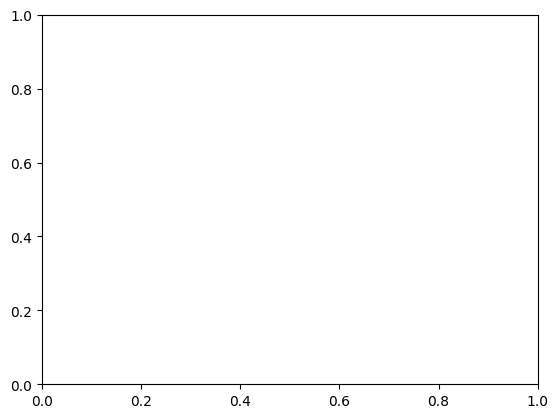

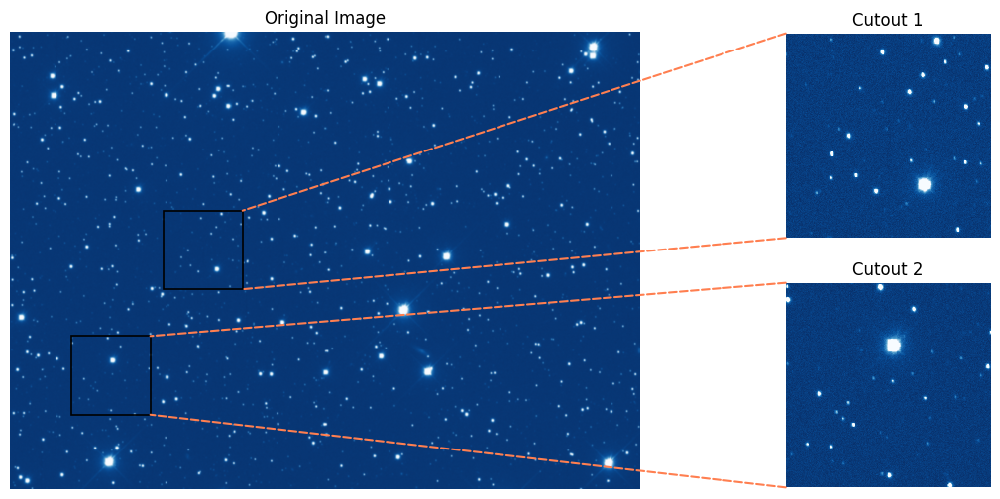

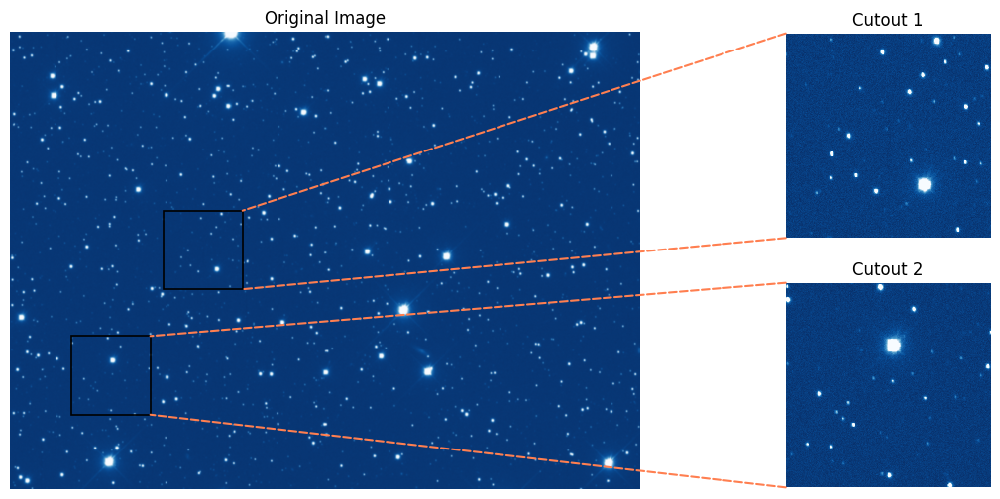

In [ ]:
show_cutouts("/content/frame-r-000211-5-0357.fits.bz2", save_name='cutouts.png', save=False, col=False)

some linearisation functions: based on this [link](https://astromsshin.github.io/science/code/Python_fits_image/index.html)

In [ ]:
# @title scale functions
def power_to_m1_1(self, data, get_max, power_gamma):
    c = get_max(data)
    self.transform_config['power'] = {'power_gamma': power_gamma, 'c': c}

    return 2 * (data / c) ** (1 / power_gamma) - 1

def power_from_m1_1(self, data):
    c = self.transform_config['power']['c']
    power_gamma = self.transform_config['power']['power_gamma']
    return c * ((data + 1) / 2) ** power_gamma



def arcsinh_to_m1_1(self, data, lambda_coeff, get_max):
    c = get_max(data)
    self.transform_config['arcsinh'] = {'lambda_coeff': lambda_coeff, 'c': c}
    return np.arcsinh(lambda_coeff * data) / np.arcsinh(lambda_coeff * c)

def arcsinh_from_m1_1(self, norm_data):
    c = self.transform_config['arcsinh']['c']
    lambda_coeff = self.transform_config['arcsinh']['lambda_coeff']
    return 1 / lambda_coeff * np.sinh(norm_data * np.arcsinh(lambda_coeff * c))



def percentile_asinh_to_m1_1(self, data, a, scale_max, scale_min):
    self.transform_config['percentile'] = {'a': a, 'scale_max': scale_max, 'scale_min': scale_min}

    norm_data = (data - scale_min) / (scale_max - scale_min)
    norm_stretched = np.arcsinh(norm_data / a) / np.arcsinh(1 / a)

    return 2 * norm_stretched - 1

def percentile_asinh_from_m1_1(self, norm_data):
    a = self.transform_config['percentile']['a']
    scale_max = self.transform_config['percentile']['scale_max']
    scale_min = self.transform_config['percentile']['scale_min']

    norm_stretched = (norm_data + 1) / 2
    norm_data = np.sinh(norm_stretched * np.arcsinh(1 / a)) * a
    return scale_min + (scale_max - scale_min) * norm_data



def log_to_m1_1(self, data, scale_max, scale_min):
    self.transform_config['log'] = {'scale_max': scale_max, 'scale_min': scale_min}

    log_image = np.log(data)
    log_vmin = np.log(scale_min)
    log_vmax = np.log(scale_max )

    normalized = (log_image - log_vmin) / (log_vmax - log_vmin)
    return 2 * normalized - 1

def log_from_m1_1(self, norm_data):
    scale_max = self.transform_config['log']['scale_max']
    scale_min = self.transform_config['log']['scale_min']

    log_vmin = np.log(scale_min)
    log_vmax = np.log(scale_max)
    normalized = (norm_data + 1) / 2
    log_image = np.exp(normalized * (log_vmax - log_vmin) + log_vmin)
    return log_image



def sinh_to_m1_1(self, data, sinh_beta, scale_max, scale_min):
    self.transform_config['sinh'] = {'sinh_beta': sinh_beta, 'scale_max': scale_max, 'scale_min': scale_min}

    norm_data = (data - scale_min) / (scale_max - scale_min)
    stretched = np.sinh(sinh_beta * norm_data) / np.sinh(sinh_beta)
    return 2 * stretched - 1

def sinh_from_m1_1(self, norm_data):
    sinh_beta = self.transform_config['sinh']['sinh_beta']
    scale_max = self.transform_config['sinh']['scale_max']
    scale_min = self.transform_config['sinh']['scale_min']

    stretched = (norm_data + 1) / 2
    norm_data = np.sinh(stretched * sinh_beta) / sinh_beta
    return scale_min + (scale_max - scale_min) * norm_data



def zscale_sinh_to_m1_1(self, data, contrast, zsinh_beta):
    self.transform_config['zscale'] = {'contrast': contrast, 'zsinh_beta': zsinh_beta}

    interval = ZScaleInterval(contrast=contrast)
    vmin, vmax = interval.get_limits(data)

    self.transform_config['zscale']['vmin'] = vmin
    self.transform_config['zscale']['vmax'] = vmax

    normalized = np.clip((data - vmin) / (vmax - vmin), 0, 1)
    stretched = np.sinh(zsinh_beta * normalized) / np.sinh(zsinh_beta)

    return 2 * stretched - 1

def zscale_sinh_from_m1_1(self, norm_data):
    contrast = self.transform_config['zscale']['contrast']
    sinh_beta = self.transform_config['zscale']['zsinh_beta']
    vmin = self.transform_config['zscale']['vmin']
    vmax = self.transform_config['zscale']['vmax']

    stretched = (norm_data + 1) / 2
    normalized = np.sinh(stretched * sinh_beta) / sinh_beta
    return vmin + (vmax - vmin) * normalized



def robust_to_m1_1(self, data, sigma_clip):
    median = np.median(data)
    mad = np.median(np.abs(data - median))

    # Define robust range
    vmin = median - sigma_clip * mad * 1.4826  # 1.4826 converts MAD to std
    vmax = median + sigma_clip * mad * 1.4826

    self.transform_config['robust'] = {'vmin': vmin, 'vmax': vmax, 'sigma_clip': sigma_clip, 'median': median, 'mad': mad}

    # Normalize and apply tanh for smooth clipping
    normalized = (data - median) / (sigma_clip * mad * 1.4826)
    return np.tanh(normalized)

def robust_from_m1_1(self, norm_data):
    sigma_clip = self.transform_config['robust']['sigma_clip']
    median = self.transform_config['robust']['median']
    mad = self.transform_config['robust']['mad']

    unnormalized = np.arctanh(np.clip(norm_data, -0.999, 0.999))
    return unnormalized * (sigma_clip * mad * 1.4826) + median



In [ ]:
# @title scale functions

import numpy as np
from astropy.visualization import MinMaxInterval, LinearStretch
from astropy.visualization import PercentileInterval, LogStretch
from astropy.visualization import ManualInterval, SqrtStretch
from astropy.visualization import AsinhStretch
from astropy.visualization import PowerStretch


def linear_to_m1_1(self, data):
    interval = MinMaxInterval()
    vmin, vmax = interval.get_limits(data)
    self.transform_config['linear'] = {'vmin': vmin, 'vmax': vmax}

    norm_data = (data - vmin) / (vmax - vmin)  # Scale to [0, 1]
    norm_data = norm_data * 2 - 1  # Scale to [-1, 1]
    return norm_data

def linear_from_m1_1(self, norm_data):
    vmin = self.transform_config['linear']['vmin']
    vmax = self.transform_config['linear']['vmax']

    norm_data = (norm_data + 1) / 2  # Scale back to [0, 1]
    data = norm_data * (vmax - vmin) + vmin
    return data



def alog_to_m1_1(self, data, a_coeff, q):
    self.transform_config['alog'] = {'a_coeff': a_coeff, 'q': q}

    interval = PercentileInterval(q)
    vmin, vmax = interval.get_limits(data)
    self.transform_config['alog'] = {'vmin': vmin, 'vmax': vmax, 'a_coeff': a_coeff}

    stretch = LogStretch(a=a_coeff)

    norm_data = stretch((data - vmin) / (vmax - vmin))  # Scale to [0, 1]
    norm_data = norm_data * 2 - 1  # Scale to [-1, 1]
    return norm_data

def alog_from_m1_1(self, norm_data):
    vmin = self.transform_config['alog']['vmin']
    vmax = self.transform_config['alog']['vmax']
    a_coeff = self.transform_config['alog']['a_coeff']
    stretch = LogStretch(a=a_coeff)

    norm_data = (norm_data + 1) / 2  # Scale back to [0, 1]
    inv_stretch = stretch.inverse
    data = inv_stretch(norm_data) * (vmax - vmin) + vmin
    return data



def sqrt_to_m1_1(self, data, scale_min, scale_max):
    interval = ManualInterval(vmin=scale_min, vmax=scale_max)
    stretch = SqrtStretch()
    self.transform_config['sqrt'] = {'scale_min': scale_min, 'scale_max': scale_max}

    norm_data = stretch((data - scale_min) / (scale_max - scale_min))  # Scale to [0, 1]
    norm_data = norm_data * 2 - 1  # Scale to [-1, 1]
    return norm_data

def sqrt_from_m1_1(self, norm_data):
    vmin = self.transform_config['sqrt']['scale_min']
    vmax = self.transform_config['sqrt']['scale_max']

    norm_data = (norm_data + 1) / 2  # Scale back to [0, 1]
    inv_stretch = SqrtStretch().inverse
    data = inv_stretch(norm_data) * (vmax - vmin) + vmin
    return data



def asinh_to_m1_1(self, data, as_coeff):
    interval = MinMaxInterval()
    vmin, vmax = interval.get_limits(data)
    stretch = AsinhStretch(a=as_coeff)

    self.transform_config['asinh'] = {'vmin': vmin, 'vmax': vmax, 'as_coeff': as_coeff}

    norm_data = stretch((data - vmin) / (vmax - vmin))  # Scale to [0, 1]
    norm_data = norm_data * 2 - 1  # Scale to [-1, 1]
    return norm_data

def asinh_from_m1_1(self, norm_data):
    vmin = self.transform_config['asinh']['vmin']
    vmax = self.transform_config['asinh']['vmax']
    as_coeff = self.transform_config['asinh']['as_coeff']

    stretch = AsinhStretch(a=as_coeff)

    norm_data = (norm_data + 1) / 2  # Scale back to [0, 1]
    inv_stretch = stretch.inverse
    data = inv_stretch(norm_data) * (vmax - vmin) + vmin
    return data



def apower_to_m1_1(self, data, apower, q):
    interval = PercentileInterval(q)
    vmin, vmax = interval.get_limits(data)
    self.transform_config['apower'] = {'vmin': vmin, 'vmax': vmax, 'apower': apower}
    stretch = PowerStretch(a=apower)
    norm_data = stretch((data - vmin) / (vmax - vmin))  # Scale to [0, 1]
    norm_data = norm_data * 2 - 1  # Scale to [-1, 1]
    return norm_data

def apower_from_m1_1(self, norm_data):
    vmin = self.transform_config['apower']['vmin']
    vmax = self.transform_config['apower']['vmax']
    power = self.transform_config['apower']['apower']

    norm_data = (norm_data + 1) / 2  # Scale back to [0, 1]
    inv_stretch = PowerStretch(a=power).inverse
    data = inv_stretch(norm_data) * (vmax - vmin) + vmin
    return data



def aasinh_to_m1_1(self, data, stretch, q):
    """
    First clip by percentile, linearize to [0,1], then apply asinh stretch.
    """
    # percentile clip
    interval = PercentileInterval(q)
    vmin, vmax = interval.get_limits(data)
    # normalize to [0,1]
    lin = (data - vmin) / (vmax - vmin)
    # lin = np.clip(lin, 0.0, 1.0)
    # apply asinh stretch
    asc = AsinhStretch(a=stretch)
    stretched = asc(lin)
    # asinh(0)=0, asinh(1/stetch)=asinh(max); we know asc(1)=asinh(1/ a)
    s_max = np.asinh(1/ stretch)
    norm = stretched / s_max

    self.transform_config['aasinh'] = {
        'vmin': float(vmin), 'vmax': float(vmax),
        'stretch': stretch, 's_max': float(s_max)
    }
    return norm * 2.0 - 1.0

def aasinh_from_m1_1(self, norm_data):
    cfg = self.transform_config['aasinh']
    # undo [-1,1] → [0,1]
    norm = (norm_data + 1.0) / 2.0
    # undo stretch
    asc = AsinhStretch(a=cfg['stretch'])
    lin = asc.inverse(norm * cfg['s_max'])
    # undo percentile and minmax
    return lin * (cfg['vmax'] - cfg['vmin']) + cfg['vmin']


In [ ]:
# @title scale functions

from astropy.visualization import HistEqStretch, LogStretch, LuptonAsinhStretch, LuptonAsinhZscaleStretch

def hist_to_m1_1(self, data, scale_min, scale_max):
    self.transform_config['hist'] = {'scale_min': scale_min, 'scale_max': scale_max}
    norm_data = (data - scale_min) / (scale_max - scale_min)

    stretch = HistEqStretch(norm_data, norm_data)
    streched_data = stretch(data)
    norm_data = streched_data * 2 - 1  # Scale to [-1, 1]
    return norm_data

def hist_from_m1_1(self, norm_data):
    vmin = self.transform_config['hist']['scale_min']
    vmax = self.transform_config['hist']['scale_max']

    norm_data = (norm_data + 1) / 2  # Scale back to [0, 1]
    inv_stretch = HistEqStretch(norm_data, norm_data).inverse
    data = inv_stretch(norm_data) * (vmax - vmin) + vmin
    return data


def logs_to_m1_1(self, data, als_coeff, scale_min, scale_max):
    self.transform_config['logs'] = {'scale_min': scale_min, 'scale_max': scale_max, 'als_coeff': als_coeff}
    norm_data = (data - scale_min) / (scale_max - scale_min)

    stretch = LogStretch(a=als_coeff)
    streched_data = stretch(data)
    norm_data = streched_data * 2 - 1  # Scale to [-1, 1]
    return norm_data


def logs_from_m1_1(self, norm_data):
    vmin = self.transform_config['logs']['scale_min']
    vmax = self.transform_config['logs']['scale_max']
    als_coeff = self.transform_config['logs']['als_coeff']

    norm_data = (norm_data + 1) / 2  # Scale back to [0, 1]
    inv_stretch = LogStretch(a=als_coeff).inverse
    data = inv_stretch(norm_data) * (vmax - vmin) + vmin
    return data


def lash_to_m1_1(self, data, s, Q, scale_min, scale_max):
    self.transform_config['lash'] = {'scale_min': scale_min, 'scale_max': scale_max, 's': s, 'Q': Q}
    norm_data = (data - scale_min) / (scale_max - scale_min)

    stretch = LuptonAsinhStretch(stretch=s, Q=Q)
    streched_data = stretch(norm_data)
    norm_data = streched_data * 2 - 1  # Scale to [-1, 1]
    return norm_data

def lash_from_m1_1(self, norm_data):
    s = self.transform_config['lash']['s']
    Q = self.transform_config['lash']['Q']

    norm_data = (norm_data + 1) / 2  # Scale back to [0, 1]
    data = s / Q * np.sinh(norm_data / 0.1 * np.arcsinh(0.1 * Q))
    return data * (scale_max - scale_min) + scale_min

In [ ]:
class BaseNormalizer():
    def __init__(self, scale_min, scale_max):
        self.scale_min = scale_min
        self.scale_max = scale_max
        self.transform_config = {}

    def forward(self, data, forward_transform, t_params):
        self.transform_config[f'{forward_transform.__name__.split("_")[0]}'] = {'scale_min': self.scale_min,
                                                                               'scale_max': self.scale_max}

        clipped_data = np.clip(data, self.scale_min, self.scale_max)
        return forward_transform(self, clipped_data, **t_params)

    def inverse(self, norm_data, inverse_transform):
        return inverse_transform(self, norm_data)

transform = BaseNormalizer(scale_min=10, scale_max=1e7)

In [ ]:
# Example usage: Grid plots and error calculations
# Synthetic gradient
params = dict(scale_min=1e2, scale_max=0.75 * 1e6,
              get_max=lambda x: np.max(x), power_gamma=30.0,  # for power method
              lambda_coeff=42.0,  # for arcsinh
              a=30.0,  # for percentile asinh
              sinh_beta=0.6, # for sinh method,
              contrast=0.5, zsinh_beta=0.8,  # for zscale
              sigma_clip=0.3,  # for robust
              a_coeff=1000.0, q=99.5,  # for alog
              as_coeff=2.5,  # for asinh
              power=0.5,  # for power
              stretch=0.1,  # for aasinh,
              als_coeff=0.1,  # for logs
              s=0.07, Q=5.25  # for lash
              )

methods = inv_methods = [
                        'power',
                        'arcsinh',
                        # 'percentile',
                        'log',
                        'sinh',
                        'zscale',
                        'robust',

                        'linear',
                        # 'alog',
                        'sqrt',
                        # 'asinh',
                        # 'apower',
                        # 'aasinh',

                        # 'hist',
                        # 'logs',
                        'lash'


                    ]
scale_min = params['scale_min']
scale_max = params['scale_max']

In [ ]:
# @title scale wrappers
# Dispatcher functions
def scale_forward(method, p):
    funcs = {
        'power':  (power_to_m1_1, {'get_max': p['get_max'], 'power_gamma': p['power_gamma']}),
        'arcsinh': (arcsinh_to_m1_1,  {'lambda_coeff': p['lambda_coeff'], "get_max": p['get_max']}),
        'percentile': (percentile_asinh_to_m1_1, {'a': p['a'], 'scale_max': p['scale_max'], 'scale_min': p['scale_min']}),
        'log': (log_to_m1_1, {'scale_max': p['scale_max'], 'scale_min': p['scale_min']}),
        'sinh': (sinh_to_m1_1, {'sinh_beta': p['sinh_beta'], 'scale_max': p['scale_max'], 'scale_min': p['scale_min']}),
        'zscale': (zscale_sinh_to_m1_1, {'contrast': p['contrast'], 'zsinh_beta': p['zsinh_beta']}),
        'robust': (robust_to_m1_1, {'sigma_clip': p['sigma_clip']}),

        'linear': (linear_to_m1_1, {}),
        'alog': (alog_to_m1_1, {'a_coeff': p['a_coeff'], 'q': p['q']}),
        'sqrt': (sqrt_to_m1_1, {'scale_max': p['scale_max'], 'scale_min': p['scale_min']}),
        'asinh': (asinh_to_m1_1, {'as_coeff': p['as_coeff']}),
        'apower': (apower_to_m1_1, {'apower': p['power'], 'q': p['q']}),
        'aasinh': (aasinh_to_m1_1, {'stretch': p['stretch'], 'q': p['q']}),

        'hist': (hist_to_m1_1, {'scale_min': p['scale_min'], 'scale_max': p['scale_max']}),
        'logs': (logs_to_m1_1, {'als_coeff': p['als_coeff'], 'scale_min': p['scale_min'], 'scale_max': p['scale_max']}),
        'lash': (lash_to_m1_1, {'s': p['s'], 'Q': p['Q'], 'scale_min': p['scale_min'], 'scale_max': p['scale_max']})
    }

    return funcs[method]

def scale_inverse(method):
    funcs = {
        'power':  power_from_m1_1,
        'arcsinh': arcsinh_from_m1_1,
        'percentile': percentile_asinh_from_m1_1,
        'log': log_from_m1_1,
        'sinh': sinh_from_m1_1,
        'zscale': zscale_sinh_from_m1_1,
        'robust': robust_from_m1_1,

        'linear': linear_from_m1_1,
        'alog': alog_from_m1_1,
        'sqrt': sqrt_from_m1_1,
        'asinh': asinh_from_m1_1,
        'apower': apower_from_m1_1,
        'aasinh': aasinh_from_m1_1,

        'hist': hist_from_m1_1,
        'logs': logs_from_m1_1,
        'lash': lash_from_m1_1,
    }

    return funcs[method]


In [ ]:
np.sum(im <= scale_min), np.sum(im >= scale_max / 1000)

(np.int64(0), np.int64(57))

In [ ]:
scale_min = params['scale_min']
scale_max = params['scale_max']
im_norm = (im - scale_min) / (scale_max - scale_min)
print(f"max:{im_norm.max()}, min: {im_norm.min()}, mean: {np.mean(im_norm)}, 'medain: {np.median(im_norm)}")

s, Q = 0.005, 4
stretch = LuptonAsinhStretch(stretch=s, Q=Q)
streched_data = stretch(im_norm)
norm_data = streched_data * 2 - 1  # Scale to [-1, 1]
print(f"max:{norm_data.max()}, min: {norm_data.min()}, mean: {np.mean(norm_data)}, 'medain: {np.median(norm_data)}")


max:0.011918209744447199, min: 9.202294579218636e-05, mean: 0.00014476727769443902, 'medain: 0.0001306845946603814
max:0.5130987882992151, min: -0.96228443077409, mean: -0.9424705121709662, 'medain: -0.9464878453971961


In [ ]:
a = 1e2  # 1e4
b = 300
d = 1e4
c = scale_max


s, Q = 0.07, 5.25
a_norm = (a - scale_min) / (scale_max - scale_min)
b_norm = (b - scale_min) / (scale_max - scale_min)
c_norm = (c - scale_min) / (scale_max - scale_min)
d_norm = (d - scale_min) / (scale_max - scale_min)
im_norm = (im - scale_min) / (scale_max - scale_min)

stretch = LuptonAsinhStretch(stretch=s, Q=Q)
a_lup = stretch(a_norm)
b_lup = stretch(b_norm)
c_lup = stretch(c_norm)
d_lup = stretch(d_norm)
im_lup = stretch(im_norm)

a = a_lup * 2 - 1
b = b_lup * 2 - 1
c = c_lup * 2 - 1
d = d_lup * 2 - 1
im_ = im_lup * 2 - 1
print('lup', a, b, d, c)
print(np.max(im_), np.min(im_))
print(np.max(im), np.min(im))

lup -1.0 -0.9920544495932015 -0.6526521846118608 0.9904977145268401
-0.6804908290582996 -0.997258305976583
9037.465487360954 169.00800704956055


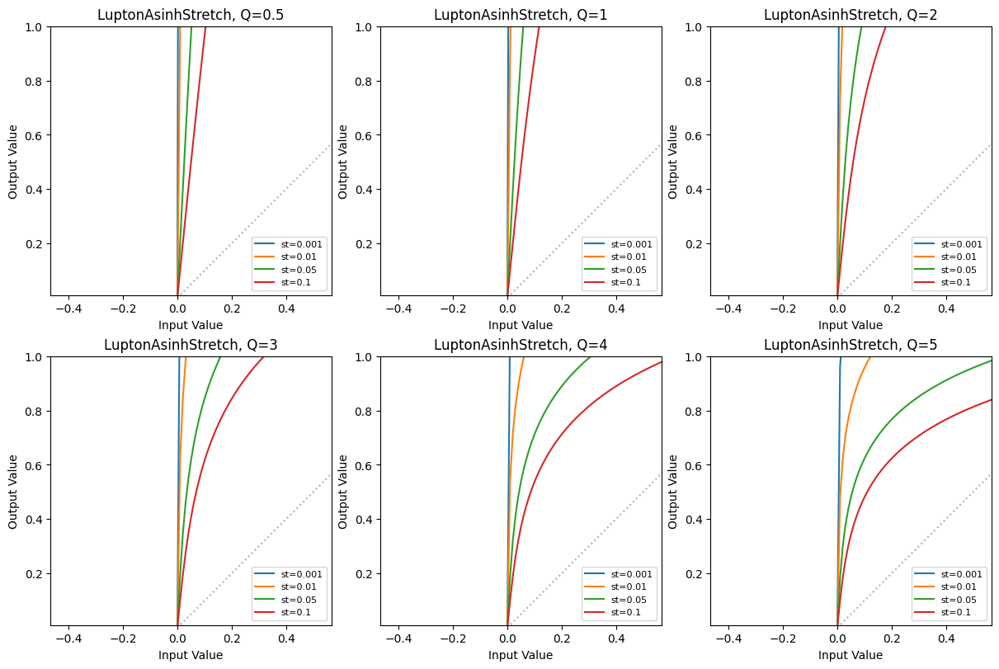

In [ ]:
import numpy as np
from astropy.visualization import LuptonAsinhStretch
from matplotlib import pyplot as plt
import warnings

warnings.filterwarnings('ignore')

fig, ax = plt.subplots(nrows=2, ncols=3, figsize=(12, 8),
                        layout='constrained')
ax = ax.ravel()

x = np.linspace(0, 1, 100)
stretches = (0.001, 0.01, 0.05, 0.1)

Qs = (0.5, 1, 2, 3, 4, 5)
for i, Q in enumerate(Qs):
    for st in stretches:
        stretch = LuptonAsinhStretch(stretch=st, Q=Q)
        label = f'{st=}'
        ax[i].plot(x, stretch(x, clip=True), label=label)

    ax[i].axis('equal')
    ax[i].plot(x, x, ls='dotted', color='k', alpha=0.3)
    ax[i].set_xlim(0, 0.1)
    ax[i].set_ylim(0.01, 1)
    ax[i].set_xlabel('Input Value')
    ax[i].set_ylabel('Output Value')
    ax[i].set_title(f'{stretch.__class__.__name__}, {Q=}')
    ax[i].legend(loc='lower right', fontsize=8)

In [ ]:
img_path = "/content/frame-r-000211-5-0357__128_cutout_001.npy"
im = load_image(img_path)

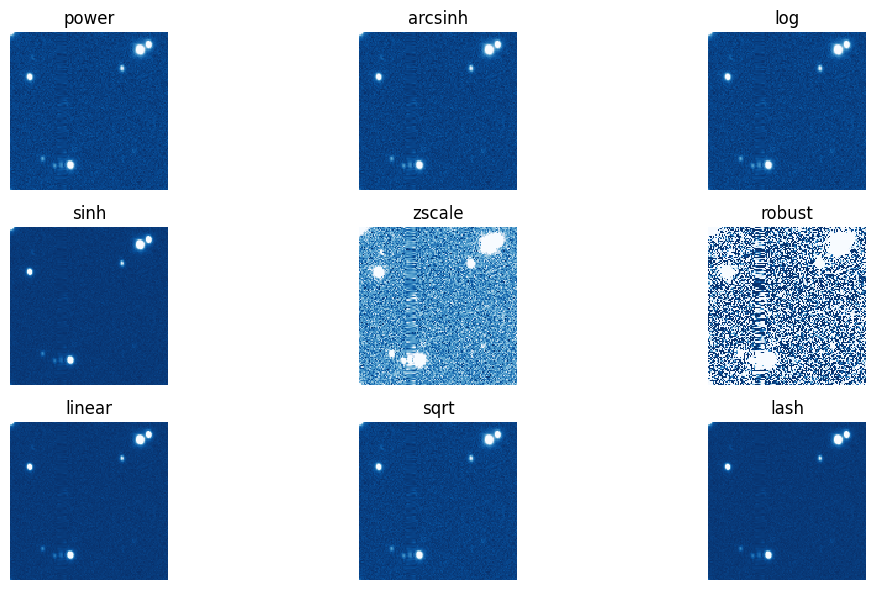

In [ ]:
# Forward grid
fig, axes = plt.subplots(3, 3, figsize=(12,6))
axes = axes.flatten()

for ax, m in zip(axes, methods):
    t_func, t_params = scale_forward(m, params)
    scaled_img = t_func(transform, im, **t_params)

    im_proc, im_kwargs = process_image(scaled_img, show_scale='stdpipe')
    ax.imshow(im_proc, **im_kwargs)

    ax.set_title(m)
    ax.axis('off')

for ax in axes[len(methods):]:
    ax.axis('off')

plt.tight_layout()
# plt.savefig('scalings.png', dpi=300)
plt.show()


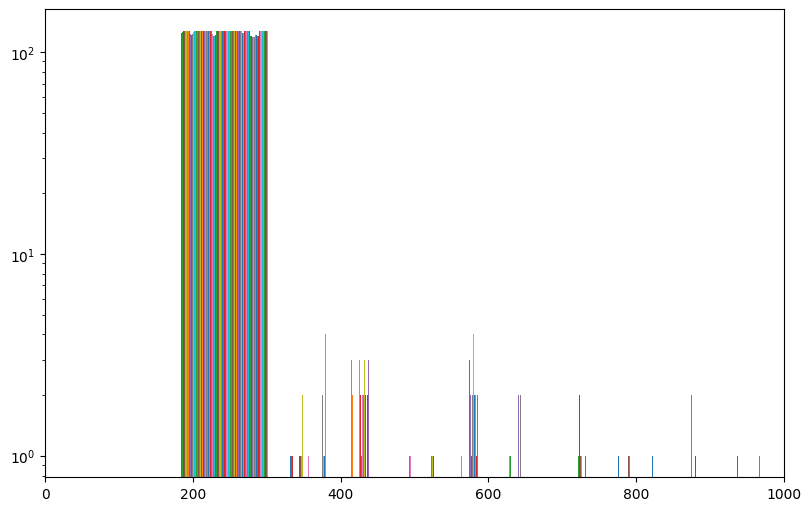

In [ ]:
plot_log = False
if plot_log:
    gamma = 0.005
    data = im.ravel()
    # log_bins = np.logspace(np.log10(min_val), np.log10(max_val), bins)

    # Plot setup
    fig, ax = plt.subplots(figsize=(8, 5), constrained_layout=True)

    # Compute *normalized* histogram of all pixels
    counts, edges, bar_container = plt.hist(data, bins=660)
    # Color each bar
    norm = PowerNorm(gamma=gamma, vmin=counts.min(), vmax=counts.max())
    for patch, count in zip(bar_container.patches, counts):
        patch.set_facecolor(LightToDarkBlue(norm(count)))
        patch.set_edgecolor('white')
        patch.set_alpha(0.9)

    plt.xscale('log')
    plt.yscale('log')

else:
    bins = 40
    min_val, max_val = im.min(), im.max()
    log_bins = np.logspace(np.log10(min_val), np.log10(max_val), bins)

    # Plot setup
    fig = plt.figure(figsize=(8, 5), constrained_layout=True)

    # Histogram
    counts, edges, patches = plt.hist(im, bins=60)
    # plt.xscale('log')
    plt.xlim(0, 1000)
    plt.yscale('log')

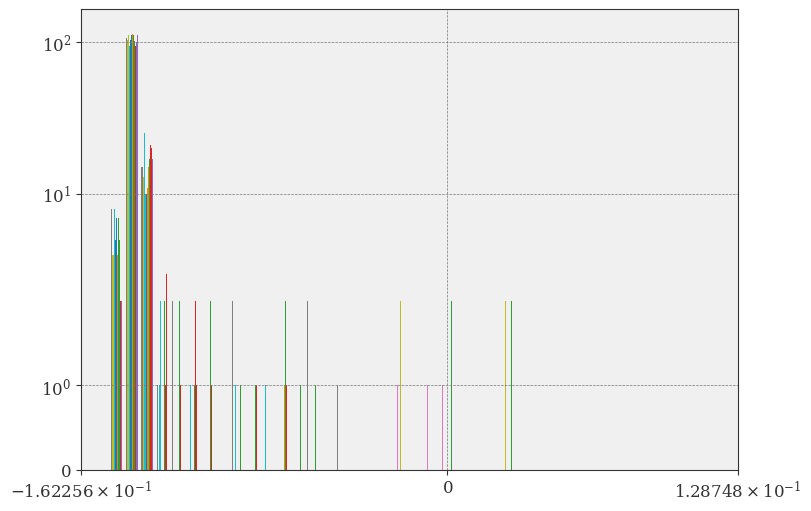

In [ ]:
bins = 40
min_val, max_val = fwds[-1].min(), fwds[-1].max()
# log_bins = np.logspace(np.log10(min_val), np.log10(max_val), bins)

# Plot setup
fig, ax = plt.subplots(figsize=(8, 5), constrained_layout=True)

# Histogram
counts, edges, patches = plt.hist(fwds[-1], bins=bins)
plt.xscale('symlog')
# plt.xlim(0, 1000)
ax.set_yscale('symlog')

In [ ]:
params

{'scale_min': 100.0,
 'scale_max': 750000.0,
 'get_max': <function __main__.<lambda>(x)>,
 'power_gamma': 30.0,
 'lambda_coeff': 42.0,
 'a': 30.0,
 'sinh_beta': 0.6,
 'contrast': 0.5,
 'zsinh_beta': 0.8,
 'sigma_clip': 0.3,
 'a_coeff': 1000.0,
 'q': 99.5,
 'as_coeff': 2.5,
 'power': 0.5,
 'stretch': 0.1,
 'als_coeff': 0.1,
 's': 0.07,
 'Q': 5.25}

In [ ]:
import pandas as pd


# Numerical error
results = []
fwds = []
im = load_image('/content/frame-r-000211-5-0357__128_cutout_001.npy')

for m in inv_methods:
    t_func, t_params = scale_forward(m, params)
    fwd = t_func(transform, im, **t_params)
    fwds.append(fwd)
    inv_func = scale_inverse(m)
    rec = inv_func(transform, fwd)

    diff = rec - im
    results.append({
        'method': m,
        'rmse': np.sqrt(np.mean(diff**2)),
        'max_abs_error': np.max(np.abs(diff)),
        'mean_fwd': np.mean(fwd),
        'max_fwd': np.max(fwd),
        'min_fwd': np.min(fwd),
        'max_min_ratio_fwd': np.abs(np.max(fwd)) / np.abs(np.min(fwd))
    })
df = pd.DataFrame(results).set_index('method')
df


,rmse,max_abs_error
method,,
power,2.766617e-13,9.094947e-12
arcsinh,1.453828e-13,7.275958e-12
log,9.936887e-14,7.275958e-12
sinh,1.142831e+01,5.144145e+02
zscale,1.647399e+02,8.812333e+03
robust,1.658854e+02,8.831015e+03
linear,1.424822e-13,9.094947e-13
sqrt,2.913619e-13,3.637979e-12
lash,8.097136e-13,2.728484e-12


In [ ]:
df[df['rmse'] > 1]

,rmse,max_abs_error
method,,
sinh,11.428309,514.414494
zscale,164.739924,8812.332920
robust,165.885437,8831.015454


In [ ]:
transform.transform_config

{'power': {'power_gamma': 30.0, 'c': np.float64(9037.465487360954)},
 'arcsinh': {'lambda_coeff': 42.0, 'c': np.float64(9037.465487360954)},
 'log': {'scale_max': 750000.0, 'scale_min': 100.0},
 'aasinh': {'vmin': 179.00762251257896,
  'vmax': 1269.2549471497746,
  'stretch': 0.1,
  's_max': 2.99822295029797},
 'lash': {'scale_min': 100.0, 'scale_max': 750000.0, 's': 0.07, 'Q': 5.25}}

In [6]:
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm, LinearSegmentedColormap

# === Your styling setup ===
blue_colors = ['#c6dbef', '#6baed6', '#2171b5', '#08306b']
LightToDarkBlue = LinearSegmentedColormap.from_list('LightToDarkBlue', blue_colors)

plt.rc('axes',   facecolor='#f0f0f0', edgecolor='#333333', grid=True)
plt.rc('grid',   linestyle='--', linewidth=0.5, color='#777777')
plt.rc('xtick',  direction='out', color='#333333')
plt.rc('ytick',  direction='out', color='#333333')
plt.rc('font',   family='serif', size=12)
# =========================

gamma = 0.1

fig, axs = plt.subplots(4, 3, figsize=(12, 6), constrained_layout=True)
axs = axs.flatten()

for ax, fwd, method in tqdm(zip(axs, fwds, methods), total=len(methods), desc='Plotting...'):
    # flatten the 2D array to 1D
    data = fwd.ravel()

    # Compute *normalized* histogram of all pixels
    counts, edges, bar_container = ax.hist(data, bins=60)
    # Color each bar
    norm = PowerNorm(gamma=gamma, vmin=counts.min(), vmax=counts.max())
    for patch, count in zip(bar_container.patches, counts):
        patch.set_facecolor(LightToDarkBlue(norm(count)))
        patch.set_edgecolor('white')
        patch.set_alpha(0.9)

    # Symmetric-log axes (if still desired; remove if not)
    linthresh = np.percentile(np.abs(data), 5)
    ax.set_xscale('symlog', linthresh=linthresh)
    ax.set_yscale('symlog', linthresh=0.01)

    ax.set_title(method, pad=10)
    ax.grid(True, which='both')
    ax.set_ylim(1)

# # Shared labels
# for ax in axs[3:]:
#     ax.set_xlabel('Flux')
# for ax in axs[::3]:
#     ax.set_ylabel('Density')

fig.suptitle('Pixel values distributions by each method',
             y=1.02, fontsize=16, family='serif')
plt.show()


## convert frames into counts w/ background reconstruction

In [ ]:
# @title orig slow
# from astropy.io import fits
# import sys
# import os
# import numpy as np
# from astropy.cosmology import *

# import warnings
# warnings.filterwarnings('ignore')


# def skybg_sdss(fits_image):
#     """A function for reconstructing background image of an SDSS image.
#     A low resolution of background image is stored in HDU2 of an SDSS image.
#     This function perform a bilinear interpolation to this sample background image.

#     :param fits_image:
#         Input SDSS image. This image should be the corrected frame type provided in the SDSS website.

#     :returns output:
#         A dictionary that contains background image and its name
#     """

#     from scipy import interpolate

#     hdu = fits.open(fits_image)
#     hdu2_data = hdu[2].data
#     ALLSKY = hdu2_data[0][0]
#     XINTERP = hdu2_data[0][1]
#     YINTERP = hdu2_data[0][2]

#     dim_y0 = ALLSKY.shape[0]
#     dim_x0 = ALLSKY.shape[1]
#     x = np.arange(0,dim_x0,1)
#     y = np.arange(0,dim_y0,1)
#     f = interpolate.interp2d(x, y, ALLSKY, kind='linear')
#     # f = interpolate.RegularGridInterpolator((x, y), ALLSKY, method="linear")

#     dim_y = hdu[0].shape[0]
#     dim_x = hdu[0].shape[1]
#     full_sky = f(XINTERP, YINTERP)
#     # full_sky = f((XINTERP, YINTERP))

#     ## write to a fits file:
#     out_fits_name = "skybg_%s" % fits_image
#     # out_fits_name = fits_image
#     header = fits.getheader(fits_image)
#     fits.writeto(out_fits_name, full_sky, header, overwrite=True)
#     #print ("produce %s" % out_fits_name)

#     output = {}
#     output['skybg'] = full_sky
#     output['skybg_name'] = out_fits_name

#     return output


# def get_gain_dark_variance(band,run,camcol):
#     #### get gain:
#     if camcol == 1:
#         if band==1:
#             gain = 1.62
#         elif band==2:
#             gain = 3.32
#         elif band==3:
#             gain = 4.71
#         elif band==4:
#             gain = 5.165
#         elif band==5:
#             gain = 4.745
#     elif camcol == 2:
#         if band==1:
#             if run > 1100:
#                 gain = 1.825
#             else:
#                 gain = 1.595;
#         elif band==2:
#             gain = 3.855
#         elif band==3:
#             gain = 4.6
#         elif band==4:
#             gain = 6.565
#         elif band==5:
#             gain = 5.155
#     elif camcol == 3:
#         if band==1:
#             gain = 1.59
#         elif band==2:
#             gain = 3.845
#         elif band==3:
#             gain = 4.72
#         elif band==4:
#             gain = 4.86
#         elif band==5:
#             gain = 4.885
#     elif camcol == 4:
#         if band==1:
#             gain = 1.6
#         elif band==2:
#             gain = 3.995
#         elif band==3:
#             gain = 4.76
#         elif band==4:
#             gain = 4.885
#         elif band==5:
#             gain = 4.775
#     elif camcol == 5:
#         if band==1:
#             gain = 1.47
#         elif band==2:
#             gain = 4.05
#         elif band==3:
#             gain = 4.725
#         elif band==4:
#             gain = 4.64
#         elif band==5:
#             gain = 3.48
#     elif camcol == 6:
#         if band==1:
#             gain = 2.17
#         elif band==2:
#             gain = 4.035
#         elif band==3:
#             gain = 4.895
#         elif band==4:
#             gain = 4.76
#         elif band==5:
#             gain = 4.69

#     #### get dark variance:
#     if camcol == 1:
#         if band==1:
#             dark_variance = 9.61
#         elif band==2:
#             dark_variance = 15.6025
#         elif band==3:
#             dark_variance = 1.8225
#         elif band==4:
#             dark_variance = 7.84
#         elif band==5:
#             dark_variance = 0.81
#     elif camcol == 2:
#         if band==1:
#             dark_variance = 12.6025
#         elif band==2:
#             dark_variance = 1.44
#         elif band==3:
#             dark_variance = 1
#         elif band==4:
#             if run < 1500:
#                 dark_variance = 5.76
#             elif run > 1500:
#                 dark_variance = 6.25
#         elif band==5:
#             dark_variance = 1
#     elif camcol == 3:
#         if band==1:
#             dark_variance = 8.7025
#         elif band==2:
#             dark_variance = 1.3225
#         elif band==3:
#             dark_variance = 1.3225
#         elif band==4:
#             dark_variance = 4.6225
#         elif band==5:
#             dark_variance = 1
#     elif camcol == 4:
#         if band==1:
#             dark_variance = 12.6025
#         elif band==2:
#             dark_variance = 1.96
#         elif band==3:
#             dark_variance = 1.3225
#         elif band==4:
#             if run < 1500:
#                 dark_variance = 6.25
#             elif run > 1500:
#                 dark_variance = 7.5625
#         elif band==5:
#             if run < 1500:
#                 dark_variance = 9.61
#             elif run > 1500:
#                 dark_variance = 12.6025
#     elif camcol == 5:
#         if band==1:
#             dark_variance = 9.3025
#         elif band==2:
#             dark_variance = 1.1025
#         elif band==3:
#             dark_variance = 0.81
#         elif band==4:
#             dark_variance = 7.84
#         elif band==5:
#             if run < 1500:
#                 dark_variance = 1.8225
#             elif run > 1500:
#                 dark_variance = 2.1025
#     elif camcol == 6:
#         if band==1:
#             dark_variance = 7.0225
#         elif band==2:
#             dark_variance = 1.8225
#         elif band==3:
#             dark_variance = 0.9025
#         elif band==4:
#             dark_variance = 5.0625
#         elif band==5:
#             dark_variance = 1.21

#     return gain, dark_variance


# def counts_img_sdss(fits_image, filter_name='sdss_r', name_out_fits=None, dir_name='sdss'):
#     """A function for constructing a image in counts from an input SDSS image

#     :param fits_image:
#         Input SDSS image (corrected frame type).

#     :param filter_name:
#         A string of filter name. Options are: 'sdss_u', 'sdss_g', 'sdss_r', 'sdss_i', and 'sdss_z'.

#     :returns name_out_fits:
#         Name of output FITS file. If None, a generic name will be used.
#     """

#     #print ("[Construct variance/sigma-square image of an SDSS image: %s]" % fits_image)
#     if filter_name == 'sdss_u':
#         band = 1
#     elif filter_name == 'sdss_g':
#         band = 2
#     elif filter_name == 'sdss_r':
#         band = 3
#     elif filter_name == 'sdss_i':
#         band = 4
#     elif filter_name == 'sdss_z':
#         band = 5
#     else:
#         print ("The filter_name is not recognized!")
#         sys.exit()

#     # get image count and flat-field calibrator or nmgy:
#     image_data = fits.open(fits_image)
#     nmgy = image_data[1].data
#     image_data.close()
#     image_count = fits.getdata(fits_image)
#     # get run and camcol
#     header = image_data[0].header
#     run = int(header['run'])
#     camcol = int(header['camcol'])
#     # dimension of SDSS image
#     SDSS_xmax = image_data[0].shape[1]
#     SDSS_ymax = image_data[0].shape[0]
#     # get the full-image sky count
#     output = skybg_sdss(fits_image)
#     sky_count = output['skybg']
#     #sky_count = skybg_data

#     # get the gain and dark variance
#     gain, dark_variance = get_gain_dark_variance(band,run,camcol)
#     # calculate full-image sigma-square:
#     sigma_sq_full = np.zeros((SDSS_ymax,SDSS_xmax))
#     real_counts_full = np.zeros((SDSS_ymax,SDSS_xmax))
#     # wo_sky_counts_zero = np.zeros((SDSS_ymax,SDSS_xmax))

#     for yy in range(0,SDSS_ymax):
#         for xx in range(0,SDSS_xmax):
#             DN = (image_count[yy][xx]/nmgy[xx]) + sky_count[yy][xx]

#             # nelec = DN * gain
#             # nelec_full[yy][xx] = nelec
#             real_counts_full[yy][xx] = DN
#             # wo_sky_counts_zero[yy][xx] = (image_count[yy][xx]/nmgy[xx])

#             # ---
#             # DN_err = ((DN/gain) + dark_variance)*nmgy[xx]*nmgy[xx]     ### in nanomaggy^2
#             # sigma_sq_full[yy][xx] = DN_err

#     # store the result into fits file:
#     header = fits.getheader(fits_image)

#     # if name_out_fits is None:
#         # name_out_fits = 'var_%s' % fits_image
#     os.makedirs(dir_name, exist_ok=True)
#     name_out_fits_counts = f'{dir_name}/counts_{fits_image}'

#     # name_out_wo_sky_fits_counts = 'counts_wo_sky_%s' % fits_image

#     # fits.writeto(name_out_fits,sigma_sq_full,header,overwrite=True)
#     print(real_counts_full)
#     fits.writeto(name_out_fits_counts, real_counts_full, header,overwrite=True)
#     # fits.writeto(name_out_wo_sky_fits_counts,wo_sky_counts_zero,header,overwrite=True)

#     return name_out_fits_counts, real_counts_full

In [ ]:
!pip install scipy==1.11.4

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 36.4/36.4 MB 20.3 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tsfresh 0.21.0 requires scipy>=1.14.0; python_version >= "3.10", but you have scipy 1.11.4 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.4 which is incompatible.


In [ ]:
import scipy

scipy.__version__

'1.11.4'

In [ ]:
from astropy.io import fits
from astropy.wcs import WCS

import os
import numpy as np
from scipy import interpolate
import warnings
warnings.filterwarnings('ignore')

# Pre-defined mappings for gain and dark variance
GAIN_MAP = {
    1: {1: 1.62, 2: 3.32, 3: 4.71, 4: 5.165, 5: 4.745},
    2: {1: lambda run: 1.825 if run > 1100 else 1.595, 2: 3.855, 3: 4.6, 4: 6.565, 5: 5.155},
    3: {1: 1.59, 2: 3.845, 3: 4.72, 4: 4.86, 5: 4.885},
    4: {1: 1.6, 2: 3.995, 3: 4.76, 4: 4.885, 5: 4.775},
    5: {1: 1.47, 2: 4.05, 3: 4.725, 4: 4.64, 5: 3.48},
    6: {1: 2.17, 2: 4.035, 3: 4.895, 4: 4.76, 5: 4.69}
}

DARK_MAP = {
    1: {1: 9.61, 2: 15.6025, 3: 1.8225, 4: 7.84, 5: 0.81},
    2: {1: 12.6025, 2: 1.44, 3: 1.0,
        4: lambda run: 5.76 if run < 1500 else 6.25,
        5: 1.0},
    3: {1: 8.7025, 2: 1.3225, 3: 1.3225, 4: 4.6225, 5: 1.0},
    4: {1: 12.6025, 2: 1.96, 3: 1.3225,
        4: lambda run: 6.25 if run < 1500 else 7.5625,
        5: lambda run: 9.61 if run < 1500 else 12.6025},
    5: {1: 9.3025, 2: 1.1025, 3: 0.81, 4: 7.84,
        5: lambda run: 1.8225 if run < 1500 else 2.1025},
    6: {1: 7.0225, 2: 1.8225, 3: 0.9025, 4: 5.0625, 5: 1.21}
}

FILTER_BAND = {
    'sdss_u': 1,
    'sdss_g': 2,
    'sdss_r': 3,
    'sdss_i': 4,
    'sdss_z': 5
}


def skybg_sdss(sky_data):
    """Reconstructs the SDSS background via bilinear interpolation."""
    ALLSKY, XINTERP, YINTERP = sky_data

    # Interpolate low-res sky to full resolution
    ny, nx = ALLSKY.shape
    f_interp = interpolate.interp2d(np.arange(nx), np.arange(ny), ALLSKY, kind='linear')
    full_sky = f_interp(XINTERP, YINTERP)

    # header = fits.getheader(fits_image)
    # out_name = f"skybg_{os.path.basename(fits_image)}"
    # fits.writeto(out_name, full_sky, header, overwrite=True)

    return full_sky


def get_gain_dark_variance(band, run, camcol):
    """Fetch gain and dark variance based on band, run, and camcol."""
    gain_entry = GAIN_MAP[camcol][band]
    gain = gain_entry(run) if callable(gain_entry) else gain_entry

    dark_entry = DARK_MAP[camcol][band]
    dark = dark_entry(run) if callable(dark_entry) else dark_entry

    return gain, dark


def counts_img_sdss(fits_image, filter_name='sdss_r', dir_name='sdss', save_data=False, with_size=False, size=128, get_return=True):
    """Generates a counts image FITS from an SDSS corrected frame."""
    band = FILTER_BAND.get(filter_name)
    if band is None:
        raise ValueError(f"Unrecognized filter: {filter_name}")

    with fits.open(fits_image) as hdul:
        image = hdul[0].data
        nmgy = hdul[1].data

        header = hdul[0].header
        ra, dec = header['RA'], header['DEC']
        # run = int(header['run'])
        # camcol = int(header['camcol'])

        sky_data = hdul[2].data[0]

    # Compute sky background
    sky = skybg_sdss(sky_data)

    # Vectorized DN calculation
    DN = image / nmgy + sky

    # Lookup gain & variance if needed in future
    # gain, dark_var = get_gain_dark_variance(band, run, camcol)

    if with_size:
        assert size is not None, f"size for cutout should be int, got {type(size)}"
        # Use the primary HDU and its WCS to compute the cutout
        data = DN
        w = WCS(header)

        # Convert RA,Dec to pixel coordinates
        px, py = w.all_world2pix(ra, dec, 0)
        px, py = int(px), int(py)

        half_size = size // 2

        ny, nx = data.shape
        # Ensure indices are within bounds
        x0 = max(px - half_size, 0)
        x1 = min(px + half_size, nx)
        y0 = max(py - half_size, 0)
        y1 = min(py + half_size, ny)

        assert (x1 - x0) < size or (y1 - y0) < size, "cutout size is smaller than expected."

        subimage = data[y0:y1, x0:x1]


    # Prepare output
    if save_data:
        os.makedirs(dir_name, exist_ok=True)

        if with_size:
            # Create a new WCS for the cutout
            w_cut = w.slice((slice(y0, y1), slice(x0, x1)))
            cutout_header = w_cut.to_header()

            out_path = os.path.join(dir_name, f'sub_counts_{os.path.basename(fits_image)}')
            hdu_cut = fits.PrimaryHDU(data=subimage, header=cutout_header)
            hdu_cut.writeto(out_path, overwrite=True)
            print(f'saved file in: {out_path}')

            if get_return:
                return out_path, subimage


        out_path = os.path.join(dir_name, f'counts_{os.path.basename(fits_image)}')
        fits.writeto(out_path, DN, header, overwrite=True)
        # print(f'saved file in: {out_path}')

        if get_return:
            return out_path, DN

    if get_return:
        return DN


In [ ]:
path_sdss = '/content/frame-r-000211-5-0357.fits.bz2'
*_, counts = counts_img_sdss(path_sdss, filter_name='sdss_r', save_data=True)

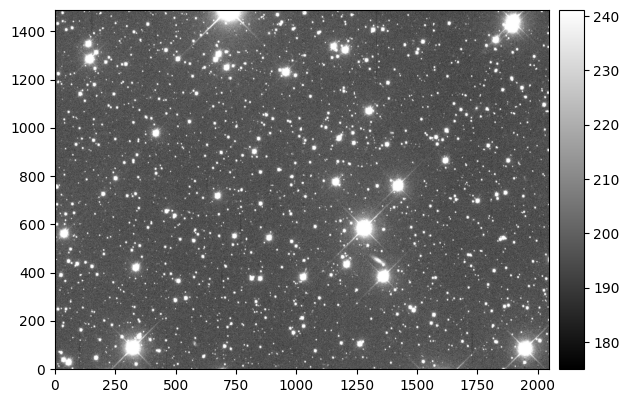

In [ ]:
vis_data(counts, 'astro')

In [ ]:
counts.shape, type(counts)

((1489, 2048), numpy.ndarray)

## create rundom cutouts

In [ ]:
# @title old version
import os
import numpy as np
from astropy.io import fits
from astropy.nddata import Cutout2D
from astropy.wcs import WCS


def create_random_cutouts(input_fits_path, cutout_size, num_cutouts, output_dir='sdss_cut'):
    """
    Generate multiple random cutouts from a FITS file and save them with indexed filenames.

    Parameters:
    - input_fits_path: str, path to the input FITS file.
    - cutout_size: tuple of int (ny, nx), size of each cutout.
    - num_cutouts: int, number of cutouts to generate.
    - output_dir: str, directory to save the cutout FITS files.
    """
    # Ensure the output directory exists
    os.makedirs(output_dir, exist_ok=True)

    # Open the FITS file
    with fits.open(input_fits_path) as hdu_list:
        hdu = hdu_list[0]
        data = hdu.data
        wcs = WCS(hdu.header)

        # Extract the original file name without extension
        base_filename = os.path.splitext(os.path.basename(input_fits_path))[0].split('.')[0]

        # Calculate margins to ensure the cutout is within bounds
        y_margin = cutout_size[0] // 2
        x_margin = cutout_size[1] // 2

        # Determine valid range for the center position
        y_center_range = (y_margin, data.shape[0] - y_margin)
        x_center_range = (x_margin, data.shape[1] - x_margin)

        for i in range(num_cutouts):
            # Randomly select center position
            y_center = np.random.randint(*y_center_range)
            x_center = np.random.randint(*x_center_range)
            position = (x_center, y_center)

            # Create cutout
            cutout = Cutout2D(
                data=data, position=position, size=cutout_size,
                wcs=getattr(hdu, "wcs", WCS(hdu.header)),
                # copy=True,
            )

            # Update header with cutout WCS
            header = hdu.header.copy()
            header.update(cutout.wcs.to_header())

            # Create new PrimaryHDU object for the cutout
            hdu_cutout = fits.PrimaryHDU(data=cutout.data, header=header)

            # Define the output filename
            output_filename = os.path.join(output_dir, f'{base_filename}__{cutout_size[0]}_cutout_{i + 1:03d}.fits')

            # Write cutout to new FITS file
            hdu_cutout.writeto(output_filename, overwrite=True)
            print(f'Saved cutout to {output_filename}')


# Example usage:
# create_random_cutouts('/content/frame-r-002728-4-0481.fits.bz2', (256, 256), 5, 'output_directory')


In [ ]:
counts_path = f"sdss/counts_{path_sdss}"
# create_random_cutouts(counts_path, (512, 512), 5)
# create_random_cutouts(counts_path, (1024, 1024), 5)
# create_random_cutouts(counts_path, (256, 256), 5)
# create_random_cutouts(counts_path, (128, 128), 5)

Saved cutout to sdss_cut/counts_frame-r-000109-4-0134__256_cutout_001.fits
Saved cutout to sdss_cut/counts_frame-r-000109-4-0134__256_cutout_002.fits
Saved cutout to sdss_cut/counts_frame-r-000109-4-0134__256_cutout_003.fits
Saved cutout to sdss_cut/counts_frame-r-000109-4-0134__256_cutout_004.fits
Saved cutout to sdss_cut/counts_frame-r-000109-4-0134__256_cutout_005.fits
Saved cutout to sdss_cut/counts_frame-r-000109-4-0134__128_cutout_001.fits
Saved cutout to sdss_cut/counts_frame-r-000109-4-0134__128_cutout_002.fits
Saved cutout to sdss_cut/counts_frame-r-000109-4-0134__128_cutout_003.fits
Saved cutout to sdss_cut/counts_frame-r-000109-4-0134__128_cutout_004.fits
Saved cutout to sdss_cut/counts_frame-r-000109-4-0134__128_cutout_005.fits


the same vertion but for ndarrays

In [ ]:
import os
import numpy as np
from collections import defaultdict


def create_cutouts(data:np.ndarray, base_save_fpath, cutout_size=(256, 256), num_cutouts=16, output_dir='cutouts', get_sample=False):
    """
    Generate multiple random cutouts from a FITS file and save them with indexed filenames.

    Parameters:
    - input_fits_path: str, path to the input FITS file.
    - cutout_size: tuple of int (ny, nx), size of each cutout.
    - num_cutouts: int, number of cutouts to generate.
    - output_dir: str, directory to save the cutout FITS files.
    """
    assert get_sample or (data.ndim == 3 and data.shape[0] == 2), 'should be concatenate 1 C frames'

    # Ensure the output directory exists
    if get_sample:
        os.makedirs(output_dir, exist_ok=True)

    # Calculate margins to ensure the cutout is within bounds
    y_margin = cutout_size[0] // 2
    x_margin = cutout_size[1] // 2

    # Determine valid range for the center position
    if get_sample:
        y_center_range = (y_margin, data.shape[1] - y_margin)
        x_center_range = (x_margin, data.shape[2] - x_margin)
    else:
        y_center_range = (y_margin, data.shape[2] - y_margin)
        x_center_range = (x_margin, data.shape[1] - x_margin)

    cutouts = []
    cut_info = defaultdict(list)

    for i in range(num_cutouts):
        # Randomly select center position
        y_center = np.random.randint(*y_center_range)
        x_center = np.random.randint(*x_center_range)

        # Create cutout
        a, b = x_center - cutout_size[0] // 2, x_center + cutout_size[0] // 2
        c, d = y_center - cutout_size[1] // 2, y_center + cutout_size[1] // 2
        cutout = data[:, a:b, c:d] if not get_sample else data[c:d, a:b]

        out_fname = os.path.join(output_dir, f'{base_save_fpath}__{cutout_size[0]}_cutout_{i + 1:03d}.npy')
        np.save(out_fname, cutout)

        cut_info['fname'].append(out_fname)
        cut_info['corners'].append((a, b, c, d))
        cut_info['base_path'].append(base_save_fpath.split('_')[-1])
        cut_info['cut_id'].append(i + 1)

    return cut_info


In [ ]:
from astropy.io import fits


counts_path = "/content/counts_frame-r-000211-5-0357.fits.bz2"
base_save_fpath = 'frame-r-000211-5-0357'
data = fits.getdata(counts_path)
create_cutouts(data, base_save_fpath, cutout_size=(64, 64), num_cutouts=1, output_dir='cutouts', get_sample=True)

defaultdict(list,
            {'fname': ['cutouts/frame-r-000211-5-0357__64_cutout_001.npy'],
             'corners': [(508, 572, 993, 1057)],
             'base_path': ['frame-r-000211-5-0357'],
             'cut_id': [1]})

SVD decomposition of point sources from SDSS DR17 catalog.

In [ ]:
import pandas as pd

df = pd.read_csv('/content/Skyserver_SQL5_26_2025 2_06_09 AM.csv', skiprows=[0])
df_unique = df.drop_duplicates(subset=['run', 'camcol', 'field'], ignore_index=True)
df_for_save = df_unique
df_for_save

,objid,ra,dec,r,run,rerun,camcol,field,specobjid,class
0,1237646381542606068,94.503047,0.475851,16.80027,211,301,5,357,1417553661621463040,STAR
1,1237646381542670881,94.597311,0.500819,17.08153,211,301,5,358,1417555585766811648,STAR
2,1237646381542736528,94.756596,0.545981,16.64779,211,301,5,359,1417551737476114432,STAR
3,1237646381542801444,94.826608,0.511579,15.49622,211,301,5,360,1417552012354021376,STAR
4,1237646381542867136,94.986275,0.462755,17.01908,211,301,5,361,1417541566993557504,STAR
...,...,...,...,...,...,...,...,...,...,...
3482,1237648720700899350,196.048371,-0.501095,17.03545,756,301,2,536,331088822966183936,STAR
3483,1237648720701030437,196.388241,-0.551504,19.34284,756,301,2,538,4561256732282869760,STAR
3484,1237648720701095959,196.529892,-0.504399,16.58819,756,301,2,539,331077552971999232,STAR
3485,1237648720701161499,196.644013,-0.513552,18.32140,756,301,2,540,8394843134065137664,STAR


In [ ]:
from astropy.io import fits
from astropy.wcs import WCS
from astropy.nddata import Cutout2D
from astropy.coordinates import SkyCoord
import astropy.units as u


def get_star(row, dir_name, cut_size=16):
    path_sdss = download_sdss_fits(row, get_only_fname=True)
    full_path = os.path.join(dir_name, path_sdss)

    with fits.open(full_path) as hdu_list:
        data = hdu_list[0].data
        header = hdu_list[0].header

    wcs = WCS(header)
    star_coord = SkyCoord(ra=row['ra'] * u.degree, dec=row['dec'] * u.degree)
    cutout = Cutout2D(data, star_coord, (32, 32), wcs=wcs.celestial).data

    x_pixel_max_coord, y_pixel_max_coord = np.unravel_index(cutout.argmax(), cutout.shape)
    cutout = cutout[x_pixel_max_coord - cut_size // 2:x_pixel_max_coord + cut_size // 2,
                    y_pixel_max_coord - cut_size // 2:y_pixel_max_coord + cut_size // 2]
    cutout /= cutout.max()

    return cutout

In [ ]:
import os
import numpy as np
from tqdm import tqdm
import warnings
from astropy.wcs import FITSFixedWarning
import time
import concurrent.futures


warnings.filterwarnings('ignore', category=FITSFixedWarning)

dir_name = "/content/content/sdss_orig/r_band.bz2"
save_dir = "/content/stars"
os.makedirs(save_dir, exist_ok=True)

cut_size = 16
n_stars = len(df_for_save)

def get_star_wrapper(row, save_path, dir_name, cut_size):
    star = get_star(row, dir_name, cut_size)
    np.save(save_path, star)

print(f"Started: {time.strftime('%Y-%m-/d ZH: %M:%S')}")
# Use ThreadPoolExecutor to perform parallel downloads
with concurrent.futures.ThreadPoolExecutor(max_workers=16) as executor:
    futures = []

    for idx, row in tqdm(df_for_save.iterrows(), total=n_stars, desc="prepare stars"):
        if idx == n_stars:
            break

        save_path = os.path.join(save_dir, f"{row['objid']}.npy")

        futures.append(executor.submit(get_star_wrapper, row, save_path, dir_name, cut_size))

    for future in tqdm(concurrent.futures.as_completed(futures), total=n_stars, desc="Save files"):  # progress bar
        try:
            future.result()
        except Exception as exc:
            print(f'Generated an exception: {exc}')

In [ ]:
!zip -r /content/stars.zip /content/stars

In [ ]:
save_dir = "/content/stars/"
stars_list = []
for save_path in os.listdir(save_dir):
    star = np.load(os.path.join(save_dir, save_path))
    if star.shape == (16, 16):
        stars_list.append(star.flatten())
    else:
        print(f"File {save_path} has shape {star.shape}")


X = np.stack(stars_list, axis=0)

File 1237646586632994890.npy has shape (9, 16)
File 1237648704065503879.npy has shape (9, 12)
File 1237648703519850515.npy has shape (9, 16)
File 1237646382079738335.npy has shape (9, 11)
File 1237648703521488997.npy has shape (16, 15)
File 1237648704601587782.npy has shape (12, 14)
File 1237648704057049169.npy has shape (9, 11)
File 1237646587175436955.npy has shape (16, 10)


In [ ]:
X.shape

(986, 256)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import TruncatedSVD

# plt.style.use('seaborn-whitegrid')  # Scientific style

# Perform SVD
n_components = 16
svd = TruncatedSVD(n_components=n_components, random_state=42)
svd.fit(X)


TruncatedSVD(n_components=16, random_state=42)

In [ ]:
import matplotlib.pyplot as plt
plt.rc('image', origin='lower', cmap='Blues_r')

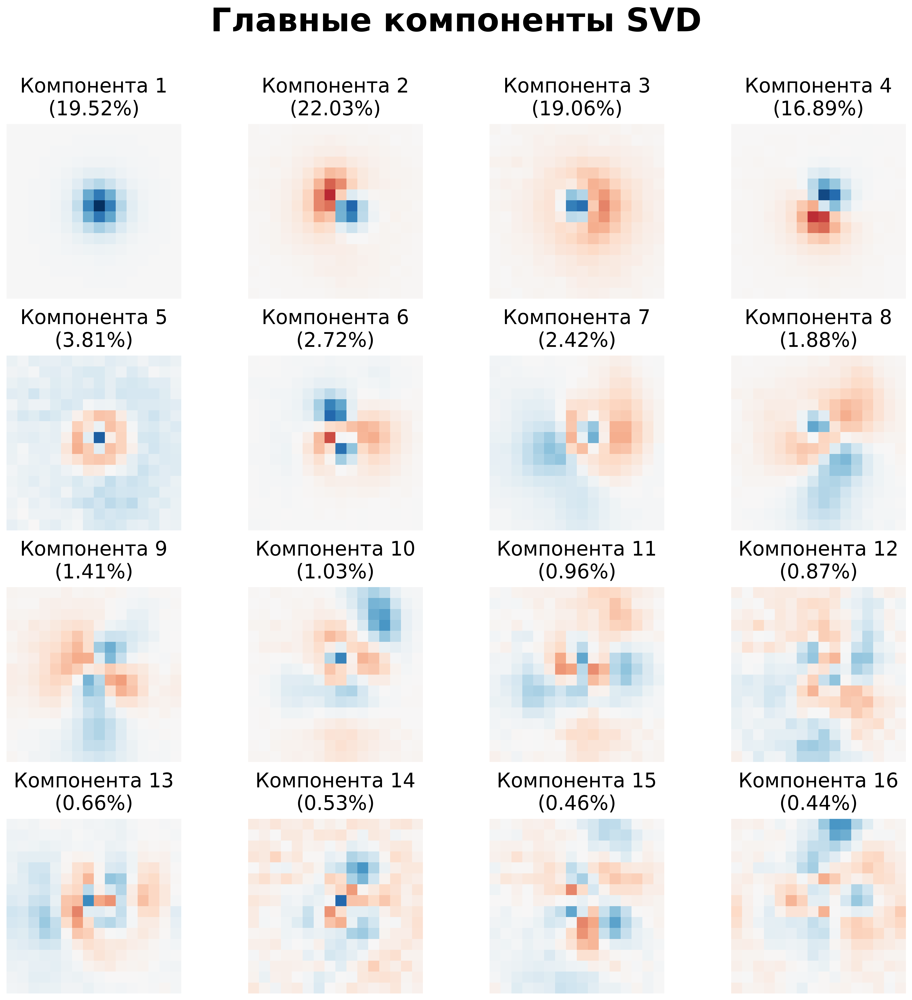

In [ ]:
components = svd.components_
explained_var = svd.explained_variance_ratio_

# Reshape components to 16x16
components_2d = [component.reshape(16, 16) for component in components]

# Create figure with subplots
row, col = (3, 3) if n_components == 9 else (4, 4)
fig, axs = plt.subplots(row, col, figsize=(15, 15),
                       facecolor='white',
                       dpi=300)  # High resolution for publications

# Calculate global min/max for consistent color scaling
vmax = max([np.abs(comp).max() for comp in components_2d])
vmin = -vmax  # Symmetric colormap

# Plot components with importance values
for i, ax in enumerate(axs.flat):
    if i < 16:
        im = ax.imshow(components_2d[i], cmap='RdBu',
                      vmin=vmin, vmax=vmax,
                      interpolation='nearest')
        ax.set_title(f'Компонента {i+1}\n({explained_var[i]:.2%})',
                    fontsize=22, pad=10)
        ax.axis('off')

        # # Add colorbar
        # cbar = fig.colorbar(im, ax=axs.ravel().tolist())
        # cbar.set_label('Component Value', fontsize=12)

# Adjust layout and save
plt.suptitle('Главные компоненты SVD',
            y=1.02, fontsize=36, weight='bold')
plt.tight_layout()

# Save in multiple formats
plt.savefig(f'svd_components_{n_components}.png', bbox_inches='tight', dpi=300)
plt.savefig(f'svd_components_{n_components}.pdf', bbox_inches='tight')

plt.show()

try to plot distribution of stars fluxes (`psfFlux_r`)

In [ ]:
import pandas as pd


# df_flux = pd.read_csv('/content/same_as_orig_with_counts_Skyserver_SQL5_28_2025 2_44_55 AM.csv', skiprows=[0])  # orig data
df_flux = pd.read_csv('/content/100k_for_fluxes_Skyserver_SQL5_28_2025 11_16_29 PM.csv', skiprows=[0])  # more data
df_unique_flux = df_flux
# df_unique_flux = df_flux.drop_duplicates(subset=['run', 'camcol', 'field'], ignore_index=True)
df_unique_flux.head()

,objid,ra,dec,r,psfFlux_r,nMgyPerCount_r,run,rerun,camcol,field,specobjid,class
0,1237645941824356481,40.272105,-0.642510,16.87430,179.33590,0.004869,109,301,2,37,1204744279872792576,STAR
1,1237645942906093728,58.521446,0.185547,18.74288,32.19213,0.004790,109,301,4,159,1721658786638227456,STAR
2,1237645943978393716,55.155703,0.889751,16.86986,181.44010,0.004885,109,301,6,137,8254178762075428864,STAR
3,1237645943978459301,55.272910,1.018140,16.78319,192.94160,0.004890,109,301,6,138,8254188107924264960,STAR
4,1237645943978590282,55.635177,1.046413,16.90494,131.61360,0.004875,109,301,6,140,8254209823278913536,STAR


In [ ]:
df_unique_flux['counts_r'] = df_unique_flux['psfFlux_r'] / df_unique_flux['nMgyPerCount_r']

In [ ]:
fluxes = df_unique_flux['psfFlux_r']
counts = df_unique_flux['counts_r']

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm, LinearSegmentedColormap
from scipy.stats import gaussian_kde

# Create a light-to-dark blue colormap: small counts light, big counts dark
blue_colors = ['#c6dbef', '#6baed6', '#2171b5', '#08306b']  # light to deep blues
LightToDarkBlue = LinearSegmentedColormap.from_list('LightToDarkBlue', blue_colors)

# Apply custom rcParams for styling
plt.rc('axes', facecolor='#f0f0f0', edgecolor='#333333', grid=True)
plt.rc('grid', linestyle='--', linewidth=0.5, color='#777777')
plt.rc('xtick', direction='out', color='#333333')
plt.rc('ytick', direction='out', color='#333333')
plt.rc('font', family='serif', size=12)


def plot_log_histogram(data, bins=50, log_scale_y=False, cmap=LightToDarkBlue,
                       gamma=0.1, bw_method=0.3, save=False, sub_title_x=''):
    """
    Plot a histogram with logarithmically spaced bins and optional log scaling on the y-axis,
    using a custom light-to-dark colormap where big bins map to darker colors,
    and overlay a smooth KDE approximation line computed in log-space.

    Parameters:
    - data: array-like of positive values
    - bins: number of bins (default: 50)
    - log_scale_y: whether to use a log scale on the y-axis (default: False)
    - cmap: a matplotlib colormap instance (default: LightToDarkBlue)
    - gamma: power-law exponent for PowerNorm (default: 0.1)
    - bw_method: bandwidth method for gaussian_kde on log(data) (float or str, default: 0.3)
    """
    # Filter out non-positive values
    data = data[data > 0]

    # Define log-spaced bins
    min_val, max_val = data.min(), data.max()
    log_bins = np.logspace(np.log10(min_val), np.log10(max_val), bins)

    # Plot setup
    fig, ax = plt.subplots(figsize=(8, 5), constrained_layout=True)

    # Histogram
    counts, edges, patches = ax.hist(data, bins=log_bins)

    # Apply PowerNorm to color mapping
    norm = PowerNorm(gamma=gamma, vmin=counts.min(), vmax=counts.max())
    for count, patch in zip(counts, patches):
        patch.set_facecolor(cmap(norm(count)))
        patch.set_edgecolor('white')
        patch.set_alpha(0.9)

    # Compute KDE in log-space
    log_data = np.log(data)
    kde = gaussian_kde(log_data, bw_method=bw_method)
    centers = (edges[:-1] + edges[1:]) / 2
    log_centers = np.log(centers)
    kde_log_vals = kde(log_centers)
    # Convert back to original scale density: f(x) = kde_log_vals / x
    f_vals = kde_log_vals / centers
    # Scale KDE to histogram counts: density * total_points * bin_width
    bin_widths = np.diff(edges)
    kde_scaled = f_vals * len(data) * bin_widths

    # Overlay KDE curve
    ax.plot(centers, kde_scaled, color='#A40000', linewidth=3,
            label=f'KDE (log-space, bw={bw_method})')

    # Scales, labels, and grid unchanged
    ax.set_xscale('log')
    if log_scale_y:
        ax.set_yscale('log')
    ax.set_title('Распределение потока точечных источников каталога SDSS DR17', pad=15)
    ax.set_xlabel(sub_title_x)
    ax.set_ylabel('Frequency' + (' (log scale)' if log_scale_y else ''))
    ax.tick_params(axis='x', which='both', labelrotation=45)
    ax.grid(True, which='both')

    # Legend for approximation line
    # ax.set_xlim(10 ** 2)
    # ax.set_xlim(1)
    ax.set_ylim(1)
    ax.legend()

    if save:
        plt.savefig('dist_fluxes.png' if sub_title_x.startswith('Fluxes') else 'dist_counts.png')
    else:
        plt.show()

    return kde


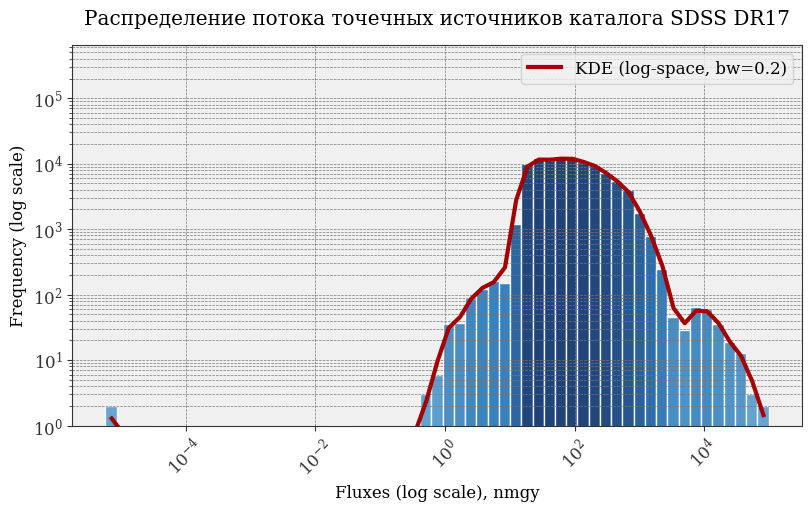

In [ ]:
# Example usage on your fluxes series
kde_flux = plot_log_histogram(fluxes, bins=60, log_scale_y=True, bw_method=0.2, save=True, sub_title_x="Fluxes (log scale), nmgy")

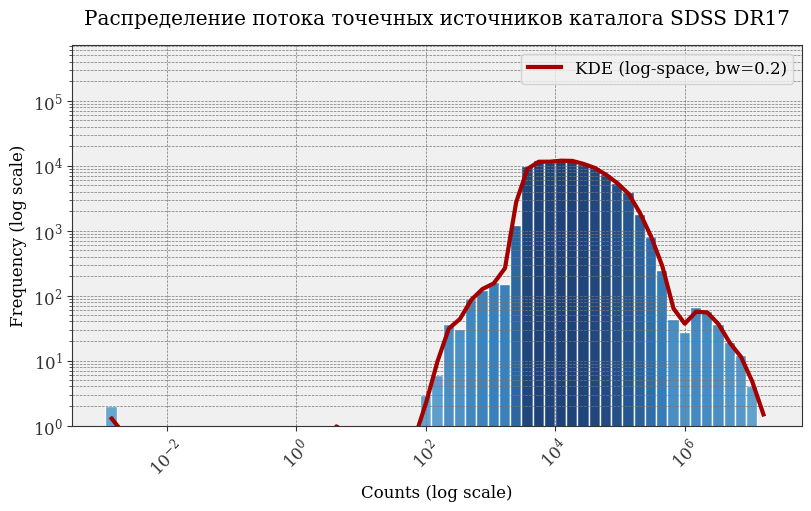

In [ ]:
# Example usage on your fluxes series
kde_counts = plot_log_histogram(counts, bins=60, log_scale_y=True, bw_method=0.2, save=True, sub_title_x='Counts (log scale)')

In [ ]:
# After computing kde = gaussian_kde(log_data, bw_method=...)
n_samples = 10
log_samples = kde_flux.resample(n_samples).flatten()  # shape (n_samples,)
sampled_fluxes = np.exp(log_samples)
sampled_fluxes

array([141.82883299, 693.87222193,  23.30302136, 413.77174956,
        72.94215947,  67.59119819, 118.25005858, 464.69858299,
        31.42848586,  76.97895044])

## gen transient

In [ ]:
!pip install -q photutils

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 12.7 MB/s eta 0:00:00


In [ ]:
# @title basic version
# from astropy.modeling.functional_models import Moffat2D
# from photutils.datasets import make_model_image
# from astropy.table import Table


# def gen_transient(data, get_triplets=False):
#     """
#     Generate a transient source in a given image.
#     """
#     *_, h, w = data.shape if not get_triplets else data

#     max_counts = 15000
#     flux = np.random.uniform(max_counts / 10, max_counts)
#     alpha = np.random.uniform(2, 5)
#     gamma = np.random.uniform(1, 5)

#     # from here: https://photutils.readthedocs.io/en/latest/api/photutils.psf.MoffatPSF.html
#     amplitude = flux * (alpha - 1) / (np.pi * gamma**2)  # A in astropy docs
#     params_table = {
#         'x_0': [np.random.normal(w / 2, 0.1 * w)],
#         'y_0': [np.random.normal(h / 2, 0.1 * h)],
#         'amplitude': [amplitude],
#         'model_shape': [(np.random.randint(120, 160),) * 2],
#         'gamma': [gamma],
#         'alpha': [alpha]
#     }

#     params_map = {
#             'amplitude': 'amplitude',
#             'x_0': 'x_0',
#             'y_0': 'y_0',
#             'gamma': 'gamma',
#             'alpha': 'alpha'
#             }

#     transient = make_model_image(shape=(h, w),
#                                 model=Moffat2D(),
#                                 params_table=Table(params_table),
#                                 params_map=params_map)

#     if get_triplets:
#         ground_truth = transient.copy()  # ground truth: ideal transient only
#         science = data + transient  # science image: background + transient
#         reference = data.copy()  # reference image: pure background

#         return science, reference, ground_truth

#     params_table['flux'] = [flux]
#     return transient, params_table


modified generator with satisfying 3/2 law

In [2]:
import numpy as np
from astropy.modeling.functional_models import Moffat2D
from photutils.datasets import make_model_image
from astropy.table import Table


def sample_fluxes(N, S_min, S_max=None):
    """
    Draw N fluxes S ∈ [S_min, S_max] (or S ≥ S_min) with N(>S) ∝ S^{-3/2}.
    """
    u = np.random.rand(N)  # uniform in [0,1)
    if S_max is None:
        # Pure power‐law down to S_min
        return S_min * (1. - u)**(-2/3)  # invert P(S'>S) = (S/S_min)^(-3/2)

    # Truncated between S_min and S_max
    alpha = -3/2
    # CDF at bounds:
    C_min = S_min**alpha
    C_max = S_max**alpha
    # invert CDF: u = (S^alpha - C_min)/(C_max - C_min)
    S_alpha = C_min + u*(C_max - C_min)

    return S_alpha**(1/alpha)


def gen_transient(data, get_triplets=False,
                  flux_min=1e4, flux_max=1e5, add_min_val=True, scale_min=1e2):
    """
    Generate a transient source in a given image with fluxes
    drawn so that N(>S) ∝ S^(-3/2).

    Parameters
    ----------
    data : array-like
        Either an image or a shape tuple if get_triplets=True.
    get_triplets : bool
        If True, returns (science, reference, ground_truth).
    flux_min : float
        Minimum flux for the power-law sampler.
    flux_max : float or None
        If not None, the sampler is truncated at flux_max.
    """
    # Determine image shape
    if get_triplets:
        h, w = data.shape
    else:
        _, h, w = data

    # Sample exactly one flux for this transient
    flux = sample_fluxes(1, flux_min, flux_max)[0]

    # Random Moffat parameters
    alpha = np.random.uniform(2, 5)
    gamma = np.random.uniform(1, 5)

    # Convert flux to amplitude A in the Moffat2D model:
    #   ∫ Moffat2D(x,y) dx dy = flux
    #   A = flux * (α − 1)/(π γ²)
    amplitude = flux * (alpha - 1) / (np.pi * gamma**2)

    params = {
        'x_0': [np.random.normal(w/2, 0.1*w)],
        'y_0': [np.random.normal(h/2, 0.1*h)],
        'amplitude': [amplitude],
        'model_shape': [(np.random.randint(90, 100),)*2],
        'gamma': [gamma],
        'alpha': [alpha],
    }
    params_map = {k:k for k in params if k in ('amplitude','x_0','y_0','gamma','alpha')}
    # Also return the flux value for bookkeeping
    params['flux'] = [flux]

    transient = make_model_image(
        shape=(h, w),
        model=Moffat2D(),
        params_table=Table(params),
        params_map=params_map
    )

    mask = transient > scale_min
    if add_min_val:
        transient += scale_min

    if get_triplets:
        science   = data + transient - scale_min
        reference = data.copy()
        ground    = transient.copy()
        return science, reference, ground, params

    return transient, mask, params


In [ ]:
im = load_image('/content/frame-r-000211-5-0357__128_cutout_001.npy')

In [ ]:
sci, ref, trans, params = gen_transient(im, get_triplets=True, add_min_val=False)
params

{'x_0': [65.55411105292372],
 'y_0': [68.36779303658034],
 'amplitude': [np.float64(648.2063512072928)],
 'model_shape': [(95, 95)],
 'gamma': [4.2046503043997285],
 'alpha': [4.335989748762795],
 'flux': [np.float64(10791.907421090538)]}

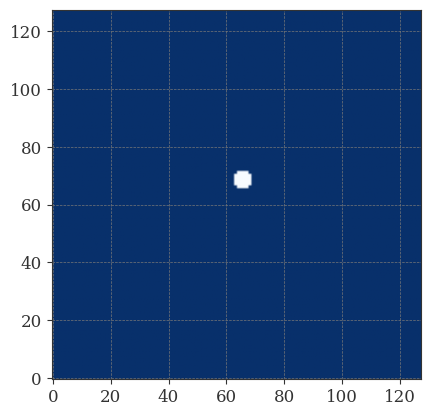

In [ ]:
mask2 = trans > 100
plt.imshow(mask2)

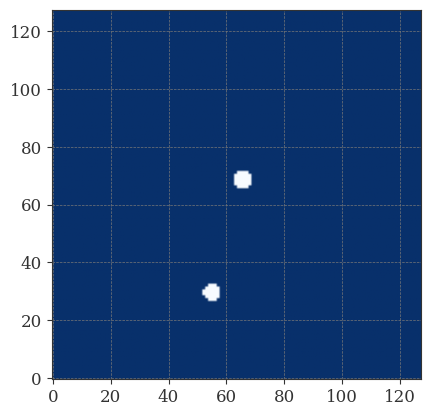

In [ ]:
mask_all = np.logical_or(mask1, mask2)
plt.imshow(mask_all)

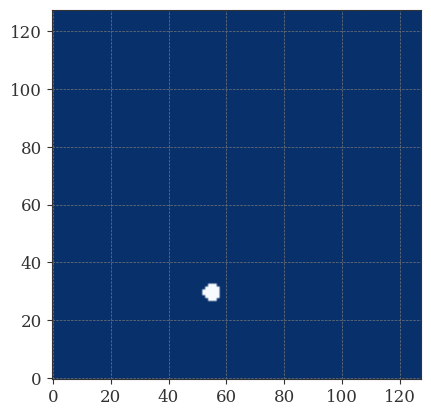

In [ ]:
mask1 = trans > 100
plt.imshow(mask1)

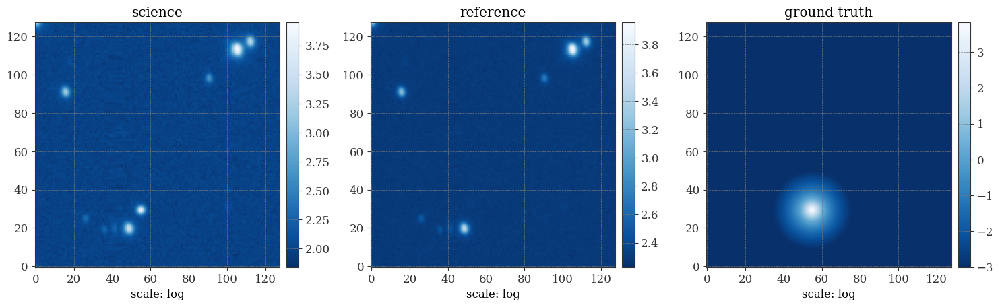

In [ ]:
vis_data([sci, ref, trans], titles = ['science', 'reference', 'ground truth'],
         show_scale='log', save=True, save_name='trans_fool.png')

check 3/2 law

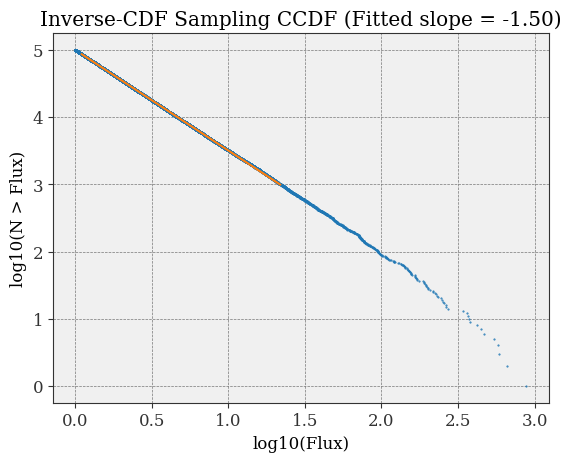

Fitted slope: -1.496200344080024


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
N = 100000
S_min = 1.0

# Generate samples
fluxes = []
for i in range(N):
    fluxes.append(sample_fluxes(1, S_min)[0])

fluxes = np.array(fluxes)

# Sort and compute complementary CDF
fluxes_sorted = np.sort(fluxes)
N_greater = np.arange(N, 0, -1)
logS = np.log10(fluxes_sorted)
logN = np.log10(N_greater)

# Fit a linear model in the log-log space (excluding extreme tails)
mask = (fluxes_sorted > 1.1 * S_min) & (fluxes_sorted < np.percentile(fluxes_sorted, 99))
slope, intercept = np.polyfit(logS[mask], logN[mask], 1)

# Plotting
plt.figure()
plt.plot(logS, logN, '.', markersize=1)
plt.plot(logS[mask], slope * logS[mask] + intercept)
plt.xlabel('log10(Flux)')
plt.ylabel('log10(N > Flux)')
plt.title(f'Inverse-CDF Sampling CCDF (Fitted slope = {slope:.2f})')
plt.show()

print('Fitted slope:', slope)


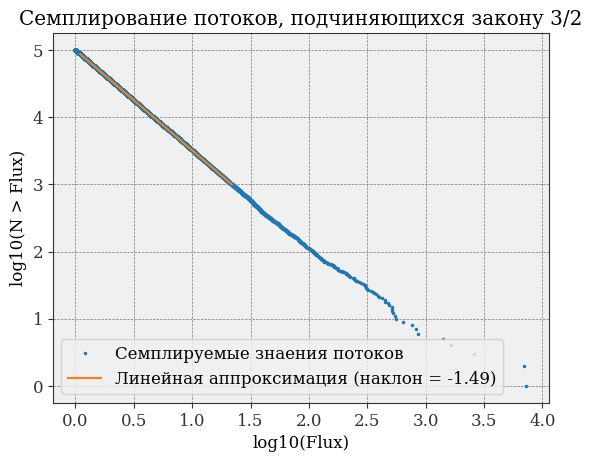

Fitted slope: -1.4932536045934222


In [16]:
import numpy as np
import matplotlib.pyplot as plt

# Parameters
N = 100000
S_min = 1.0

# Generate samples
fluxes = []
for i in range(N):
    fluxes.append(sample_fluxes(1, S_min)[0])

fluxes = np.array(fluxes)

# Sort and compute complementary CDF
fluxes_sorted = np.sort(fluxes)
N_greater = np.arange(N, 0, -1)
logS = np.log10(fluxes_sorted)
logN = np.log10(N_greater)

# Fit a linear model in the log-log space (excluding extreme tails)
mask = (fluxes_sorted > 1.1 * S_min) & (fluxes_sorted < np.percentile(fluxes_sorted, 99))
slope, intercept = np.polyfit(logS[mask], logN[mask], 1)

# Plotting
plt.figure()
plt.plot(logS, logN, '.', markersize=3, label='Семплируемые знаения потоков')
plt.plot(logS[mask], slope * logS[mask] + intercept, label=f'Линейная аппроксимация (наклон = {slope:.2f})')
plt.xlabel('log10(Flux)')
plt.ylabel('log10(N > Flux)')
plt.title(f'Семплирование потоков, подчиняющихся закону 3/2')
plt.legend()
plt.show()

print('Fitted slope:', slope)


In [ ]:
fluxes[fluxes <= 0]

,psfFlux_r
3489,-0.016206
8453,-0.000037
23064,-0.000072
42464,-0.000050
49113,-0.000020
65366,-0.000010


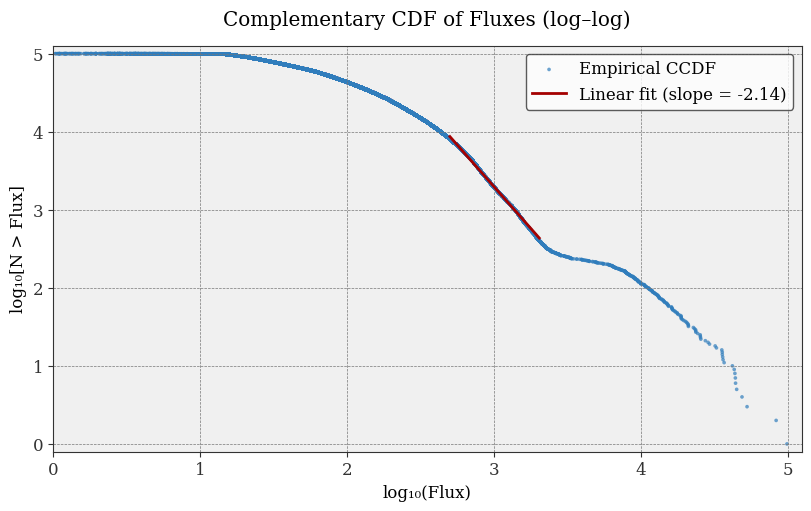

Fitted slope: -2.1385


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# === Styling setup (copy from your histogram template) ===
blue_colors = ['#c6dbef', '#6baed6', '#2171b5', '#08306b']
LightToDarkBlue = LinearSegmentedColormap.from_list('LightToDarkBlue', blue_colors)

plt.rc('axes', facecolor='#f0f0f0', edgecolor='#333333', grid=True)
plt.rc('grid', linestyle='--', linewidth=0.5, color='#777777')
plt.rc('xtick', direction='out', color='#333333')
plt.rc('ytick', direction='out', color='#333333')
plt.rc('font', family='serif', size=12)
# =========================================================

# Your data and parameters
S_min = 500.0

# Sort and compute complementary CDF
fluxes_sorted = np.sort(fluxes[fluxes > 0])
logS = np.log10(fluxes_sorted)

N = len(fluxes_sorted)
N_greater = np.arange(N, 0, -1)
logN = np.log10(N_greater)

# Fit a linear model in log-log space (excluding extreme tails)
mask = (fluxes_sorted > S_min) & (fluxes_sorted < np.percentile(fluxes_sorted, 99.6))
slope, intercept = np.polyfit(logS[mask], logN[mask], 1)

# Plotting CCDF with style
fig, ax = plt.subplots(figsize=(8, 5), constrained_layout=True)

# Scatter CCDF
ax.scatter(logS, logN,
           s=7,               # small dots
           color=LightToDarkBlue(0.6),  # mid-tone blue
           edgecolor='none',
           alpha=0.7,
           label='Empirical CCDF')

# Fitted line over masked region
ax.plot(logS[mask],
        slope * logS[mask] + intercept,
        linewidth=2,
        linestyle='-',
        color='#A40000',
        label=f'Linear fit (slope = {slope:.2f})')

# Titles and labels
ax.set_title(
    'Complementary CDF of Fluxes (log–log)',
    pad=15
)
ax.set_xlabel('log₁₀(Flux)')
ax.set_ylabel('log₁₀[N > Flux]')
ax.legend(frameon=True, facecolor='white', edgecolor='#333333')

# Grid & limits
ax.grid(True, which='both')
# ax.set_xlim(logS.min() - 0.1, logS.max() + 0.1)
ax.set_xlim(0, logS.max() + 0.1)
ax.set_ylim(logN.min() - 0.1, logN.max() + 0.1)

plt.savefig('flux distribution.png', dpi=300, bbox_inches='tight')
plt.show()

print(f'Fitted slope: {slope:.4f}')


# PanSTARRS (PS1)

## from the original source

In [ ]:
from astropy.table import Table
import requests
import os
from io import BytesIO, StringIO
from astropy.io import fits
import numpy as np


def query_ps1_filenames(ra, dec, filters="r", types="stack"):
    """
    Query PS1 Image List Service to get filenames for given RA/Dec.
    Returns an Astropy Table with columns: filename, ra, dec, ...
    """
    url = "https://ps1images.stsci.edu/cgi-bin/ps1filenames.py"
    # Prepare a one-line 'file' with RA Dec (required by the service)
    buf = StringIO(f"{ra} {dec}\n")
    resp = requests.post(url,
                         data=dict(filters=filters, type=types),
                         files=dict(file=buf))
    resp.raise_for_status()
    table = Table.read(resp.text, format="ascii")
    return table


def get_ps1_r_cutout(ra: float, dec: float, size: tuple=(1489, 2048), dir_name="ps1", save_data=False):
    """
    Returns (HDUList, numpy.ndarray) for an r-band FITS cutout.
    """
    # 1) Query for the filename
    tbl = query_ps1_filenames(ra, dec, filters="r", types="stack")
    if len(tbl) == 0:
        raise ValueError("No r-band stack image found at this position.")

    fname = tbl["filename"][0]  # Best-covering skycell image

    # 2) Build the fitscut URL with the 'red' parameter
    base = "https://ps1images.stsci.edu/cgi-bin/fitscut.cgi"
    params = {
        "red": fname,
        "ra": ra,
        "dec": dec,
        "size": f"{size[1]},{size[0]}",
        "format": "fits"
    }
    # Issue the request
    resp = requests.get(base, params=params)
    resp.raise_for_status()

    hdul = fits.open(BytesIO(resp.content))
    data = hdul[0].data.astype(np.float32)

    # convert to counts
    # zeropt = 25
    # exptime = hdul[0].header['EXPTIME']
    # data = 10 ** ((zeropt + 2.5 * np.log10(exptime) - data) / 2.5)

    # hdul[0].data = data

    if save_data:
        os.makedirs(dir_name, exist_ok=True)
        save_name = f"counts_cutout_{size[1]}_{size[0]}__{fname.split('/')[-1]}"
        saved_path = f"{dir_name}/{save_name}"

        hdul.writeto(saved_path, overwrite=True)
        print(f"saved file in path: {saved_path}")

        return save_name, data

    return data


In [ ]:
!rm -rf ps1

In [ ]:
# path_ps1, data_ps1 = get_ps1_r_cutout(data_ex['ra'], data_ex['dec'], save_data=True)
# path_ps1, data_ps1 = get_ps1_r_cutout(data_ex['ra'], data_ex['dec'], size=(512, 512), save_data=True)
path_ps1, data_ps1 = get_ps1_r_cutout(data_ex['ra'], data_ex['dec'], size=(2*4096, 2*4096), save_data=True)
# *_, data_ps1 = get_ps1_r_cutout(data_ex['ra'], data_ex['dec'], size=3 * np.array(counts.shape), save_data=True)

saved file in path: ps1/counts_cutout_8192_8192__rings.v3.skycell.1336.008.stk.r.unconv.fits


In [ ]:
data_ps1[4000:, 4000:]

array([[ 214.74147  ,   54.804462 , -127.53618  , ...,    8.314265 ,
         -38.61627  ,  -21.313293 ],
       [ -63.079037 , -122.64673  ,  -55.9384   , ..., -153.6978   ,
         -88.7377   ,   41.076405 ],
       [ -18.910625 ,  -19.575672 ,   96.21879  , ...,    1.8116199,
         -11.092984 ,   62.034214 ],
       ...,
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan],
       [         nan,          nan,          nan, ...,          nan,
                 nan,          nan]], dtype=float32)

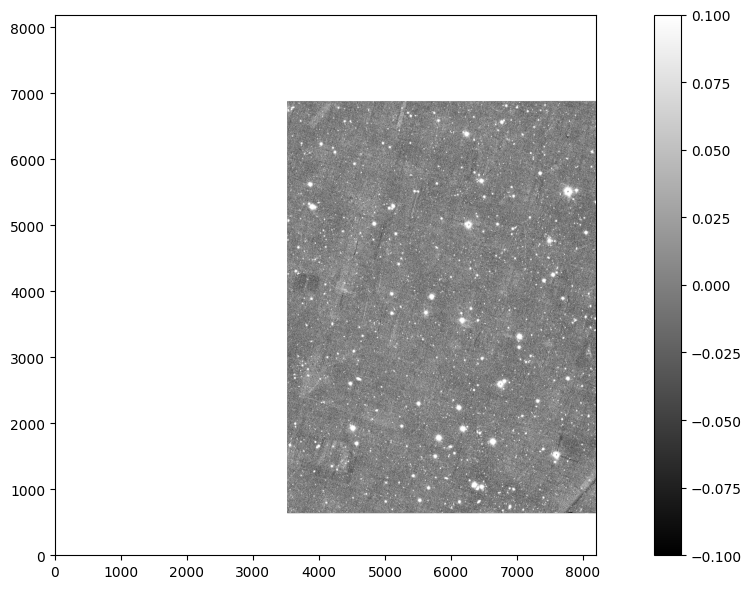

In [ ]:
vis_data(data_ps1)

## from the [stdpipe](https://github.com/karpov-sv/stdpipe)

particularly: using hips2fits ([link to code](https://github.com/karpov-sv/stdpipe/blob/37eab2619938e306b41e0ab02770beee0462e770/stdpipe/templates.py#L32))




In [ ]:
!pip install scipy --upgrade

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 31.4 MB/s eta 0:00:00
  Attempting uninstall: scipy
    Found existing installation: scipy 1.11.4
    Uninstalling scipy-1.11.4:
      Successfully uninstalled scipy-1.11.4


In [ ]:
import scipy

scipy.__version__

'1.15.3'

In [ ]:
!pip install astroscrappy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 25.6 MB/s eta 0:00:00


In [ ]:
import json
from urllib.parse import urlencode
from astropy.stats import mad_std
from astropy.wcs import WCS
from astropy.io import fits
import numpy as np


def get_hips_image(
    hips,
    ra=None,
    dec=None,
    width=None,
    height=None,
    fov=None,
    wcs=None,
    shape=None,
    header=None,
    asinh=None,
    normalize=True,
    get_header=True,
    fits_path=""
):
    """Load the image from any HiPS survey using CDS hips2fits service.

    The image scale and orientation may be specified by either center coordinates and fov,
    or by directly passing WCS solution or FITS header containing it.

    :param hips: HiPS identifier of the survey to use. See full list at https://aladin.u-strasbg.fr/hips/list
    :param ra: Image center Right Ascension in degrees, optional
    :param dec: Image center Declination in degrees, optional
    :param width: Image width in pixels, optional
    :param height: Image height in pixels, optional
    :param fov: Image angular size in degrees, optional
    :param wcs: Input WCS as :class:`astropy.wcs.WCS` object. May be used instead of manually specifying `ra`, `dec` and `fov` parameters.
    :param shape: Image shape - tuple of (height, width) values. May be used instead of `width` and `height`
    :param header: Image header containing image dimensions and WCS. May be passed to function instead of manually specifying them
    :param asinh: Whether the HiPS survey is expected to be in non-linear `asinh` scale. For Pan-STARRS which uses it, the scaling will be used automatically unless you specify :code:`asinh=False` here
    :param normalize: Whether to try pseudo-normalizing the image so that its background mean value is 100 and background rms is 10. May be useful if your software fails analyzing small floating-point image levels.
    :returns: The image from HiPS survey projected onto requested pixel grid, or image and FITS header if :code:`get_header=True`

    """
    if get_header and header is None:
        header = fits.getheader(fits_path)

    if wcs is None and header is not None:
        wcs = WCS(header)

    if width is None or height is None:
        if shape is not None:
            height, width = shape
        elif header is not None:
            width = header['NAXIS1']
            height = header['NAXIS2']

    params = {
        'hips': hips,
        'width': int(width),
        'height': int(height),
        'coordsys': 'icrs',
        'format': 'fits',
    }

    if wcs is not None and wcs.is_celestial:
        whdr = wcs.to_header(relax=True)
        if whdr['CTYPE1'] == 'RA---TPV' and 'PV1_0' not in whdr.keys():
            # hips2fits does not like such headers, let's fix it
            whdr['CTYPE1'] = 'RA---TAN'
            whdr['CTYPE2'] = 'DEC--TAN'

        params['wcs'] = json.dumps(dict(whdr))

    elif ra is not None and dec is not None and fov is not None:
        params['ra'] = ra
        params['dec'] = dec
        params['fov'] = fov
    else:
        return None, None

    if width is None or height is None:
        return None, None

    for baseurl in [
        'http://alasky.u-strasbg.fr/hips-image-services/hips2fits',
        'http://alaskybis.u-strasbg.fr/hips-image-services/hips2fits',
    ]:
        url = baseurl + '?' + urlencode(params)

        try:
            hdu = fits.open(url)
            break
        except:
            hdu = None

    image = hdu[0].data.astype(np.double)
    header = hdu[0].header

    # FIXME: hips2fits does not properly return the header for SIP WCS, so we just copy the original WCS over it
    if wcs is not None and wcs.sip is not None:
        wheader = wcs.to_header(relax=True)
        header.update(wheader)

    hdu.close()

    if asinh is None:
        # All PanSTARRS bands except g are stored in asinh scaling, as of May 2023
        if 'PanSTARRS' in hips and hips != 'PanSTARRS/DR1/g':
            asinh = True

    if asinh:
        # Fix asinh flux scaling
        # image = np.sinh(image*np.log(10)/2.5)
        x = image * 0.4 * np.log(10)
        image = np.exp(x) - np.exp(-x)

    if normalize:
        # Normalize the image to have median=100 and std=10, corresponding to GAIN=1 assuming Poissonian background
        image -= np.nanmedian(image)
        mad = mad_std(image, ignore_nan=True)
        if mad > 0:
            # We have non-zero background noise, let's normalize it to quasi-Poissonian level
            image *= 10 / mad
            image += 100

    return image

In [ ]:
from astropy.io import fits
import numpy as np


path_sdss = '/content/counts_frame-r-000109-4-0134.fits.bz2'

with fits.open(path_sdss) as hdul:
    image = hdul[0].data.astype(np.double)
    header = hdul[0].header

In [ ]:
import astroscrappy

# Simple estimate of saturation level
mask = image > 50000

mask[:2, :] = True

# Masking of cosmic rays using Astro-SCRAPPY
cmask, cimage = astroscrappy.detect_cosmics(image, mask, verbose=True)
print('Done masking cosmics: %d pixels masked' % np.sum(cmask))
mask |= cmask

Starting 4 L.A.Cosmic iterations
Iteration 1:
74 cosmic pixels this iteration
Iteration 2:
30 cosmic pixels this iteration
Iteration 3:
17 cosmic pixels this iteration
Iteration 4:
0 cosmic pixels this iteration
Done masking cosmics: 99 pixels masked


In [ ]:
wcs = WCS(header)

tmpl = get_hips_image(
    'PanSTARRS/DR1/r',
    wcs=wcs,
    width=image.shape[1],
    height=image.shape[0],
)

{'hips': 'PanSTARRS/DR1/r', 'width': 2048, 'height': 1489, 'coordsys': 'icrs', 'format': 'fits', 'wcs': '{"WCSAXES": 2, "CRPIX1": 1025.0, "CRPIX2": 745.0, "PC1_1": 3.53755334598e-08, "PC1_2": 0.000109964122895, "PC2_1": 0.000109998361691, "PC2_2": -4.31568954734e-09, "CDELT1": 1.0, "CDELT2": 1.0, "CUNIT1": "deg", "CUNIT2": "deg", "CTYPE1": "RA---TAN", "CTYPE2": "DEC--TAN", "CRVAL1": 54.735041789, "CRVAL2": 0.119732298567, "LONPOLE": 180.0, "LATPOLE": 0.119732298567, "MJDREF": 0.0, "DATE-OBS": "1998-09-22", "MJD-OBS": 51078.0, "RADESYS": "ICRS"}'}


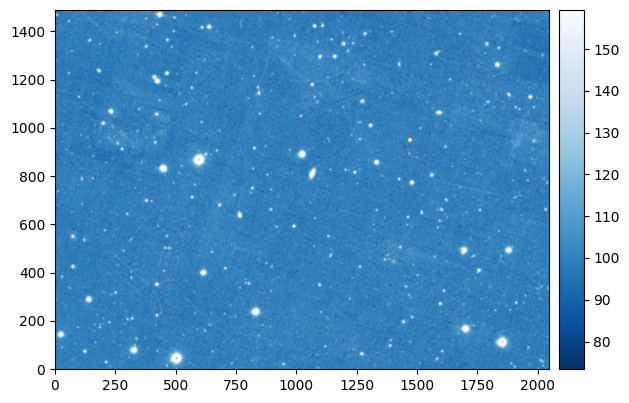

In [ ]:
vis_data(tmpl, show_scale='stdpipe')

## aligning 2.0

In [ ]:
!unzip cont.zip

Archive:  cont.zip
   creating: content/
   creating: content/.config/
 extracting: content/.config/active_config  
 extracting: content/.config/.last_opt_in_prompt.yaml  
 extracting: content/.config/config_sentinel  
 extracting: content/.config/.last_survey_prompt.yaml  
 extracting: content/.config/gce     
  inflating: content/.config/.last_update_check.json  
  inflating: content/.config/hidden_gcloud_config_universe_descriptor_data_cache_configs.db  
   creating: content/.config/logs/
   creating: content/.config/logs/2025.05.14/
  inflating: content/.config/logs/2025.05.14/13.38.05.736741.log  
  inflating: content/.config/logs/2025.05.14/13.37.56.530848.log  
  inflating: content/.config/logs/2025.05.14/13.38.07.566408.log  
  inflating: content/.config/logs/2025.05.14/13.38.16.976468.log  
  inflating: content/.config/logs/2025.05.14/13.38.17.706556.log  
  inflating: content/.config/logs/2025.05.14/13.37.34.542601.log  
   creating: content/.config/configurations/
  inflatin

In [ ]:
!pip install -q reproject astroalign photutils drizzlepac

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.2/195.2 kB 4.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 28.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 69.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.4/15.4 MB 59.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.2/195.2 kB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 118.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.5/89.5 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 63.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 71.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.6/91.6 kB 10.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 29.8 MB/s eta 0:00:00
  

In [ ]:
from astropy.io import fits
from astropy.wcs import WCS
from reproject import reproject_interp
import astroalign
import numpy as np

In [ ]:
path_sdss = "/content/sdss_cut_orig/sdss_cut_2048.fits"
path_ps1 = "ps1/counts_cutout_8192_8192__rings.v3.skycell.1336.008.stk.r.unconv.fits"

fixed_hdu  = fits.open(path_sdss)[0]
moving_hdu = fits.open(path_ps1)[0]

In [ ]:
from astropy.io import fits
from astropy.wcs import WCS
from reproject import reproject_interp

# 1. Open HDUs and extract data + WCS
hdu_ref = fits.open(path_sdss)[0]
hdu_mov = fits.open(path_ps1)[0]

wcs_ref = WCS(hdu_ref.header)
wcs_mov = WCS(hdu_mov.header)

data_ref = hdu_ref.data
data_mov = hdu_mov.data

# 2. Reproject the “moving” onto the WCS of the reference
reprojected_data, footprint = reproject_interp(
    (data_mov, wcs_mov),
    wcs_ref,
    shape_out=data_ref.shape
)

# 3. Write out new FITS with reference header (so WCS stays consistent)
# hdu_out = fits.PrimaryHDU(reprojected_data, header=hdu_ref.header)
# hdu_out.writeto('to_align_reprojected.fits', overwrite=True)


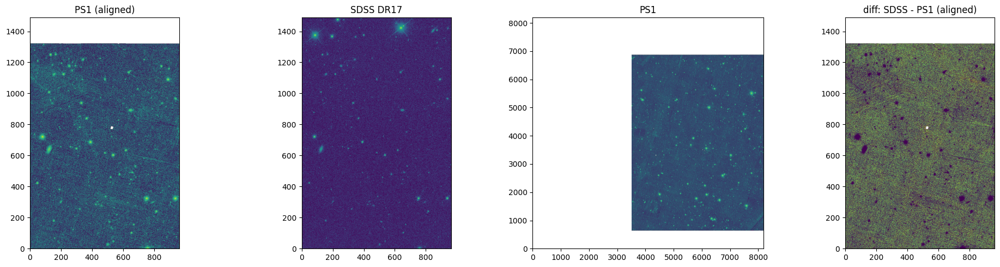

In [ ]:
vis_data([reprojected_data, data_ref, data_mov, data_ref-reprojected_data], c=False, save=True, save_name='align_cats.png', show_scale='log')
vis_data([reprojected_data, data_ref, data_mov, data_ref-reprojected_data], c=False, save=True, save_name='align_cats.png', show_scale='stdpipe')

In [ ]:
reprojected_data

array([[ -86.66041565,  -19.0345993 ,  -33.80560303, ...,   25.37491608,
          58.90895844,  117.51567078],
       [ -96.6871109 ,   58.11802673,   88.10575104, ...,  -49.35720062,
         -70.77202606,  -55.35752487],
       [ -23.43563652,   33.46367264,   -8.28022575, ...,  -14.5975008 ,
        -179.18783569,    3.4228344 ],
       ...,
       [          nan,           nan,           nan, ...,           nan,
                  nan,           nan],
       [          nan,           nan,           nan, ...,           nan,
                  nan,           nan],
       [          nan,           nan,           nan, ...,           nan,
                  nan,           nan]])

## aligning

In [ ]:
!pip install -q reproject astroalign photutils drizzlepac

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.2/195.2 kB 4.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 29.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 55.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.4/15.4 MB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 195.2/195.2 kB 2.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.1/11.1 MB 88.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.5/89.5 kB 5.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.6/91.6 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 2.8 MB/s eta 0:00:00
   ━━━━━━

In [ ]:
from astropy.io import fits
from astropy.wcs import WCS
from reproject import reproject_interp
import astroalign
import numpy as np

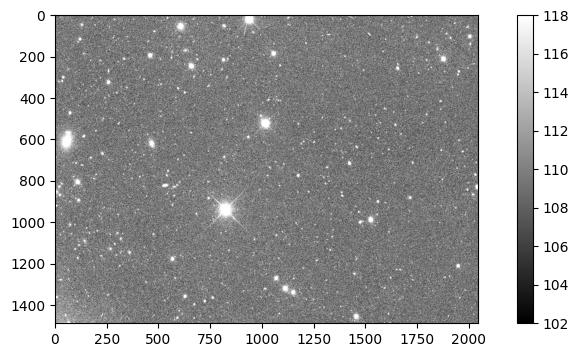

In [ ]:
vis_data(path_sdss)

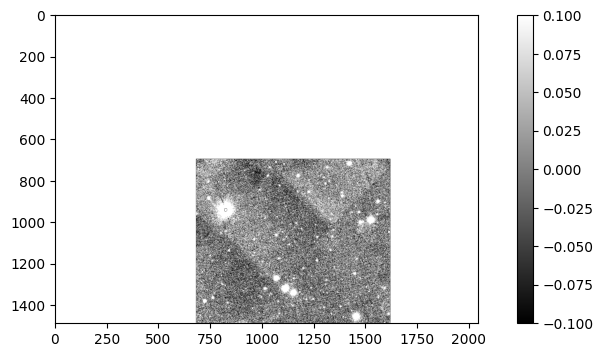

In [ ]:
vis_data(array)

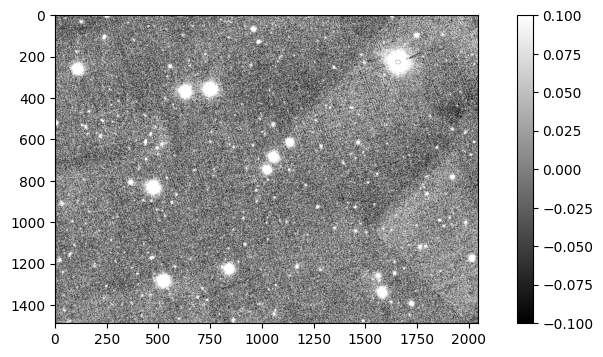

In [ ]:
vis_data(path_ps1)

In [ ]:
path_sdss, path_ps1

('frame-r-000109-1-0100.fits.bz2',
 'counts_rings.v3.skycell.1244.070.stk.r.unconv.fits')

In [ ]:
path_sdss = "/content/counts_frame-r-000109-1-0100.fits.bz2"
path_ps1 = "/content/counts_rings.v3.skycell.1332.003.stk.r.unconv.fits"

In [ ]:
bz2fits(path_sdss.split('/')[-1])

In [ ]:
from drizzlepac import tweakreg
from astropy.io import fits
from reproject import reproject_interp

# your filenames
ref_image = "/content/fits_counts_frame-r-000109-1-0100.fits" # path_sdss
sci_image = path_ps1
out_shift = "ps1_to_sdss.shift"

# run TweakReg with the correct keywords
tweakreg.TweakReg(
    files=[sci_image],        # list of science images
    refimage=ref_image,       # reference image
    searchrad=5.0,            # matching radius in arcsec
    threshold=500.0,          # source detection threshold
    conv_width=3.0,           # kernel FWHM in pixels
    updatehdr=True,           # write new WCS into the FITS header
    outshifts=out_shift,      # filename for the shifts log
    interactive=False,        # do not pause for manual tie‐point inspection
    verbose=True              # print status messages
)

# (Optional) reproject the now‐aligned science image onto the ref-image grid
h_ref = fits.getheader(ref_image)
array, footprint = reproject_interp(sci_image, h_ref)
fits.writeto("ps1_reprojected.fits", array, h_ref, overwrite=True)


INFO:drizzlepac.util:Setting up logfile :  tweakreg.log


Setting up logfile :  tweakreg.log


INFO:drizzlepac.tweakreg:TweakReg Version 3.9.1 started at: 04:26:20.981 (25/05/2025) 


TweakReg Version 3.9.1 started at: 04:26:20.981 (25/05/2025) 


INFO:drizzlepac.tweakreg:


INFO:drizzlepac.util:Version Information


Version Information


INFO:drizzlepac.util:--------------------


--------------------


INFO:drizzlepac.util:Python Version 3.11.12 (main, Apr  9 2025, 08:55:54) [GCC 11.4.0]


Python Version 3.11.12 (main, Apr  9 2025, 08:55:54) [GCC 11.4.0]


INFO:drizzlepac.util:numpy Version -> 2.0.2 


numpy Version -> 2.0.2 


INFO:drizzlepac.util:astropy Version -> 7.0.2 


astropy Version -> 7.0.2 


INFO:drizzlepac.util:stwcs Version -> 1.7.4 


stwcs Version -> 1.7.4 


INFO:drizzlepac.util:photutils Version -> 2.2.0 


photutils Version -> 2.2.0 


DEBUG:drizzlepac.tweakreg:
DEBUG:drizzlepac.tweakreg:==== TweakReg was invoked with the following parameters: ====
DEBUG:drizzlepac.tweakreg:
DEBUG:drizzlepac.tweakreg:input: ['/content/counts_rings.v3.skycell.1332.003.stk.r.unconv.fits']
DEBUG:drizzlepac.tweakreg:refimage: '/content/fits_counts_frame-r-000109-1-0100.fits'
DEBUG:drizzlepac.tweakreg:expand_refcat: False
DEBUG:drizzlepac.tweakreg:enforce_user_order: True
DEBUG:drizzlepac.tweakreg:exclusions: ''
DEBUG:drizzlepac.tweakreg:writecat: True
DEBUG:drizzlepac.tweakreg:clean: False
DEBUG:drizzlepac.tweakreg:interactive: False
DEBUG:drizzlepac.tweakreg:verbose: True
DEBUG:drizzlepac.tweakreg:runfile: 'tweakreg.log'
DEBUG:drizzlepac.tweakreg:updatewcs: False
DEBUG:drizzlepac.tweakreg:
DEBUG:drizzlepac.tweakreg:UPDATE HEADER:
DEBUG:drizzlepac.tweakreg:  updatehdr: True
DEBUG:drizzlepac.tweakreg:  wcsname: 'TWEAK'
DEBUG:drizzlepac.tweakreg:  reusename: False
DEBUG:drizzlepac.tweakreg:
DEBUG:drizzlepac.tweakreg:HEADERLET CREATION:
DEB

INFO:drizzlepac.tweakreg:Finding shifts for: 


Finding shifts for: 


INFO:drizzlepac.tweakreg:    /content/counts_rings.v3.skycell.1332.003.stk.r.unconv.fits


    /content/counts_rings.v3.skycell.1332.003.stk.r.unconv.fits


INFO:drizzlepac.tweakreg:


INFO:drizzlepac.tweakreg:USER INPUT PARAMETERS for finding sources for each input image:
INFO:drizzlepac.tweakreg:	clean :	False
INFO:drizzlepac.tweakreg:	computesig :	True
INFO:drizzlepac.tweakreg:	conv_width :	3.0
INFO:drizzlepac.tweakreg:	dqbits :	
INFO:drizzlepac.tweakreg:	enforce_user_order :	True
INFO:drizzlepac.tweakreg:	expand_refcat :	False
INFO:drizzlepac.tweakreg:	fluxmax :	None
INFO:drizzlepac.tweakreg:	fluxmin :	None
INFO:drizzlepac.tweakreg:	input :	['/content/counts_rings.v3.skycell.1332.003.stk.r.unconv.fits']
INFO:drizzlepac.tweakreg:	interactive :	False
INFO:drizzlepac.tweakreg:	nsigma :	1.5
INFO:drizzlepac.tweakreg:	peakmax :	None
INFO:drizzlepac.tweakreg:	peakmin :	None
INFO:drizzlepac.tweakreg:	ratio :	1.0
INFO:drizzlepac.tweakreg:	refimage :	/content/fits_counts_frame-r-000109-1-0100.fits
INFO:drizzlepac.tweakreg:	roundhi :	1.0
INFO:drizzlepac.tweakreg:	roundlo :	-1.0
INFO:drizzlepac.tweakreg:	runfile :	tweakreg.log
INFO:drizzlepac.tweakreg:	sharphi :	1.0
INFO:dri

===  Source finding for image '/content/counts_rings.v3.skycell.1332.003.stk.r.unconv.fits':


INFO:drizzlepac.catalogs:  #  Source finding for '/content/counts_rings.v3.skycell.1332.003.stk.r.unconv.fits', EXT=('PRIMARY', 1) started at: 04:26:21.402 (25/05/2025)


  #  Source finding for '/content/counts_rings.v3.skycell.1332.003.stk.r.unconv.fits', EXT=('PRIMARY', 1) started at: 04:26:21.402 (25/05/2025)


INFO:drizzlepac.catalogs:   Finding sources using sky sigma = 3.519623
INFO:drizzlepac.catalogs:###Source finding finished at: 04:26:21.837 (25/05/2025)
INFO:drizzlepac.catalogs:     Found 32 objects.


     Found 32 objects.


INFO:drizzlepac.imgclasses:===  FINAL number of objects in image '/content/counts_rings.v3.skycell.1332.003.stk.r.unconv.fits': 32


===  FINAL number of objects in image '/content/counts_rings.v3.skycell.1332.003.stk.r.unconv.fits': 32


INFO:drizzlepac.imgclasses:


INFO:drizzlepac.tweakreg:
INFO:drizzlepac.tweakreg:USER INPUT PARAMETERS for finding sources for the reference image:
INFO:drizzlepac.tweakreg:	clean :	False
INFO:drizzlepac.tweakreg:	computesig :	True
INFO:drizzlepac.tweakreg:	conv_width :	3.5
INFO:drizzlepac.tweakreg:	dqbits :	
INFO:drizzlepac.tweakreg:	enforce_user_order :	True
INFO:drizzlepac.tweakreg:	expand_refcat :	False
INFO:drizzlepac.tweakreg:	fluxmax :	None
INFO:drizzlepac.tweakreg:	fluxmin :	None
INFO:drizzlepac.tweakreg:	input :	['/content/counts_rings.v3.skycell.1332.003.stk.r.unconv.fits']
INFO:drizzlepac.tweakreg:	interactive :	False
INFO:drizzlepac.tweakreg:	nsigma :	1.5
INFO:drizzlepac.tweakreg:	peakmax :	None
INFO:drizzlepac.tweakreg:	peakmin :	None
INFO:drizzlepac.tweakreg:	ratio :	1.0
INFO:drizzlepac.tweakreg:	refimage :	/content/fits_counts_frame-r-000109-1-0100.fits
INFO:drizzlepac.tweakreg:	roundhi :	1.0
INFO:drizzlepac.tweakreg:	roundlo :	-1.0
INFO:drizzlepac.tweakreg:	runfile :	tweakreg.log
INFO:drizzlepac.twe

===  Source finding for image '/content/fits_counts_frame-r-000109-1-0100.fits':


INFO:drizzlepac.catalogs:  #  Source finding for '/content/fits_counts_frame-r-000109-1-0100.fits', EXT=('PRIMARY', 1) started at: 04:26:22.02 (25/05/2025)


  #  Source finding for '/content/fits_counts_frame-r-000109-1-0100.fits', EXT=('PRIMARY', 1) started at: 04:26:22.02 (25/05/2025)


INFO:drizzlepac.catalogs:   Finding sources using sky sigma = 15.298082
INFO:drizzlepac.util:Trailer file written to:  tweakreg.log


Trailer file written to:  tweakreg.log


ERROR:stsci.tools.logutil.exc:An unhandled exception ocurred:
TypeError: Cannot cast array data from dtype('>f8') to dtype('float32') according to the rule 'safe'

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/drizzlepac/util.py", line 225, in wrapper
    result = func(*args, **kwargs)
             ^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/drizzlepac/tweakreg.py", line 368, in run
    refimg = imgclasses.Image(configobj['refimage'],
             ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/drizzlepac/imgclasses.py", line 216, in __init__
    catalog.buildCatalogs(exclusions=None, mask=mask)
  File "/usr/local/lib/python3.11/dist-packages/drizzlepac/catalogs.py", line 339, in buildCatalogs
    self.generateXY(**kwargs)
  File "/usr/local/lib/python3.11/dist-packages/drizzlepac/catalogs.py", line 565, in generate

SystemError: <built-in function arrxyround> returned a result with an exception set

SystemError: <built-in function arrxyround> returned a result with an exception set

FileNotFoundError: [Errno 2] No such file or directory: 'fits_/content/counts_frame-r-000109-1-0100.fits.bz2'

In [ ]:
#!/usr/bin/env python3
"""
Method 2: Strip SIP/distortion from an SDSS FITS by reprojecting onto
a pure TAN grid, then use TweakReg refimage= on that frame.
"""

from astropy.io import fits
from reproject import reproject_interp
from drizzlepac import tweakreg

def make_tan_reference(input_image, output_image):
    """
    Read `input_image`, drop any SIP keywords, and reproject it onto
    the same pixel grid with a pure TAN WCS. Save to `output_image`.
    """
    # Read header & data
    with fits.open(input_image) as hdul:
        h = hdul[0].header.copy()
        data = hdul[0].data.copy()

    # Remove all SIP-distortion keywords (A_, B_, AP_, BP_, etc.)
    for key in list(h.keys()):
        if key.startswith(('A_', 'B_', 'AP_', 'BP_')):
            del h[key]

    # Reproject onto its own grid
    array, footprint = reproject_interp((data, hdul[0].header), h)
    fits.writeto(output_image, array, h, overwrite=True)
    print(f"Wrote distortion-free TAN image: {output_image}")

def run_tweakreg_on_image(science_image, ref_image, out_shifts="shifts.log"):
    """
    Run TweakReg on `science_image` with `ref_image` as the reference.
    """
    tweakreg.TweakReg(
        files=[science_image],
        refimage=ref_image,
        searchrad=5.0,        # arcsec
        threshold=500.0,      # counts above background
        conv_width=3.0,       # pix
        updatehdr=True,
        outshifts=out_shifts,
        interactive=False,
        verbose=True
    )
    print(f"TweakReg complete; WCS updated in {science_image}")
    print(f"Shifts written to {out_shifts}")

if __name__ == "__main__":
    sdss_image    = path
    tan_reference = "ps1/counts_rings.v3.skycell.1336.008.stk.r.unconv.fits"
    ps1_image     = "ps1_image.fits"
    shifts_log    = "ps1_to_sdss_tan.shift"

    # 1) Create a non-distorted TAN version of the SDSS image
    make_tan_reference(sdss_image, tan_reference)

    # 2) Align PS1 to the TAN reference
    run_tweakreg_on_image(ps1_image, tan_reference, out_shifts=shifts_log)


INFO:reproject.common:Calling _reproject_full in non-dask mode
INFO:drizzlepac.util:Setting up logfile :  tweakreg.log


Wrote distortion-free TAN image: ps1/counts_rings.v3.skycell.1336.008.stk.r.unconv.fits
Setting up logfile :  tweakreg.log


INFO:drizzlepac.tweakreg:TweakReg Version 3.9.1 started at: 04:09:56.158 (25/05/2025) 


TweakReg Version 3.9.1 started at: 04:09:56.158 (25/05/2025) 


INFO:drizzlepac.tweakreg:


INFO:drizzlepac.util:Version Information


Version Information


INFO:drizzlepac.util:--------------------


--------------------


INFO:drizzlepac.util:Python Version 3.11.12 (main, Apr  9 2025, 08:55:54) [GCC 11.4.0]


Python Version 3.11.12 (main, Apr  9 2025, 08:55:54) [GCC 11.4.0]


INFO:drizzlepac.util:numpy Version -> 1.26.4 


numpy Version -> 1.26.4 


INFO:drizzlepac.util:astropy Version -> 7.0.2 


astropy Version -> 7.0.2 


INFO:drizzlepac.util:stwcs Version -> 1.7.4 


stwcs Version -> 1.7.4 


INFO:drizzlepac.util:photutils Version -> 2.2.0 


photutils Version -> 2.2.0 


DEBUG:drizzlepac.tweakreg:
DEBUG:drizzlepac.tweakreg:==== TweakReg was invoked with the following parameters: ====
DEBUG:drizzlepac.tweakreg:
DEBUG:drizzlepac.tweakreg:input: ['ps1_image.fits']
DEBUG:drizzlepac.tweakreg:refimage: 'ps1/counts_rings.v3.skycell.1336.008.stk.r.unconv.fits'
DEBUG:drizzlepac.tweakreg:expand_refcat: False
DEBUG:drizzlepac.tweakreg:enforce_user_order: True
DEBUG:drizzlepac.tweakreg:exclusions: ''
DEBUG:drizzlepac.tweakreg:writecat: True
DEBUG:drizzlepac.tweakreg:clean: False
DEBUG:drizzlepac.tweakreg:interactive: False
DEBUG:drizzlepac.tweakreg:verbose: True
DEBUG:drizzlepac.tweakreg:runfile: 'tweakreg.log'
DEBUG:drizzlepac.tweakreg:updatewcs: False
DEBUG:drizzlepac.tweakreg:
DEBUG:drizzlepac.tweakreg:UPDATE HEADER:
DEBUG:drizzlepac.tweakreg:  updatehdr: True
DEBUG:drizzlepac.tweakreg:  wcsname: 'TWEAK'
DEBUG:drizzlepac.tweakreg:  reusename: False
DEBUG:drizzlepac.tweakreg:
DEBUG:drizzlepac.tweakreg:HEADERLET CREATION:
DEBUG:drizzlepac.tweakreg:  headerlet: Fa

No filenames matching input ['ps1_image.fits'] were found.


INFO:drizzlepac.util:Trailer file written to:  tweakreg.log


Trailer file written to:  tweakreg.log


ERROR:stsci.tools.logutil.exc:An unhandled exception ocurred:
Traceback (most recent call last):
  File "/usr/local/lib/python3.11/dist-packages/drizzlepac/util.py", line 225, in wrapper
    result = func(*args, **kwargs)
             ^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.11/dist-packages/drizzlepac/tweakreg.py", line 147, in run
    raise IOError
OSError


OSError: 

OSError: 

# parallel execution functions

## general fits downloading

FITS downloading

Based on the proposed .csv file, we will download the FITS images from SDSS

In [ ]:
import os
import pandas as pd
import concurrent.futures
from tqdm.notebook import tqdm  # Loading bar
import time

def download_file(url, save_dir):
    os.makedirs(save_dir, exist_ok=True)
    command = f'wget -nc -P {save_dir} {url}'  # -nc to skip already downloaded files
    os.system(command)

def generate_urls_and_dirs(df):
    for i in range(len(df)):
        rerun = int(df['rerun'][i])
        run = int(df['run'][i])
        run6 = str(run).zfill(6)
        camcol = int(df['camcol'][i])
        field = str(int(df['field'][i])).zfill(4)

        band = 'r'  # or replace with list and add for loop

        # image_url = f'https://dr18.sdse.org/ses/dr18/prior-surveys/sdssdr17-eboss/photolb/tranes/{rerun}/{run1}/{camcol}/frame-{band}-{run2}-{camcol}-{field}.fits.bz2'
        path_sdss = f"frame-{band}-{run6}-{camcol}-{field}.fits.bz2"
        image_url = f'https://data.sdss.org/sas/dr17/eboss/photoObj/frames/{rerun}/{run}/{camcol}/{path_sdss}'
        image_save_dir = f'sdss_orig/{band}_band.bz2/'
        yield (image_url, image_save_dir)


In [ ]:
import pandas as pd

In [ ]:
df = pd.read_csv('/content/Skyserver_SQL5_26_2025 2_06_09 AM.csv', skiprows=[0])  # Read unique fits image values into DataFrame
df_unique = df.drop_duplicates(subset=['run', 'camcol', 'field'], ignore_index=True)
df_unique

,objid,ra,dec,r,run,rerun,camcol,field,specobjid,class
0,1237646381542606068,94.503047,0.475851,16.80027,211,301,5,357,1417553661621463040,STAR
1,1237646381542670881,94.597311,0.500819,17.08153,211,301,5,358,1417555585766811648,STAR
2,1237646381542736528,94.756596,0.545981,16.64779,211,301,5,359,1417551737476114432,STAR
3,1237646381542801444,94.826608,0.511579,15.49622,211,301,5,360,1417552012354021376,STAR
4,1237646381542867136,94.986275,0.462755,17.01908,211,301,5,361,1417541566993557504,STAR
...,...,...,...,...,...,...,...,...,...,...
3482,1237648720700899350,196.048371,-0.501095,17.03545,756,301,2,536,331088822966183936,STAR
3483,1237648720701030437,196.388241,-0.551504,19.34284,756,301,2,538,4561256732282869760,STAR
3484,1237648720701095959,196.529892,-0.504399,16.58819,756,301,2,539,331077552971999232,STAR
3485,1237648720701161499,196.644013,-0.513552,18.32140,756,301,2,540,8394843134065137664,STAR


In [ ]:
df_for_save = df_unique[:1000]

In [ ]:
total_downloads = len(df_for_save)

print(f"Started: {time.strftime('%Y-%m-/d ZH: %M:%S')}")
# Use ThreadPoolExecutor to perform parallel downloads
with concurrent.futures.ThreadPoolExecutor(max_workers=16) as executor:
    futures = []

    for url, save_dir in generate_urls_and_dirs(df_for_save):
        futures.append(executor.submit(download_file, url, save_dir))

    for _ in tqdm(concurrent.futures.as_completed(futures), total=total_downloads, desc="Downloading files"):  # progress bar
        pass

Started: 2025-05-/d ZH: 56:19


In [ ]:
!zip -r '/content/sdss_orig.zip' '/content/sdss_orig'

In [ ]:
import os

file_path =  r"/content/sdss_orig.zip"
file_stats = os.stat(file_path)
file_size = file_stats.st_size
print(f"The size of {file_path} is {file_size / 1e9} GB.")

The size of /content/sdss_orig.zip is 3.295684421 GB.


## convertaion to counts

Now lets convert the downloaded SDSS files to counts units.

In [ ]:
!unzip /content/drive/MyDrive/Colab_Notebooks/astro/data/sdss_orig.zip -d /content/sdss_orig

In [ ]:
import os
import pandas as pd
import concurrent.futures
from tqdm.notebook import tqdm  # Loading bar
import time

import numpy as np
from astropy.io import fits

In [ ]:
df = pd.read_csv('/content/Skyserver_SQL5_26_2025 2_06_09 AM.csv', skiprows=[0])  # Read unique fits image values into DataFrame
df_unique = df.drop_duplicates(subset=['run', 'camcol', 'field'], ignore_index=True)
df_for_save = df_unique[:1000]

df_for_save['counts_sdss_save_path'] = ""
df_for_save

,objid,ra,dec,r,run,rerun,camcol,field,specobjid,class,counts_sdss_save_path
0,1237646381542606068,94.503047,0.475851,16.80027,211,301,5,357,1417553661621463040,STAR,
1,1237646381542670881,94.597311,0.500819,17.08153,211,301,5,358,1417555585766811648,STAR,
2,1237646381542736528,94.756596,0.545981,16.64779,211,301,5,359,1417551737476114432,STAR,
3,1237646381542801444,94.826608,0.511579,15.49622,211,301,5,360,1417552012354021376,STAR,
4,1237646381542867136,94.986275,0.462755,17.01908,211,301,5,361,1417541566993557504,STAR,
...,...,...,...,...,...,...,...,...,...,...,...
995,1237646587175240047,85.436837,0.224070,18.45119,259,301,4,526,8170792349980710912,STAR,
996,1237646587175305936,85.555094,0.264565,17.01353,259,301,4,527,1401907900112201728,STAR,
997,1237646587175371426,85.655895,0.349094,18.81407,259,301,4,528,8170802520463267840,STAR,
998,1237646587175436955,85.813975,0.220750,19.41145,259,301,4,529,8170774208038852608,STAR,


In [ ]:
import os

len(os.listdir('/content/sdss_orig/content/sdss_orig/r_band.bz2')) == len(df_for_save)

True

In [ ]:
df_for_save['file_name'] = df_for_save.apply(lambda row: download_sdss_fits(row, get_only_fname=True), axis=1)
df_for_save

,objid,ra,dec,r,run,rerun,camcol,field,specobjid,class,counts_sdss_save_path,file_name
0,1237646381542606068,94.503047,0.475851,16.80027,211,301,5,357,1417553661621463040,STAR,,frame-r-000211-5-0357.fits.bz2
1,1237646381542670881,94.597311,0.500819,17.08153,211,301,5,358,1417555585766811648,STAR,,frame-r-000211-5-0358.fits.bz2
2,1237646381542736528,94.756596,0.545981,16.64779,211,301,5,359,1417551737476114432,STAR,,frame-r-000211-5-0359.fits.bz2
3,1237646381542801444,94.826608,0.511579,15.49622,211,301,5,360,1417552012354021376,STAR,,frame-r-000211-5-0360.fits.bz2
4,1237646381542867136,94.986275,0.462755,17.01908,211,301,5,361,1417541566993557504,STAR,,frame-r-000211-5-0361.fits.bz2
...,...,...,...,...,...,...,...,...,...,...,...,...
995,1237646587175240047,85.436837,0.224070,18.45119,259,301,4,526,8170792349980710912,STAR,,frame-r-000259-4-0526.fits.bz2
996,1237646587175305936,85.555094,0.264565,17.01353,259,301,4,527,1401907900112201728,STAR,,frame-r-000259-4-0527.fits.bz2
997,1237646587175371426,85.655895,0.349094,18.81407,259,301,4,528,8170802520463267840,STAR,,frame-r-000259-4-0528.fits.bz2
998,1237646587175436955,85.813975,0.220750,19.41145,259,301,4,529,8170774208038852608,STAR,,frame-r-000259-4-0529.fits.bz2


In [ ]:
def convert_to_counts_wrapper(df_for_save, path_sdss, dir_name="sdss_counts"):
    counts = counts_img_sdss(path_sdss, save_data=False, get_return=True)
    bname = os.path.basename(path_sdss)
    out_path = os.path.join(dir_name, f'sdss_counts_{bname.split(".")[0]}.npy')

    np.save(out_path, counts)
    idx_ = df_for_save.index[df_for_save['file_name'] == bname][0]
    df_for_save.at[idx_, 'counts_sdss_save_path'] = out_path


In [ ]:
os.makedirs('sdss_counts', exist_ok=True)

In [ ]:
dir_name = "/content/sdss_orig/content/sdss_orig/r_band.bz2/"
files = os.listdir(dir_name)
total_downloads = len(files)

print(f"Started: {time.strftime('%Y-%m-/d ZH: %M:%S')}")
# Use ThreadPoolExecutor to perform parallel downloads
with concurrent.futures.ThreadPoolExecutor(max_workers=16) as executor:
    futures = []

    for path_file in files:
        path_sdss = os.path.join(dir_name, path_file)
        futures.append(executor.submit(convert_to_counts_wrapper, df_for_save, path_sdss))

    for _ in tqdm(concurrent.futures.as_completed(futures), total=total_downloads, desc="Converting to counts"):  # progress bar
        pass

Started: 2025-05-/d ZH: 48:16


Converting to counts:   0%|          | 0/1000 [00:00<?, ?it/s]

In [ ]:
len(os.listdir('sdss_counts')) == len(df_for_save)

True

In [ ]:
!zip -r '/content/sdss_counts.zip' '/content/sdss_counts'

In [ ]:
df_for_save.head()

,objid,ra,dec,r,run,rerun,camcol,field,specobjid,class,counts_sdss_save_path,file_name
0,1237646381542606068,94.503047,0.475851,16.80027,211,301,5,357,1417553661621463040,STAR,sdss_counts/sdss_counts_frame-r-000211-5-0357.npy,frame-r-000211-5-0357.fits.bz2
1,1237646381542670881,94.597311,0.500819,17.08153,211,301,5,358,1417555585766811648,STAR,sdss_counts/sdss_counts_frame-r-000211-5-0358.npy,frame-r-000211-5-0358.fits.bz2
2,1237646381542736528,94.756596,0.545981,16.64779,211,301,5,359,1417551737476114432,STAR,sdss_counts/sdss_counts_frame-r-000211-5-0359.npy,frame-r-000211-5-0359.fits.bz2
3,1237646381542801444,94.826608,0.511579,15.49622,211,301,5,360,1417552012354021376,STAR,sdss_counts/sdss_counts_frame-r-000211-5-0360.npy,frame-r-000211-5-0360.fits.bz2
4,1237646381542867136,94.986275,0.462755,17.01908,211,301,5,361,1417541566993557504,STAR,sdss_counts/sdss_counts_frame-r-000211-5-0361.npy,frame-r-000211-5-0361.fits.bz2


In [ ]:
df_for_save.to_csv('df_for_save.csv', index=False)

In [ ]:
import os

file_path =  r"/content/sdss_counts.zip"
file_stats = os.stat(file_path)
file_size = file_stats.st_size
print(f"The size of {file_path} is {file_size / 1e9} GB.")

The size of /content/sdss_counts.zip is 11.593865918 GB.


In [ ]:
df_for_save_cuts = df_for_save[:100]
df_for_save_cuts

,objid,ra,dec,r,run,rerun,camcol,field,specobjid,class,counts_sdss_save_path,file_name
0,1237646381542606068,94.503047,0.475851,16.80027,211,301,5,357,1417553661621463040,STAR,sdss_counts/sdss_counts_frame-r-000211-5-0357.npy,frame-r-000211-5-0357.fits.bz2
1,1237646381542670881,94.597311,0.500819,17.08153,211,301,5,358,1417555585766811648,STAR,sdss_counts/sdss_counts_frame-r-000211-5-0358.npy,frame-r-000211-5-0358.fits.bz2
2,1237646381542736528,94.756596,0.545981,16.64779,211,301,5,359,1417551737476114432,STAR,sdss_counts/sdss_counts_frame-r-000211-5-0359.npy,frame-r-000211-5-0359.fits.bz2
3,1237646381542801444,94.826608,0.511579,15.49622,211,301,5,360,1417552012354021376,STAR,sdss_counts/sdss_counts_frame-r-000211-5-0360.npy,frame-r-000211-5-0360.fits.bz2
4,1237646381542867136,94.986275,0.462755,17.01908,211,301,5,361,1417541566993557504,STAR,sdss_counts/sdss_counts_frame-r-000211-5-0361.npy,frame-r-000211-5-0361.fits.bz2
...,...,...,...,...,...,...,...,...,...,...,...,...
95,1237648704047939595,200.990537,-0.217252,17.30969,752,301,3,384,3723369492131192832,STAR,sdss_counts/sdss_counts_frame-r-000752-3-0384.npy,frame-r-000752-3-0384.fits.bz2
96,1237648704585728006,203.078538,0.159320,17.19024,752,301,4,398,4555546698018215936,STAR,sdss_counts/sdss_counts_frame-r-000752-4-0398.npy,frame-r-000752-4-0398.fits.bz2
97,1237648704585793672,203.261041,0.077179,18.25611,752,301,4,399,4555570887274027008,STAR,sdss_counts/sdss_counts_frame-r-000752-4-0399.npy,frame-r-000752-4-0399.fits.bz2
98,1237648704585859095,203.408052,0.077886,17.34747,752,301,4,400,335571806230439936,STAR,sdss_counts/sdss_counts_frame-r-000752-4-0400.npy,frame-r-000752-4-0400.fits.bz2


In [ ]:
import shutil
import os


dir_path = '/content/sdss_counts'
save_dir = 'sdss_counts_small'
os.makedirs(save_dir, exist_ok=True)

files = [fname for fname in df_for_save_cuts['counts_sdss_save_path'].values]

for src_file in files:
    bname = os.path.basename(src_file)
    dst_file = os.path.join(save_dir, bname)

    shutil.copy(src_file, dst_file)

print("File copied successfully!")


In [ ]:
len(os.listdir('/content/sdss_counts_small')) == len(df_for_save_cuts)

True

In [ ]:
!zip -r '/content/sdss_counts_small.zip' '/content/sdss_counts_small'

In [ ]:
df_for_save_cuts.to_csv('df_for_save_cuts.csv', index=False)

In [ ]:
import os

file_path =  r"/content/sdss_counts_small.zip"
file_stats = os.stat(file_path)
file_size = file_stats.st_size
print(f"The size of {file_path} is {file_size / 1e9} GB.")

The size of /content/sdss_counts_small.zip is 1.1581311 GB.


## PS1 downloading

Now using the information from original SDSS FITS files, lets download the aligned templates from the PS1 catalog using Hips2fits tool.

In [ ]:
import os
import pandas as pd
import concurrent.futures
from tqdm.notebook import tqdm  # Loading bar
import time

import numpy as np
from astropy.io import fits

In [ ]:
!unzip /content/drive/MyDrive/Colab_Notebooks/astro/data/sdss_orig.zip -d /content/sdss_orig

Archive:  /content/drive/MyDrive/Colab_Notebooks/astro/data/sdss_orig.zip
   creating: /content/sdss_orig/content/sdss_orig/
   creating: /content/sdss_orig/content/sdss_orig/r_band.bz2/
  inflating: /content/sdss_orig/content/sdss_orig/r_band.bz2/frame-r-000752-1-0399.fits.bz2  
  inflating: /content/sdss_orig/content/sdss_orig/r_band.bz2/frame-r-000752-2-0645.fits.bz2  
  inflating: /content/sdss_orig/content/sdss_orig/r_band.bz2/frame-r-000752-2-0599.fits.bz2  
  inflating: /content/sdss_orig/content/sdss_orig/r_band.bz2/frame-r-000752-3-0373.fits.bz2  
  inflating: /content/sdss_orig/content/sdss_orig/r_band.bz2/frame-r-000752-2-0506.fits.bz2  
  inflating: /content/sdss_orig/content/sdss_orig/r_band.bz2/frame-r-000211-5-0365.fits.bz2  
  inflating: /content/sdss_orig/content/sdss_orig/r_band.bz2/frame-r-000259-2-0559.fits.bz2  
  inflating: /content/sdss_orig/content/sdss_orig/r_band.bz2/frame-r-000752-4-0265.fits.bz2  
  inflating: /content/sdss_orig/content/sdss_orig/r_band.bz2/

In [ ]:
!unzip /content/drive/MyDrive/Colab_Notebooks/astro/data/sdss_counts_small.zip -d /content/sdss_counts_small

Archive:  /content/drive/MyDrive/Colab_Notebooks/astro/data/sdss_counts_small.zip
   creating: /content/sdss_counts_small/content/sdss_counts_small/
  inflating: /content/sdss_counts_small/content/sdss_counts_small/sdss_counts_frame-r-000752-2-0367.npy  
  inflating: /content/sdss_counts_small/content/sdss_counts_small/sdss_counts_frame-r-000752-3-0380.npy  
  inflating: /content/sdss_counts_small/content/sdss_counts_small/sdss_counts_frame-r-000752-3-0383.npy  
  inflating: /content/sdss_counts_small/content/sdss_counts_small/sdss_counts_frame-r-000752-4-0400.npy  
  inflating: /content/sdss_counts_small/content/sdss_counts_small/sdss_counts_frame-r-000211-5-0360.npy  
  inflating: /content/sdss_counts_small/content/sdss_counts_small/sdss_counts_frame-r-000745-6-0550.npy  
  inflating: /content/sdss_counts_small/content/sdss_counts_small/sdss_counts_frame-r-000745-6-0599.npy  
  inflating: /content/sdss_counts_small/content/sdss_counts_small/sdss_counts_frame-r-000752-2-0371.npy  
  i

In [ ]:
import os

len(os.listdir('/content/sdss_counts_small/content/sdss_counts_small'))

100

In [ ]:
import pandas as pd

df_for_save_cuts = pd.read_csv('df_for_save_cuts.csv')
df_for_save_cuts['counts_sdss_save_path'] = df_for_save_cuts['counts_sdss_save_path'].apply(lambda x: f"sdss_counts_small/{x.split('/')[-1]}")
df_for_save_cuts['counts_ps1_save_path'] = ""
df_for_save_cuts

,objid,ra,dec,r,run,rerun,camcol,field,specobjid,class,counts_sdss_save_path,file_name,counts_ps1_save_path
0,1237646381542606068,94.503047,0.475851,16.80027,211,301,5,357,1417553661621463040,STAR,sdss_counts_small/sdss_counts_frame-r-000211-5...,frame-r-000211-5-0357.fits.bz2,
1,1237646381542670881,94.597311,0.500819,17.08153,211,301,5,358,1417555585766811648,STAR,sdss_counts_small/sdss_counts_frame-r-000211-5...,frame-r-000211-5-0358.fits.bz2,
2,1237646381542736528,94.756596,0.545981,16.64779,211,301,5,359,1417551737476114432,STAR,sdss_counts_small/sdss_counts_frame-r-000211-5...,frame-r-000211-5-0359.fits.bz2,
3,1237646381542801444,94.826608,0.511579,15.49622,211,301,5,360,1417552012354021376,STAR,sdss_counts_small/sdss_counts_frame-r-000211-5...,frame-r-000211-5-0360.fits.bz2,
4,1237646381542867136,94.986275,0.462755,17.01908,211,301,5,361,1417541566993557504,STAR,sdss_counts_small/sdss_counts_frame-r-000211-5...,frame-r-000211-5-0361.fits.bz2,
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,1237648704047939595,200.990537,-0.217252,17.30969,752,301,3,384,3723369492131192832,STAR,sdss_counts_small/sdss_counts_frame-r-000752-3...,frame-r-000752-3-0384.fits.bz2,
96,1237648704585728006,203.078538,0.159320,17.19024,752,301,4,398,4555546698018215936,STAR,sdss_counts_small/sdss_counts_frame-r-000752-4...,frame-r-000752-4-0398.fits.bz2,
97,1237648704585793672,203.261041,0.077179,18.25611,752,301,4,399,4555570887274027008,STAR,sdss_counts_small/sdss_counts_frame-r-000752-4...,frame-r-000752-4-0399.fits.bz2,
98,1237648704585859095,203.408052,0.077886,17.34747,752,301,4,400,335571806230439936,STAR,sdss_counts_small/sdss_counts_frame-r-000752-4...,frame-r-000752-4-0400.fits.bz2,


In [ ]:
i = 0
for fname in os.listdir('/content/sdss_counts_small/content/sdss_counts_small'):
    if f'sdss_counts_small/{fname}' not in df_for_save_cuts['counts_sdss_save_path'].values:
        print(fname)
        i += 1

print(i)

0


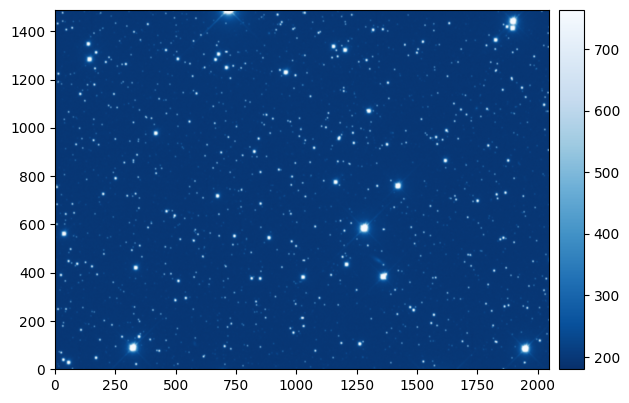

In [ ]:
vis_data('/content/sdss_counts_small/content/sdss_counts_small/sdss_counts_frame-r-000211-5-0357.npy', show_scale='stdpipe')

In [ ]:
def download_ps1_wrapper(df_for_save_cuts, path_sdss, dir_name='ps1_counts_small'):
    tmpl = get_hips_image(
        'PanSTARRS/DR1/r',
        get_header=True,
        fits_path=path_sdss,
    )
    bname = os.path.basename(path_sdss)
    out_path = os.path.join(dir_name, f'ps1_counts_{bname.split(".")[0]}.npy')

    if os.path.exists(out_path):
        return
    np.save(out_path, tmpl)
    idx_ = df_for_save_cuts.index[df_for_save_cuts['file_name'] == bname][0]
    df_for_save_cuts.at[idx_, 'counts_ps1_save_path'] = out_path


In [ ]:
os.makedirs('ps1_counts_small', exist_ok=True)

In [ ]:
dir_name = "/content/sdss_orig/content/sdss_orig/r_band.bz2/"
files = df_for_save_cuts['file_name'].values
total_downloads = len(files)


print(f"Started: {time.strftime('%Y-%m-/d ZH: %M:%S')}")
# Use ThreadPoolExecutor to perform parallel downloads
with concurrent.futures.ThreadPoolExecutor(max_workers=16) as executor:
    futures = []

    for path_file in files:
        path_sdss = os.path.join(dir_name, path_file)
        futures.append(executor.submit(download_ps1_wrapper, df_for_save_cuts, path_sdss))

    for _ in tqdm(concurrent.futures.as_completed(futures), total=total_downloads, desc="Converting to counts"):  # progress bar
        pass

Started: 2025-06-/d ZH: 07:35


Converting to counts:   0%|          | 0/100 [00:00<?, ?it/s]

Changed DATE-OBS from '29/10/98' to '1998-10-29''. [astropy.wcs.wcs]
Changed DATE-OBS from '29/10/98' to '1998-10-29''.
the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]
the RADECSYS keyword is deprecated, use RADESYSa.
Changed DATE-OBS from '21/03/99' to '1999-03-21''. [astropy.wcs.wcs]
Changed DATE-OBS from '21/03/99' to '1999-03-21''.
Changed DATE-OBS from '20/03/99' to '1999-03-20''. [astropy.wcs.wcs]
Changed DATE-OBS from '20/03/99' to '1999-03-20''.


In [ ]:
len(os.listdir('/content/ps1_counts_small')) == len(df_for_save_cuts)

False

In [ ]:
null_indexes = df_for_save_cuts[df_for_save_cuts['counts_ps1_save_path'] == ''].index
null_indexes

Index([31, 48, 51, 52, 68, 69, 73, 74, 75, 76, 96, 98], dtype='int64')

In [ ]:
df_for_save_cuts_drop = df_for_save_cuts.drop(null_indexes, axis=0)
df_for_save_cuts_drop

,objid,ra,dec,r,run,rerun,camcol,field,specobjid,class,counts_sdss_save_path,file_name,counts_ps1_save_path
0,1237646381542606068,94.503047,0.475851,16.80027,211,301,5,357,1417553661621463040,STAR,sdss_counts_small/sdss_counts_frame-r-000211-5...,frame-r-000211-5-0357.fits.bz2,ps1_counts_small/ps1_counts_frame-r-000211-5-0...
1,1237646381542670881,94.597311,0.500819,17.08153,211,301,5,358,1417555585766811648,STAR,sdss_counts_small/sdss_counts_frame-r-000211-5...,frame-r-000211-5-0358.fits.bz2,ps1_counts_small/ps1_counts_frame-r-000211-5-0...
2,1237646381542736528,94.756596,0.545981,16.64779,211,301,5,359,1417551737476114432,STAR,sdss_counts_small/sdss_counts_frame-r-000211-5...,frame-r-000211-5-0359.fits.bz2,ps1_counts_small/ps1_counts_frame-r-000211-5-0...
3,1237646381542801444,94.826608,0.511579,15.49622,211,301,5,360,1417552012354021376,STAR,sdss_counts_small/sdss_counts_frame-r-000211-5...,frame-r-000211-5-0360.fits.bz2,ps1_counts_small/ps1_counts_frame-r-000211-5-0...
4,1237646381542867136,94.986275,0.462755,17.01908,211,301,5,361,1417541566993557504,STAR,sdss_counts_small/sdss_counts_frame-r-000211-5...,frame-r-000211-5-0361.fits.bz2,ps1_counts_small/ps1_counts_frame-r-000211-5-0...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,1237648704047808524,200.691349,-0.212608,15.08454,752,301,3,382,3723381861637005312,STAR,sdss_counts_small/sdss_counts_frame-r-000752-3...,frame-r-000752-3-0382.fits.bz2,ps1_counts_small/ps1_counts_frame-r-000752-3-0...
94,1237648704047874085,200.874829,-0.254613,16.30418,752,301,3,383,3723370866520727552,STAR,sdss_counts_small/sdss_counts_frame-r-000752-3...,frame-r-000752-3-0383.fits.bz2,ps1_counts_small/ps1_counts_frame-r-000752-3-0...
95,1237648704047939595,200.990537,-0.217252,17.30969,752,301,3,384,3723369492131192832,STAR,sdss_counts_small/sdss_counts_frame-r-000752-3...,frame-r-000752-3-0384.fits.bz2,ps1_counts_small/ps1_counts_frame-r-000752-3-0...
97,1237648704585793672,203.261041,0.077179,18.25611,752,301,4,399,4555570887274027008,STAR,sdss_counts_small/sdss_counts_frame-r-000752-4...,frame-r-000752-4-0399.fits.bz2,ps1_counts_small/ps1_counts_frame-r-000752-4-0...


In [ ]:
import shutil
import os

base_dir_sdss = '/content/sdss_counts_small/content/'

save_dir_sdss = f'sdss_counts_small_{len(df_for_save_cuts_drop)}'
save_dir_ps1 = f'ps1_counts_small_{len(df_for_save_cuts_drop)}'
os.makedirs(save_dir_sdss, exist_ok=True)
os.makedirs(save_dir_ps1, exist_ok=True)

files_sdss = [os.path.join(base_dir_sdss, fname) for fname in df_for_save_cuts_drop['counts_sdss_save_path'].values]
files_ps1 = [fname for fname in df_for_save_cuts_drop['counts_ps1_save_path'].values]

for src_file_sdss, src_file_ps1  in tqdm(zip(files_sdss, files_ps1), total=len(files_sdss)):
    bname_sdss = os.path.basename(src_file_sdss)
    bname_ps1 = os.path.basename(src_file_ps1)

    dst_file_sdss = os.path.join(save_dir_sdss, bname_sdss)
    dst_file_ps1 = os.path.join(save_dir_ps1, bname_ps1)

    shutil.copy(src_file_sdss, dst_file_sdss)
    shutil.copy(src_file_ps1, dst_file_ps1)

print("File copied successfully!")


  0%|          | 0/88 [00:00<?, ?it/s]

File copied successfully!


In [ ]:
len(os.listdir(save_dir_sdss)) == len(os.listdir(save_dir_ps1))

True

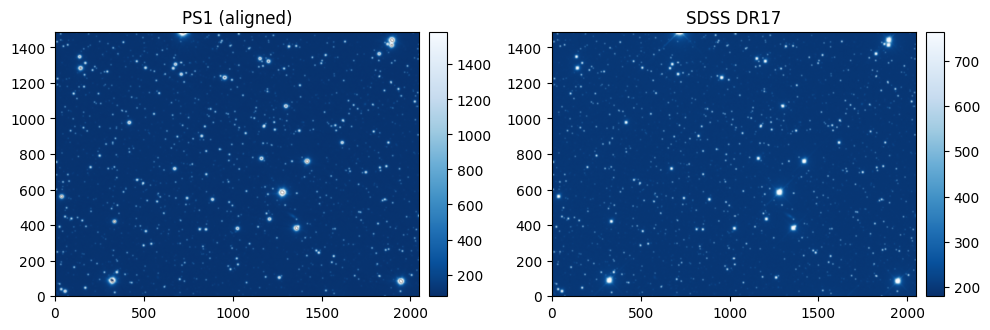

In [ ]:
vis_data([f'/content/{save_dir_ps1}/ps1_counts_frame-r-000211-5-0357.npy', f'/content/{save_dir_sdss}/sdss_counts_frame-r-000211-5-0357.npy'],
         show_scale='stdpipe')

In [ ]:
save_dir_sdss, save_dir_ps1

('sdss_counts_small_88', 'ps1_counts_small_88')

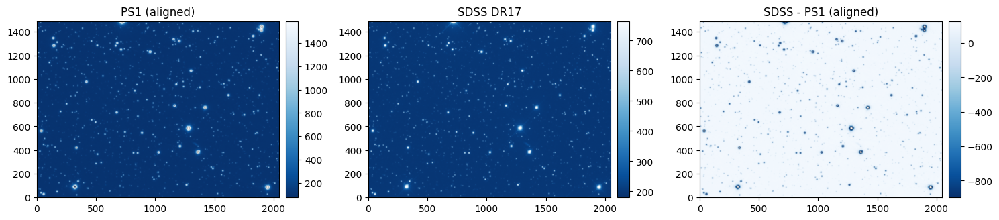

In [ ]:
sdss_img = np.load(f'/content/{save_dir_sdss}/sdss_counts_frame-r-000211-5-0357.npy')
ps1_img = np.load(f'/content/{save_dir_ps1}/ps1_counts_frame-r-000211-5-0357.npy')

vis_data([ps1_img, sdss_img, sdss_img - ps1_img],
         show_scale='stdpipe', save=True, save_name='diff_full.png', titles=['PS1 (aligned)', 'SDSS DR17', 'SDSS - PS1 (aligned)'])

In [ ]:
ps1_img.shape

(1489, 2048)

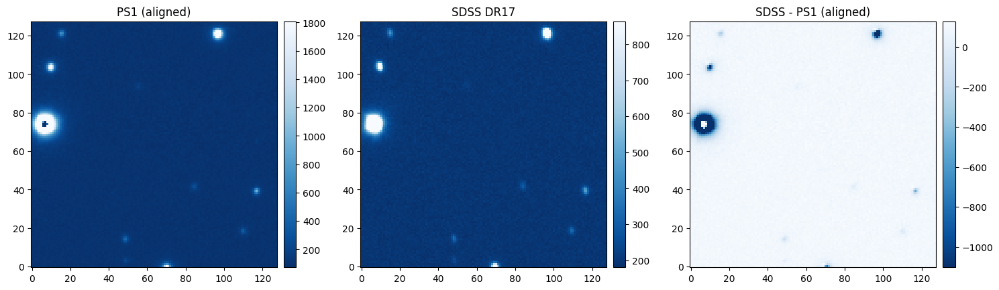

In [ ]:
sdss_img = np.load(f'/content/{save_dir_sdss}/sdss_counts_frame-r-000211-5-0357.npy')
ps1_img = np.load(f'/content/{save_dir_ps1}/ps1_counts_frame-r-000211-5-0357.npy')

a = 300
b = a + 128

c = 842
d = c + 128
vis_data([ps1_img[a:b, c:d], sdss_img[a:b, c:d], sdss_img[a:b, c:d] - ps1_img[a:b, c:d]],
         show_scale='stdpipe', save=False, save_name='diff_full.png', titles=['PS1 (aligned)', 'SDSS DR17', 'SDSS - PS1 (aligned)'])

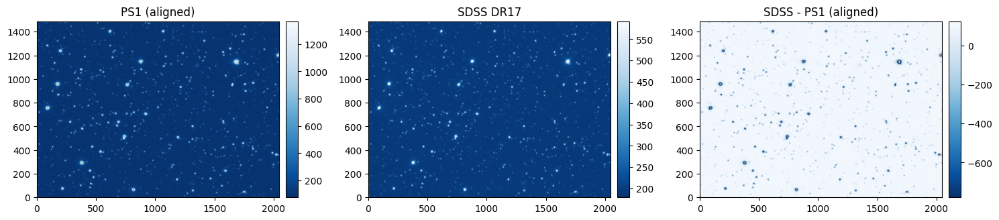

In [ ]:
sdss_img = np.load('/content/sdss_counts_small_100/sdss_counts_frame-r-000211-5-0359.npy')
ps1_img = np.load('/content/ps1_counts_small_100/ps1_counts_frame-r-000211-5-0359.npy')

vis_data([ps1_img, sdss_img, sdss_img - ps1_img],
         show_scale='stdpipe', save=True, save_name='diff_full.png', titles=['PS1 (aligned)', 'SDSS DR17', 'SDSS - PS1 (aligned)'])

In [ ]:
# df_for_save_cuts_drop.to_csv('df_for_save_cuts_drop_ps1_sdss.csv', index=False)
df_for_save_cuts_drop.to_csv('df_for_save_cuts_drop.csv', index=False)

In [ ]:
cmd = f"zip -r /content/{save_dir_sdss}.zip /content/{save_dir_sdss}"
!{cmd}

  adding: content/sdss_counts_small_88/ (stored 0%)
  adding: content/sdss_counts_small_88/sdss_counts_frame-r-000752-2-0367.npy (deflated 53%)
  adding: content/sdss_counts_small_88/sdss_counts_frame-r-000752-3-0380.npy (deflated 53%)
  adding: content/sdss_counts_small_88/sdss_counts_frame-r-000752-3-0383.npy (deflated 53%)
  adding: content/sdss_counts_small_88/sdss_counts_frame-r-000211-5-0360.npy (deflated 51%)
  adding: content/sdss_counts_small_88/sdss_counts_frame-r-000745-6-0550.npy (deflated 53%)
  adding: content/sdss_counts_small_88/sdss_counts_frame-r-000752-2-0371.npy (deflated 53%)
  adding: content/sdss_counts_small_88/sdss_counts_frame-r-000745-5-0606.npy (deflated 53%)
  adding: content/sdss_counts_small_88/sdss_counts_frame-r-000745-5-0607.npy (deflated 53%)
  adding: content/sdss_counts_small_88/sdss_counts_frame-r-000745-6-0558.npy (deflated 53%)
  adding: content/sdss_counts_small_88/sdss_counts_frame-r-000752-2-0360.npy (deflated 52%)
  adding: content/sdss_count

In [ ]:
# cmd = f"zip -r /content/{save_dir_sdss}.zip /content/{save_dir_sdss}"
# !{cmd}
cmd = f"zip -r /content/{save_dir_ps1}.zip /content/{save_dir_ps1}"
!{cmd}

  adding: content/ps1_counts_small_88/ (stored 0%)
  adding: content/ps1_counts_small_88/ps1_counts_frame-r-000745-6-0533.npy (deflated 7%)
  adding: content/ps1_counts_small_88/ps1_counts_frame-r-000745-6-0551.npy (deflated 7%)
  adding: content/ps1_counts_small_88/ps1_counts_frame-r-000211-5-0360.npy (deflated 7%)
  adding: content/ps1_counts_small_88/ps1_counts_frame-r-000745-6-0605.npy (deflated 7%)
  adding: content/ps1_counts_small_88/ps1_counts_frame-r-000752-3-0366.npy (deflated 7%)
  adding: content/ps1_counts_small_88/ps1_counts_frame-r-000752-1-0264.npy (deflated 7%)
  adding: content/ps1_counts_small_88/ps1_counts_frame-r-000745-6-0574.npy (deflated 7%)
  adding: content/ps1_counts_small_88/ps1_counts_frame-r-000752-3-0378.npy (deflated 7%)
  adding: content/ps1_counts_small_88/ps1_counts_frame-r-000211-5-0363.npy (deflated 7%)
  adding: content/ps1_counts_small_88/ps1_counts_frame-r-000752-4-0399.npy (deflated 7%)
  adding: content/ps1_counts_small_88/ps1_counts_frame-r-00

In [ ]:
shutil.copy(f"/content/{save_dir_ps1}.zip", f"/content/drive/MyDrive/Colab_Notebooks/astro/data/{save_dir_ps1}.zip")

'/content/drive/MyDrive/Colab_Notebooks/astro/data/ps1_counts_small_88.zip'

In [ ]:
shutil.copy(f"/content/{save_dir_sdss}.zip", f"/content/drive/MyDrive/Colab_Notebooks/astro/data/{save_dir_sdss}.zip")

'/content/drive/MyDrive/Colab_Notebooks/astro/data/sdss_counts_small_88.zip'

## cutouts sampling

now we have all data to make a resampling: cutout rundom $128 \times 128$ frames from the original images several times (69 to be more precise)

In [ ]:
!unzip /content/drive/MyDrive/Colab_Notebooks/astro/data/sdss_counts_small_88.zip -d /content/sdss_counts_small_88
!unzip /content/drive/MyDrive/Colab_Notebooks/astro/data/ps1_counts_small_88.zip -d /content/ps1_counts_small_88

Archive:  /content/drive/MyDrive/Colab_Notebooks/astro/data/sdss_counts_small_88.zip
   creating: /content/sdss_counts_small_88/content/sdss_counts_small_88/
  inflating: /content/sdss_counts_small_88/content/sdss_counts_small_88/sdss_counts_frame-r-000752-2-0367.npy  
  inflating: /content/sdss_counts_small_88/content/sdss_counts_small_88/sdss_counts_frame-r-000752-3-0380.npy  
  inflating: /content/sdss_counts_small_88/content/sdss_counts_small_88/sdss_counts_frame-r-000752-3-0383.npy  
  inflating: /content/sdss_counts_small_88/content/sdss_counts_small_88/sdss_counts_frame-r-000211-5-0360.npy  
  inflating: /content/sdss_counts_small_88/content/sdss_counts_small_88/sdss_counts_frame-r-000745-6-0550.npy  
  inflating: /content/sdss_counts_small_88/content/sdss_counts_small_88/sdss_counts_frame-r-000752-2-0371.npy  
  inflating: /content/sdss_counts_small_88/content/sdss_counts_small_88/sdss_counts_frame-r-000745-5-0606.npy  
  inflating: /content/sdss_counts_small_88/content/sdss_co

In [ ]:
import os
import pandas as pd
import concurrent.futures
from tqdm.notebook import tqdm  # Loading bar
import time

import numpy as np
from astropy.io import fits

import shutil

In [ ]:
df_cutouts = pd.DataFrame(columns=['fname', 'corners', 'base_path', 'cut_id'])
df_cutouts

,fname,corners,base_path,cut_id


In [ ]:
import threading
df_lock = threading.Lock()    # protects df_cutouts

In [ ]:
# !rm -rf cutouts

In [ ]:
os.makedirs("cutouts", exist_ok=True)

In [ ]:
save_dir_sdss, save_dir_ps1

('sdss_counts_small_88', 'ps1_counts_small_88')

In [ ]:
save_dir_sdss = 'sdss_counts_small_88'
save_dir_ps1 = 'ps1_counts_small_88'

In [ ]:
def sort_fnames(fname):
    return fname.split('.')[0].split('_')[-1]


path_c_sdss = f'/content/{save_dir_sdss}/content/{save_dir_sdss}'
path_c_ps1 = f'/content/{save_dir_ps1}/content/{save_dir_ps1}'

sdss_files = os.listdir(path_c_sdss)
ps1_files = os.listdir(path_c_ps1)

sdss_sorted_fnames = sorted(sdss_files, key=sort_fnames)
ps1_sorted_fnames = sorted(ps1_files, key=sort_fnames)

total_downloads = len(sdss_sorted_fnames)

assert total_downloads == len(ps1_sorted_fnames)

i = 0
for sdss_fname, ps1_fname in zip(sdss_sorted_fnames, ps1_sorted_fnames):
    if sort_fnames(sdss_fname) != sort_fnames(ps1_fname):
        print(sdss_fname, ps1_fname)
        i += 1

print(i)

0


In [ ]:
def create_cutouts_wrapper(paths):
    global df_cutouts

    path_sdss, path_ps1 = paths
    base_save_fpath = os.path.basename(path_sdss).split('.')[0]
    cuts_save_bname = f"sdss_ps1_counts_cut_{base_save_fpath.split('_')[-1]}"

    sdss_c, ps1_c = np.load(path_sdss), np.load(path_ps1)
    data = np.stack([sdss_c, ps1_c], axis=0)

    cut_info = create_cutouts(data, cuts_save_bname, cutout_size=(128, 128), num_cutouts=69, output_dir='cutouts')
    with df_lock:
        df_cutouts = pd.concat([df_cutouts, pd.DataFrame(cut_info)], ignore_index=True)

In [ ]:
print(f"Started: {time.strftime('%Y-%m-/d ZH: %M:%S')}")
# Use ThreadPoolExecutor to perform parallel downloads
with concurrent.futures.ThreadPoolExecutor(max_workers=16) as executor:
    futures = []

    for sdss_path_file, ps1_path_file in zip(sdss_sorted_fnames, ps1_sorted_fnames):
        path_sdss = os.path.join(path_c_sdss, sdss_path_file)
        path_ps1 = os.path.join(path_c_ps1, ps1_path_file)

        futures.append(executor.submit(create_cutouts_wrapper, paths=(path_sdss, path_ps1)))

    for feature in tqdm(concurrent.futures.as_completed(futures), total=total_downloads, desc="get cutouts"):  # progress bar
        try:
            feature.result()
        except Exception as e:
            print(f"Error: {e}")

print(f"Completed: {time.strftime('%Y-%m-/d ZH: %M:%S')}")

Started: 2025-06-/d ZH: 27:54


get cutouts:   0%|          | 0/88 [00:00<?, ?it/s]

Completed: 2025-06-/d ZH: 28:23


In [ ]:
len(os.listdir('/content/cutouts')) == len(df_cutouts)

True

In [ ]:
len(df_cutouts), len(os.listdir('/content/cutouts'))

(6072, 6072)

In [ ]:
dir_name = '/content/cutouts'
for fname in os.listdir('/content/cutouts'):
    img = np.load(os.path.join(dir_name, fname))
    if img.shape != (2, 128, 128):
        print(fname)

In [ ]:
df_cutouts

,fname,corners,base_path,cut_id
0,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(649, 777, 488, 616)",frame-r-000211-5-0357,1
1,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(129, 257, 1691, 1819)",frame-r-000211-5-0357,2
2,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(871, 999, 299, 427)",frame-r-000211-5-0357,3
3,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(1314, 1442, 1763, 1891)",frame-r-000211-5-0357,4
4,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(517, 645, 290, 418)",frame-r-000211-5-0357,5
...,...,...,...,...
6067,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(90, 218, 436, 564)",frame-r-000752-4-0403,65
6068,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(739, 867, 1527, 1655)",frame-r-000752-4-0403,66
6069,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(1055, 1183, 1862, 1990)",frame-r-000752-4-0403,67
6070,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(587, 715, 1038, 1166)",frame-r-000752-4-0403,68


In [ ]:
df_cutouts.to_csv('cutouts_norm.csv', index=False)

In [ ]:
!zip -r '/content/cutouts_norm.zip' '/content/cutouts'

Выходные данные были обрезаны до нескольких последних строк (5000).
  adding: content/cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0360__128_cutout_065.npy (deflated 29%)
  adding: content/cutouts/sdss_ps1_counts_cut_frame-r-000745-6-0541__128_cutout_052.npy (deflated 29%)
  adding: content/cutouts/sdss_ps1_counts_cut_frame-r-000752-2-0368__128_cutout_014.npy (deflated 30%)
  adding: content/cutouts/sdss_ps1_counts_cut_frame-r-000745-6-0562__128_cutout_039.npy (deflated 29%)
  adding: content/cutouts/sdss_ps1_counts_cut_frame-r-000745-6-0583__128_cutout_025.npy (deflated 29%)
  adding: content/cutouts/sdss_ps1_counts_cut_frame-r-000752-2-0371__128_cutout_052.npy (deflated 30%)
  adding: content/cutouts/sdss_ps1_counts_cut_frame-r-000752-2-0371__128_cutout_069.npy (deflated 30%)
  adding: content/cutouts/sdss_ps1_counts_cut_frame-r-000752-2-0360__128_cutout_007.npy (deflated 29%)
  adding: content/cutouts/sdss_ps1_counts_cut_frame-r-000211-6-0359__128_cutout_012.npy (deflated 29%)
  add

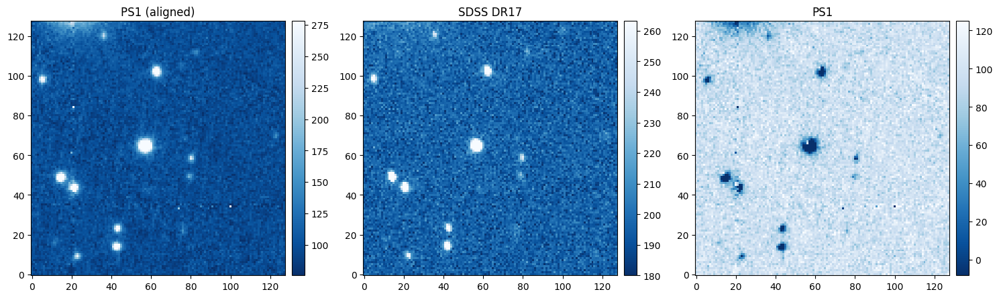

In [ ]:
sdss_img, ps1_img = np.load('/content/cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0359__128_cutout_045.npy')
vis_data([ps1_img, sdss_img, sdss_img - ps1_img], show_scale='stdpipe')

In [ ]:
shutil.copy(f"/content/cutouts_norm.zip", f"/content/drive/MyDrive/Colab_Notebooks/astro/data/cutouts_norm.zip")

'/content/drive/MyDrive/Colab_Notebooks/astro/data/cutouts_norm.zip'

## transient modeling

now we are ready to generate transients and apply them to sdss cutout images acquiring the sci images, the ps1 cutouts serve as ref images

In [ ]:
import os
import pandas as pd
import concurrent.futures
from tqdm.notebook import tqdm  # Loading bar
import time

import numpy as np
from astropy.io import fits

import shutil

In [ ]:
!unzip /content/drive/MyDrive/Colab_Notebooks/astro/data/cutouts_norm.zip -d /content/cutouts_norm

Streaming output truncated to the last 5000 lines.
  inflating: /content/cutouts/content/cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0360__128_cutout_065.npy  
  inflating: /content/cutouts/content/cutouts/sdss_ps1_counts_cut_frame-r-000745-6-0541__128_cutout_052.npy  
  inflating: /content/cutouts/content/cutouts/sdss_ps1_counts_cut_frame-r-000752-2-0368__128_cutout_014.npy  
  inflating: /content/cutouts/content/cutouts/sdss_ps1_counts_cut_frame-r-000745-6-0562__128_cutout_039.npy  
  inflating: /content/cutouts/content/cutouts/sdss_ps1_counts_cut_frame-r-000745-6-0583__128_cutout_025.npy  
  inflating: /content/cutouts/content/cutouts/sdss_ps1_counts_cut_frame-r-000752-2-0371__128_cutout_052.npy  
  inflating: /content/cutouts/content/cutouts/sdss_ps1_counts_cut_frame-r-000752-2-0371__128_cutout_069.npy  
  inflating: /content/cutouts/content/cutouts/sdss_ps1_counts_cut_frame-r-000752-2-0360__128_cutout_007.npy  
  inflating: /content/cutouts/content/cutouts/sdss_ps1_counts_cut_fra

In [ ]:
df_cutouts = pd.read_csv('/content/cutouts_norm.csv')

for col_name in ['transient_save_path', 'x_0', 'y_0', 'amplitude', 'model_shape', 'gamma', 'alpha', 'flux']:
    df_cutouts[col_name] = np.empty((len(df_cutouts), 0)).tolist()

In [ ]:
df_cutouts

,fname,corners,base_path,cut_id,transient_save_path,x_0,y_0,amplitude,model_shape,gamma,alpha,flux
0,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(649, 777, 488, 616)",frame-r-000211-5-0357,1,[],[],[],[],[],[],[],[]
1,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(129, 257, 1691, 1819)",frame-r-000211-5-0357,2,[],[],[],[],[],[],[],[]
2,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(871, 999, 299, 427)",frame-r-000211-5-0357,3,[],[],[],[],[],[],[],[]
3,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(1314, 1442, 1763, 1891)",frame-r-000211-5-0357,4,[],[],[],[],[],[],[],[]
4,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(517, 645, 290, 418)",frame-r-000211-5-0357,5,[],[],[],[],[],[],[],[]
...,...,...,...,...,...,...,...,...,...,...,...,...
6067,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(90, 218, 436, 564)",frame-r-000752-4-0403,65,[],[],[],[],[],[],[],[]
6068,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(739, 867, 1527, 1655)",frame-r-000752-4-0403,66,[],[],[],[],[],[],[],[]
6069,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(1055, 1183, 1862, 1990)",frame-r-000752-4-0403,67,[],[],[],[],[],[],[],[]
6070,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(587, 715, 1038, 1166)",frame-r-000752-4-0403,68,[],[],[],[],[],[],[],[]


In [ ]:
import threading
df_lock = threading.Lock()    # protects df_cutouts

In [ ]:
def gen_transient_wrapper(data, fname, prob_second=0.01, prob_zero=0.01, scale_min=1e2, scale_max=0.75 * 1e6, dir_save='transients'):
    global df_cutouts

    data_shape = data.shape  # [2, 128, 128]
    if data_shape[1] * data_shape[2] < 128 ** 2:
        print(f'bad shape: {data_shape}')
        return

    data = np.where(np.isnan(data), scale_min, data)  # mask nan values from all data (sci, ref) images as scale_min
    data = np.clip(data, scale_min, scale_max)

    transient, mask, params_table = gen_transient(data_shape)
    data[0, :, :] += transient  # add transient to SDSS image
    data_full = np.concatenate([data, mask[np.newaxis, :], transient[np.newaxis, :]], axis=0)  # (4, 128, 128)

    idx_ = df_cutouts.index[df_cutouts['fname'] == f'cutouts/{fname}'][0]
    with df_lock:
        df_cutouts.loc[idx_, list(params_table.keys())] = pd.Series({k: v for k, v in params_table.items()})

    # second transient
    num = np.random.random()
    if  num < prob_second:
        transient, mask, params_table = gen_transient(data_shape, add_min_val=False)  # don't want background for 2nd point source

        data_full[0, :, :] += transient  # add second transient to SDSS image

        data_full[-1, :, :] += transient  # add second transient point source (as grtr)
        data_full[2, :, :] = np.logical_or(data_full[2, :, :], mask)  # update mask with second transient source

        with df_lock:
            for col_name in params_table.keys():
                df_cutouts.at[idx_, col_name].extend(params_table[col_name])

    # zero gt
    if prob_second < num < prob_second + prob_zero:
        data_full[-1, :, :] = np.zeros(data_shape[-2:]) + scale_min
        with df_lock:
            df_cutouts.loc[idx_, list(params_table.keys())] = pd.Series({k: [0] for k, v in params_table.items()})

    out_path = os.path.join(dir_save, f'transient_{os.path.basename(df_cutouts.loc[idx_]["fname"]).split(".")[0]}.npy')

    np.save(out_path, data_full)
    with df_lock:
        df_cutouts.at[idx_, 'transient_save_path'] = out_path

In [ ]:
# !rm -rf transients

In [ ]:
os.makedirs("transients", exist_ok=True)

In [ ]:
dir_path = '/content/cutouts'

files = os.listdir(dir_path)
total_downloads = len(files)


print(f"Started: {time.strftime('%Y-%m-/d ZH: %M:%S')}")
# Use ThreadPoolExecutor to perform parallel downloads
with concurrent.futures.ThreadPoolExecutor(max_workers=16) as executor:
    futures = []

    for fname in files:
        data_path = os.path.join(dir_path, fname)
        data = np.load(data_path)

        futures.append(executor.submit(gen_transient_wrapper, data, fname))

    for feature in tqdm(concurrent.futures.as_completed(futures), total=total_downloads, desc="Converting to counts"):  # progress bar
        try:
            feature.result()
        except Exception as e:
            print(e)

Started: 2025-06-/d ZH: 41:45


Converting to counts:   0%|          | 0/6072 [00:00<?, ?it/s]

In [ ]:
mask = df_cutouts['transient_save_path'].map(lambda x: len(x) != 0)
df_cutouts[mask]

,fname,corners,base_path,cut_id,transient_save_path,x_0,y_0,amplitude,model_shape,gamma,alpha,flux
0,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(649, 777, 488, 616)",frame-r-000211-5-0357,1,transients/transient_sdss_ps1_counts_cut_frame...,[55.90491310662407],[77.68271292199417],[620.8394612047113],"[(92, 92)]",[3.6514543255900387],[2.4150124501631876],[18378.102534280322]
1,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(129, 257, 1691, 1819)",frame-r-000211-5-0357,2,transients/transient_sdss_ps1_counts_cut_frame...,[54.22876757305861],[62.48733337189415],[1983.4105500574321],"[(99, 99)]",[4.1029148060955976],[4.637445733325652],[28837.059090772542]
2,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(871, 999, 299, 427)",frame-r-000211-5-0357,3,transients/transient_sdss_ps1_counts_cut_frame...,[46.72230169216452],[83.56218194937229],[26829.571640470196],"[(96, 96)]",[1.5197159982163093],[4.463900417888956],[56198.28779456861]
3,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(1314, 1442, 1763, 1891)",frame-r-000211-5-0357,4,transients/transient_sdss_ps1_counts_cut_frame...,[56.184686073055666],[58.01368678769568],[5478.888605322427],"[(95, 95)]",[1.3107624819053063],[2.9240983676543033],[15369.618093396308]
4,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(517, 645, 290, 418)",frame-r-000211-5-0357,5,transients/transient_sdss_ps1_counts_cut_frame...,[36.76779030966529],[75.77990181025292],[1064.9119783112951],"[(90, 90)]",[3.475838210984671],[4.124452219952333],[12936.262022463066]
...,...,...,...,...,...,...,...,...,...,...,...,...
6067,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(90, 218, 436, 564)",frame-r-000752-4-0403,65,transients/transient_sdss_ps1_counts_cut_frame...,[60.2062110583309],[48.65078263048537],[897.1275782847608],"[(93, 93)]",[3.8712279740655426],[4.81405749447152],[11074.250406403948]
6068,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(739, 867, 1527, 1655)",frame-r-000752-4-0403,66,transients/transient_sdss_ps1_counts_cut_frame...,[65.19775744842991],[54.67249031188213],[720.7410443021796],"[(95, 95)]",[4.259637483376662],[3.911563057392063],[14110.688578270285]
6069,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(1055, 1183, 1862, 1990)",frame-r-000752-4-0403,67,transients/transient_sdss_ps1_counts_cut_frame...,[33.44579067514993],[54.412308841949965],[3023.9218817852543],"[(99, 99)]",[3.2086242079177523],[3.3605711465338106],[41432.492222392044]
6070,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(587, 715, 1038, 1166)",frame-r-000752-4-0403,68,transients/transient_sdss_ps1_counts_cut_frame...,[79.48412895869295],[61.473252336879575],[3597.632999769191],"[(97, 97)]",[3.2927297865243936],[4.096053006463791],[39579.52047081536]


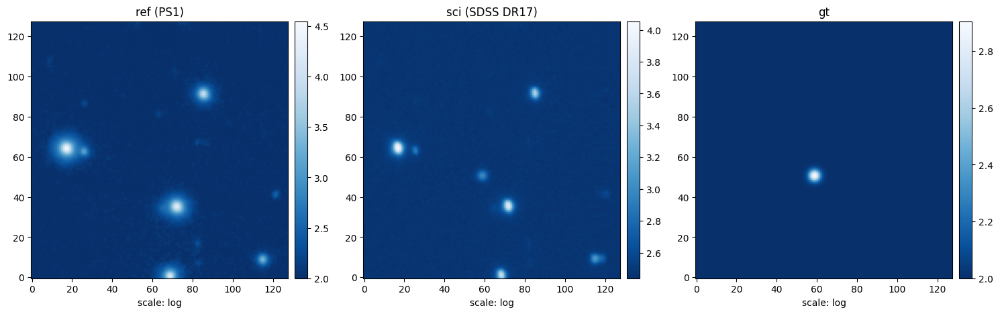

In [ ]:
sci, ref, _, grtr = np.load('/content/transients/transient_sdss_ps1_counts_cut_frame-r-000211-5-0357__128_cutout_012.npy')
vis_data([ref, sci, grtr],
         show_scale='log', save=True, save_name='example_triplet.png', titles=['ref (PS1)', 'sci (SDSS DR17)', 'gt'])

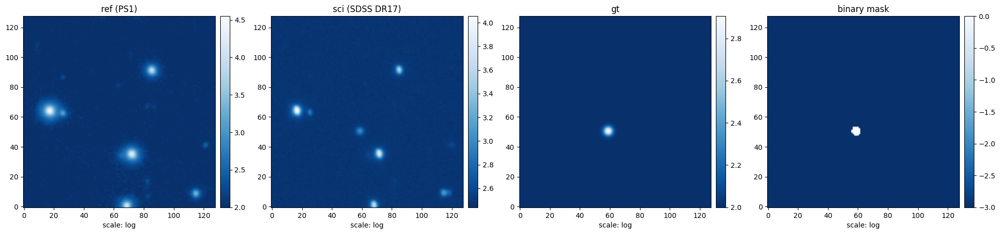

In [ ]:
sci, ref, mask, grtr = np.load('/content/transients/transient_sdss_ps1_counts_cut_frame-r-000211-5-0357__128_cutout_012.npy')
vis_data([ref, sci, grtr, mask],
         show_scale='log', save=True, save_name='example_train.png', titles=['ref (PS1)', 'sci (SDSS DR17)', 'gt', 'binary mask'])

In [ ]:
df_cutouts.to_csv('cutouts_norm_final.csv', index=False)

In [ ]:
!zip -r '/content/cutouts_norm_final.zip' '/content/transients'

Выходные данные были обрезаны до нескольких последних строк (5000).
  adding: content/transients/transient_sdss_ps1_counts_cut_frame-r-000752-2-0355__128_cutout_059.npy (deflated 61%)
  adding: content/transients/transient_sdss_ps1_counts_cut_frame-r-000211-5-0359__128_cutout_033.npy (deflated 61%)
  adding: content/transients/transient_sdss_ps1_counts_cut_frame-r-000745-6-0541__128_cutout_005.npy (deflated 62%)
  adding: content/transients/transient_sdss_ps1_counts_cut_frame-r-000752-3-0371__128_cutout_050.npy (deflated 61%)
  adding: content/transients/transient_sdss_ps1_counts_cut_frame-r-000211-6-0360__128_cutout_050.npy (deflated 67%)
  adding: content/transients/transient_sdss_ps1_counts_cut_frame-r-000745-6-0542__128_cutout_014.npy (deflated 60%)
  adding: content/transients/transient_sdss_ps1_counts_cut_frame-r-000752-3-0367__128_cutout_031.npy (deflated 60%)
  adding: content/transients/transient_sdss_ps1_counts_cut_frame-r-000745-6-0541__128_cutout_036.npy (deflated 62%)
  ad

In [ ]:
shutil.copy(f"/content/cutouts_norm_final.zip", f"/content/drive/MyDrive/Colab_Notebooks/astro/data/cutouts_norm_final.zip")

'/content/drive/MyDrive/Colab_Notebooks/astro/data/cutouts_norm_final.zip'

## normalising and stretching to [-1, 1] range

finally we can convert the data to [-1, 1] range essential for diffusion models.

p.s. eah, we can apply that transformation before in the transient generation stage but for the sake of simplicity we'll devide these stages in two steps.

In [ ]:
from astropy.visualization import LuptonAsinhStretch

s, Q = 0.07, 5.25
scale_min, scale_max = 1e2, 0.75 * 1e6


def lash_to_m1_1(data, s, Q, scale_min, scale_max):
    mask = np.arange(data.shape[0]) != 2
    norm_data     = np.empty_like(data, dtype=float)
    stretched_data = np.empty_like(data, dtype=float)

    norm_data[mask] = (data[mask] - scale_min) / (scale_max - scale_min)
    norm_data[~mask] = data[~mask]

    stretch = LuptonAsinhStretch(stretch=s, Q=Q)
    stretched_data[mask] = stretch(norm_data[mask])
    stretched_data[~mask] = norm_data[~mask]

    output = np.empty_like(data, dtype=float)
    output[mask]     = stretched_data[mask] * 2 - 1
    output[~mask]    = stretched_data[~mask]  # (or = norm_data[~mask], or = data[~mask], etc.)

    return output


def lash_from_m1_1(norm_data, s, Q, scale_min, scale_max):
    norm_data = (norm_data + 1) / 2  # Scale back to [0, 1]
    data = s / Q * np.sinh(norm_data / 0.1 * np.arcsinh(0.1 * Q))
    return data * (scale_max - scale_min) + scale_min


def get_linear_wrapper(data, save_path):
    data = lash_to_m1_1(data, s=s, Q=Q, scale_min=scale_min, scale_max=scale_max)
    np.save(save_path, data)


In [ ]:
# !rm -rf data_lin

In [ ]:
dir_path = '/content/transients/'
save_dir = '/content/data_lin/'
files = os.listdir(dir_path)
total_downloads = len(files)

os.makedirs(save_dir, exist_ok=True)

print(f"Started: {time.strftime('%Y-%m-/d ZH: %M:%S')}")
# Use ThreadPoolExecutor to perform parallel downloads
with concurrent.futures.ThreadPoolExecutor(max_workers=16) as executor:
    futures = []

    for idx, fname in enumerate(files):
        save_path = os.path.join(save_dir, fname)
        data_path = os.path.join(dir_path, fname)

        data = np.load(data_path)
        futures.append(executor.submit(get_linear_wrapper, data, save_path))

    for feature in tqdm(concurrent.futures.as_completed(futures), total=total_downloads, desc="Linearisation"):  # progress bar
        try:
            feature.result()
        except Exception as e:
            print(e)

Started: 2025-06-/d ZH: 22:47


Linearisation:   0%|          | 0/6072 [00:00<?, ?it/s]

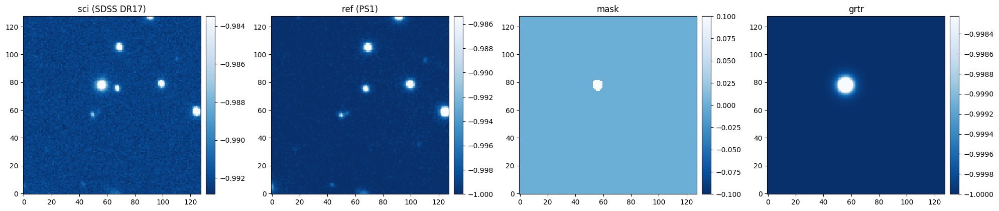

In [ ]:
imgs = np.load('/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000211-5-0357__128_cutout_001.npy')
vis_data([*imgs], titles=['sci (SDSS DR17)', 'ref (PS1)', 'mask', 'grtr'], show_scale='stdpipe', save=True, save_name='example_train_lin.png')

In [ ]:
!unzip /content/drive/MyDrive/Colab_Notebooks/astro/data/data_lin.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000745-6-0586__128_cutout_003.npy  
  inflating: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000752-2-0355__128_cutout_059.npy  
  inflating: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000211-5-0359__128_cutout_033.npy  
  inflating: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000745-6-0541__128_cutout_005.npy  
  inflating: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000752-3-0371__128_cutout_050.npy  
  inflating: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000211-6-0360__128_cutout_050.npy  
  inflating: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000745-6-0542__128_cutout_014.npy  
  inflating: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000752-3-0367__128_cutout_031.npy  
  inflating: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000745-6-0541__128_cutout_036.np

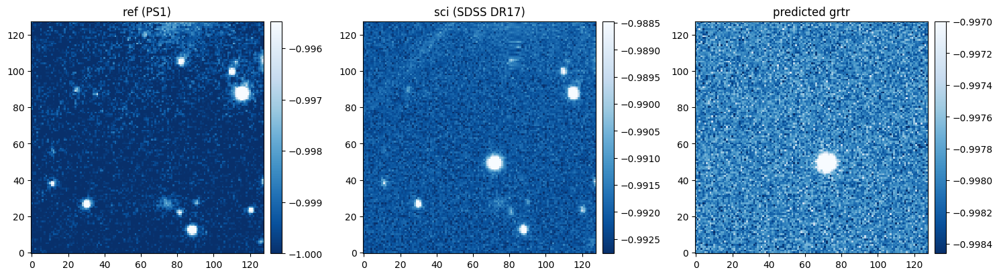

In [ ]:
scale_min = 1e2
sci, ref, _, grtr = np.load('/content/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000211-5-0357__128_cutout_069.npy')  # np.load('/content/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000211-5-0357__128_cutout_009.npy')

grtr_noised = grtr + 0.00002 * np.random.poisson(scale_min + grtr) + 0.0000005 * np.random.poisson(scale_min) +  0.000001 * np.random.poisson(np.abs(sci-ref))

vis_data([ref, sci, grtr_noised], titles=['ref (PS1)', 'sci (SDSS DR17)', 'predicted grtr'], show_scale='stdpipe', save=True, save_name='gen_fake.png')

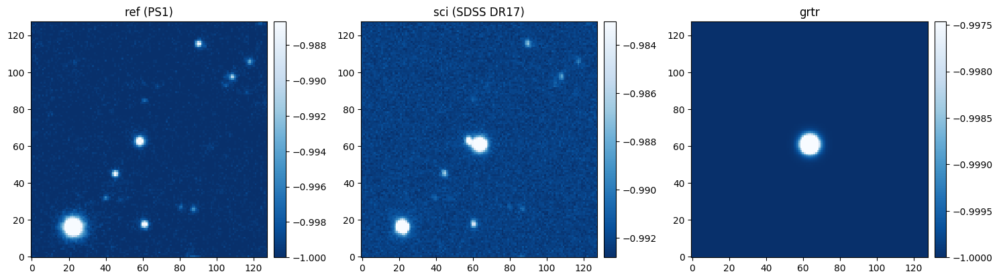

In [ ]:
scale_min = 1e2
sci, ref, _, grtr = np.load('/content/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000211-5-0358__128_cutout_065.npy')  # np.load('/content/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000211-5-0357__128_cutout_009.npy')

# grtr_noised = grtr + 0.00002 * np.random.poisson(scale_min + grtr) + 0.0000005 * np.random.poisson(scale_min) +  0.000001 * np.random.poisson(np.abs(sci-ref))

vis_data([ref, sci, grtr], titles=['ref (PS1)', 'sci (SDSS DR17)', 'grtr'], show_scale='stdpipe', save=True, save_name='bad_val_example_2.png')

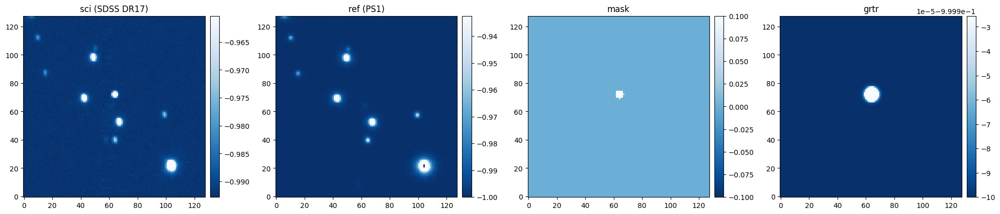

In [ ]:
imgs = np.load('/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000211-5-0357__128_cutout_007.npy')
vis_data([*imgs], titles=['sci (SDSS DR17)', 'ref (PS1)', 'mask', 'grtr'], show_scale='stdpipe')

In [ ]:
!zip -r '/content/data_lin.zip' '/content/data_lin'

Выходные данные были обрезаны до нескольких последних строк (5000).
  adding: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000745-6-0586__128_cutout_003.npy (deflated 64%)
  adding: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000752-2-0355__128_cutout_059.npy (deflated 63%)
  adding: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000211-5-0359__128_cutout_033.npy (deflated 64%)
  adding: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000745-6-0541__128_cutout_005.npy (deflated 64%)
  adding: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000752-3-0371__128_cutout_050.npy (deflated 63%)
  adding: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000211-6-0360__128_cutout_050.npy (deflated 68%)
  adding: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000745-6-0542__128_cutout_014.npy (deflated 63%)
  adding: content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000752-3-0367__128_cutout_031.npy (deflated 62%)
  adding: content/da

In [ ]:
shutil.copy(f"/content/data_lin.zip", f"/content/drive/MyDrive/Colab_Notebooks/astro/data/data_lin.zip")

'/content/drive/MyDrive/Colab_Notebooks/astro/data/data_lin.zip'

## split the final data into train and test datasets

In [ ]:
import os
import pandas as pd
from tqdm.notebook import tqdm
import shutil


In [ ]:
os.makedirs('dataset_trans', exist_ok=True)
os.makedirs('dataset_trans/train', exist_ok=True)
os.makedirs('dataset_trans/val', exist_ok=True)

the first 5k goes to train and 100 are for validation

In [ ]:
!unzip /content/drive/MyDrive/Colab_Notebooks/astro/data/data_lin.zip -d /content/data_lin

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: /content/data_lin/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000745-6-0586__128_cutout_003.npy  
  inflating: /content/data_lin/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000752-2-0355__128_cutout_059.npy  
  inflating: /content/data_lin/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000211-5-0359__128_cutout_033.npy  
  inflating: /content/data_lin/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000745-6-0541__128_cutout_005.npy  
  inflating: /content/data_lin/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000752-3-0371__128_cutout_050.npy  
  inflating: /content/data_lin/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000211-6-0360__128_cutout_050.npy  
  inflating: /content/data_lin/content/data_lin/transient_sdss_ps1_counts_cut_frame-r-000745-6-0542__128_cutout_014.npy  
  inflating: /content/data_lin/content/data_lin/transient_sdss_ps1_counts_cut_

In [ ]:
len(os.listdir('/content/data_lin/content/data_lin'))

6072

In [ ]:
df_cutouts = pd.read_csv('/content/cutouts_norm_final.csv')
df_cutouts

,fname,corners,base_path,cut_id,transient_save_path,x_0,y_0,amplitude,model_shape,gamma,alpha,flux
0,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(649, 777, 488, 616)",frame-r-000211-5-0357,1,transients/transient_sdss_ps1_counts_cut_frame...,[55.90491310662407],[77.68271292199417],[np.float64(620.8394612047113)],"[(92, 92)]",[3.6514543255900387],[2.4150124501631876],[np.float64(18378.102534280322)]
1,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(129, 257, 1691, 1819)",frame-r-000211-5-0357,2,transients/transient_sdss_ps1_counts_cut_frame...,[54.22876757305861],[62.48733337189415],[np.float64(1983.4105500574321)],"[(99, 99)]",[4.1029148060955976],[4.637445733325652],[np.float64(28837.059090772542)]
2,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(871, 999, 299, 427)",frame-r-000211-5-0357,3,transients/transient_sdss_ps1_counts_cut_frame...,[46.72230169216452],[83.56218194937229],[np.float64(26829.571640470196)],"[(96, 96)]",[1.5197159982163093],[4.463900417888956],[np.float64(56198.28779456861)]
3,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(1314, 1442, 1763, 1891)",frame-r-000211-5-0357,4,transients/transient_sdss_ps1_counts_cut_frame...,[56.184686073055666],[58.01368678769568],[np.float64(5478.888605322427)],"[(95, 95)]",[1.3107624819053063],[2.9240983676543033],[np.float64(15369.618093396308)]
4,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(517, 645, 290, 418)",frame-r-000211-5-0357,5,transients/transient_sdss_ps1_counts_cut_frame...,[36.76779030966529],[75.77990181025292],[np.float64(1064.9119783112951)],"[(90, 90)]",[3.475838210984671],[4.124452219952333],[np.float64(12936.262022463066)]
...,...,...,...,...,...,...,...,...,...,...,...,...
6067,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(90, 218, 436, 564)",frame-r-000752-4-0403,65,transients/transient_sdss_ps1_counts_cut_frame...,[60.2062110583309],[48.65078263048537],[np.float64(897.1275782847608)],"[(93, 93)]",[3.8712279740655426],[4.81405749447152],[np.float64(11074.250406403948)]
6068,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(739, 867, 1527, 1655)",frame-r-000752-4-0403,66,transients/transient_sdss_ps1_counts_cut_frame...,[65.19775744842991],[54.67249031188213],[np.float64(720.7410443021796)],"[(95, 95)]",[4.259637483376662],[3.911563057392063],[np.float64(14110.688578270285)]
6069,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(1055, 1183, 1862, 1990)",frame-r-000752-4-0403,67,transients/transient_sdss_ps1_counts_cut_frame...,[33.44579067514993],[54.412308841949965],[np.float64(3023.9218817852543)],"[(99, 99)]",[3.2086242079177523],[3.3605711465338106],[np.float64(41432.492222392044)]
6070,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(587, 715, 1038, 1166)",frame-r-000752-4-0403,68,transients/transient_sdss_ps1_counts_cut_frame...,[79.48412895869295],[61.473252336879575],[np.float64(3597.632999769191)],"[(97, 97)]",[3.2927297865243936],[4.096053006463791],[np.float64(39579.52047081536)]


In [ ]:
train_num = 6072 - 100
val_num = 100
df_cutouts['type'] = ['train'] * train_num + ['val'] * val_num
df_cutouts

,fname,corners,base_path,cut_id,transient_save_path,x_0,y_0,amplitude,model_shape,gamma,alpha,flux,type
0,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(649, 777, 488, 616)",frame-r-000211-5-0357,1,transients/transient_sdss_ps1_counts_cut_frame...,[55.90491310662407],[77.68271292199417],[np.float64(620.8394612047113)],"[(92, 92)]",[3.6514543255900387],[2.4150124501631876],[np.float64(18378.102534280322)],train
1,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(129, 257, 1691, 1819)",frame-r-000211-5-0357,2,transients/transient_sdss_ps1_counts_cut_frame...,[54.22876757305861],[62.48733337189415],[np.float64(1983.4105500574321)],"[(99, 99)]",[4.1029148060955976],[4.637445733325652],[np.float64(28837.059090772542)],train
2,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(871, 999, 299, 427)",frame-r-000211-5-0357,3,transients/transient_sdss_ps1_counts_cut_frame...,[46.72230169216452],[83.56218194937229],[np.float64(26829.571640470196)],"[(96, 96)]",[1.5197159982163093],[4.463900417888956],[np.float64(56198.28779456861)],train
3,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(1314, 1442, 1763, 1891)",frame-r-000211-5-0357,4,transients/transient_sdss_ps1_counts_cut_frame...,[56.184686073055666],[58.01368678769568],[np.float64(5478.888605322427)],"[(95, 95)]",[1.3107624819053063],[2.9240983676543033],[np.float64(15369.618093396308)],train
4,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(517, 645, 290, 418)",frame-r-000211-5-0357,5,transients/transient_sdss_ps1_counts_cut_frame...,[36.76779030966529],[75.77990181025292],[np.float64(1064.9119783112951)],"[(90, 90)]",[3.475838210984671],[4.124452219952333],[np.float64(12936.262022463066)],train
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6067,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(90, 218, 436, 564)",frame-r-000752-4-0403,65,transients/transient_sdss_ps1_counts_cut_frame...,[60.2062110583309],[48.65078263048537],[np.float64(897.1275782847608)],"[(93, 93)]",[3.8712279740655426],[4.81405749447152],[np.float64(11074.250406403948)],val
6068,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(739, 867, 1527, 1655)",frame-r-000752-4-0403,66,transients/transient_sdss_ps1_counts_cut_frame...,[65.19775744842991],[54.67249031188213],[np.float64(720.7410443021796)],"[(95, 95)]",[4.259637483376662],[3.911563057392063],[np.float64(14110.688578270285)],val
6069,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(1055, 1183, 1862, 1990)",frame-r-000752-4-0403,67,transients/transient_sdss_ps1_counts_cut_frame...,[33.44579067514993],[54.412308841949965],[np.float64(3023.9218817852543)],"[(99, 99)]",[3.2086242079177523],[3.3605711465338106],[np.float64(41432.492222392044)],val
6070,cutouts/sdss_ps1_counts_cut_frame-r-000752-4-0...,"(587, 715, 1038, 1166)",frame-r-000752-4-0403,68,transients/transient_sdss_ps1_counts_cut_frame...,[79.48412895869295],[61.473252336879575],[np.float64(3597.632999769191)],"[(97, 97)]",[3.2927297865243936],[4.096053006463791],[np.float64(39579.52047081536)],val


In [ ]:
dir_path = '/content/data_lin/content/data_lin'

for idx, data in tqdm(df_cutouts.iterrows(), desc='savings', total=len(os.listdir(dir_path))):
    save_dir = f"/content/dataset_trans/{data['type']}"

    bname = os.path.basename(data['transient_save_path'])
    shutil.copy(os.path.join(dir_path, bname),
                os.path.join(save_dir, bname)
            )


savings:   0%|          | 0/6072 [00:00<?, ?it/s]

In [ ]:
df_cutouts[df_cutouts['transient_save_path'] == 'transients/transient_sdss_ps1_counts_cut_frame-r-000211-5-0357__128_cutout_004.npy']

,fname,corners,base_path,cut_id,transient_save_path,x_0,y_0,amplitude,model_shape,gamma,alpha,flux,type
3,cutouts/sdss_ps1_counts_cut_frame-r-000211-5-0...,"(1314, 1442, 1763, 1891)",frame-r-000211-5-0357,4,transients/transient_sdss_ps1_counts_cut_frame...,[56.184686073055666],[58.01368678769568],[np.float64(5478.888605322427)],"[(95, 95)]",[1.3107624819053063],[2.9240983676543033],[np.float64(15369.618093396308)],train


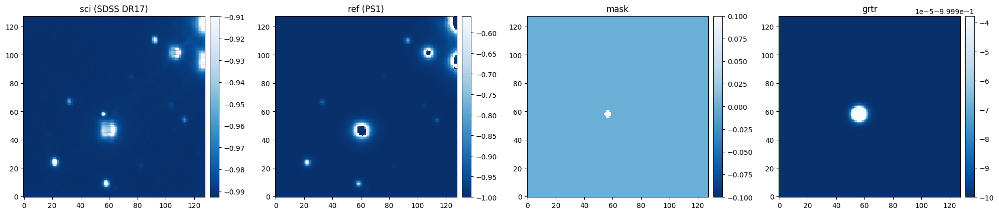

In [ ]:
imgs = np.load('/content/dataset_trans/train/transient_sdss_ps1_counts_cut_frame-r-000211-5-0357__128_cutout_004.npy')
vis_data([*imgs], titles=['sci (SDSS DR17)', 'ref (PS1)', 'mask', 'grtr'], show_scale='stdpipe')

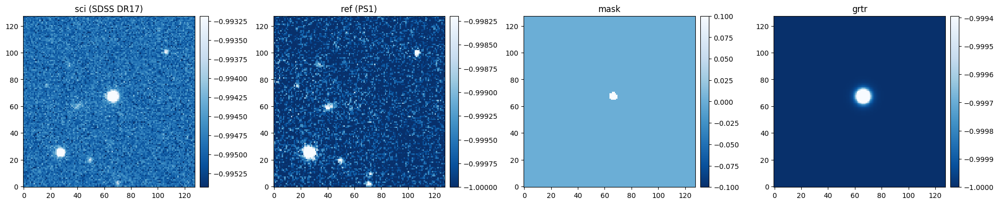

In [ ]:
imgs = np.load('/content/dataset_trans/val/transient_sdss_ps1_counts_cut_frame-r-000752-2-0364__128_cutout_004.npy')
vis_data([*imgs], titles=['sci (SDSS DR17)', 'ref (PS1)', 'mask', 'grtr'], show_scale='stdpipe')

In [ ]:
df_cutouts.to_csv('cutouts_norm_final_for_train_100_val.csv', index=False)

In [ ]:
!zip -r '/content/cutouts_norm_final_for_train_100_val.zip' '/content/dataset_trans'

Выходные данные были обрезаны до нескольких последних строк (5000).
  adding: content/dataset_trans/train/transient_sdss_ps1_counts_cut_frame-r-000745-6-0551__128_cutout_059.npy (deflated 63%)
  adding: content/dataset_trans/train/transient_sdss_ps1_counts_cut_frame-r-000752-2-0363__128_cutout_042.npy (deflated 64%)
  adding: content/dataset_trans/train/transient_sdss_ps1_counts_cut_frame-r-000745-6-0559__128_cutout_003.npy (deflated 65%)
  adding: content/dataset_trans/train/transient_sdss_ps1_counts_cut_frame-r-000752-2-0360__128_cutout_020.npy (deflated 64%)
  adding: content/dataset_trans/train/transient_sdss_ps1_counts_cut_frame-r-000752-2-0363__128_cutout_028.npy (deflated 63%)
  adding: content/dataset_trans/train/transient_sdss_ps1_counts_cut_frame-r-000752-3-0380__128_cutout_067.npy (deflated 62%)
  adding: content/dataset_trans/train/transient_sdss_ps1_counts_cut_frame-r-000752-3-0366__128_cutout_032.npy (deflated 64%)
  adding: content/dataset_trans/train/transient_sdss_ps1_

In [ ]:
shutil.copy(f"/content/cutouts_norm_final_for_train_100_val.zip", f"/content/drive/MyDrive/Colab_Notebooks/astro/data/cutouts_norm_final_for_train_100_val.zip")

'/content/drive/MyDrive/Colab_Notebooks/astro/data/cutouts_norm_final_for_train_100_val.zip'